<a href="https://colab.research.google.com/github/marianaadmc/ApPsiquiatry/blob/main/Watershed_two_step.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#!pip install opencv-python-headless

In [1]:
from skimage import filters, io, color, img_as_ubyte
import matplotlib.pyplot as plt
from math import floor
import numpy as np
from skimage.color import rgb2gray
from PIL import Image
import cv2
from skimage.measure import regionprops, label
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage.morphology import reconstruction, disk, opening, closing

In [2]:
image0161 = io.imread('image0161.jpg')
image2472 = io.imread('image2472.jpg')
image2472_sondas = io.imread('image2472_sondas.jpg')
image2949 = io.imread('image2949.jpg')
cels2472_sam = io.imread('cels_2472_bin.jpg')
cels2949_sam = io.imread('cels_2949_bin.jpg')
cels0161_sam = io.imread('cel_0161_bin.jpg')

# Preprocesamiento de la imagen

In [3]:
image0161_gris = rgb2gray(image0161)
image2472_gris = rgb2gray(image2472)
image2949_gris = rgb2gray(image2949)

# MC-Watershed

### Umbral Otsu vs Li

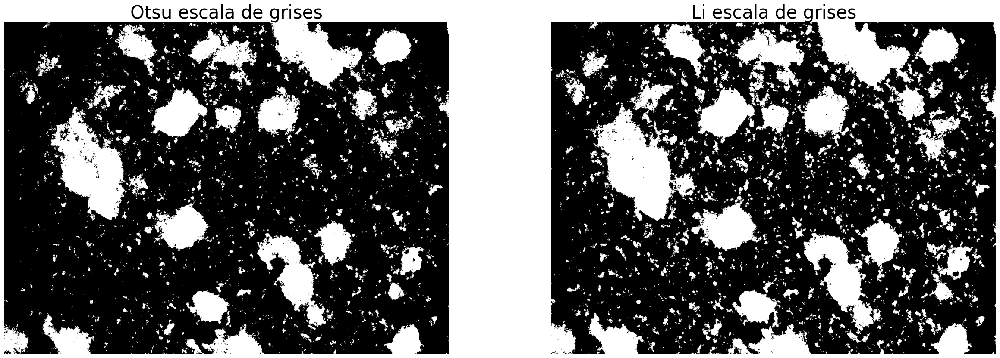

In [4]:
umbral_otsu0161 = filters.threshold_otsu(image0161_gris)
otsu0161 = image0161_gris > umbral_otsu0161

umbral_li0161 = filters.threshold_li(image0161_gris)
li0161 = image0161_gris > umbral_li0161

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(30, 10))
ax[0].imshow(otsu0161, cmap = "gray")
ax[0].set_title("Otsu escala de grises", fontsize=30)

ax[1].imshow(li0161, cmap = "gray")
ax[1].set_title("Li escala de grises", fontsize=30)

for a in ax:
    a.axis('off')

plt.show()

image0161_bin = np.zeros(li0161.shape)
for x in range(0, li0161.shape[0]):
  for y in range(0, li0161.shape[1]):
    if li0161[x][y] == True:
      image0161_bin[x][y] = 1

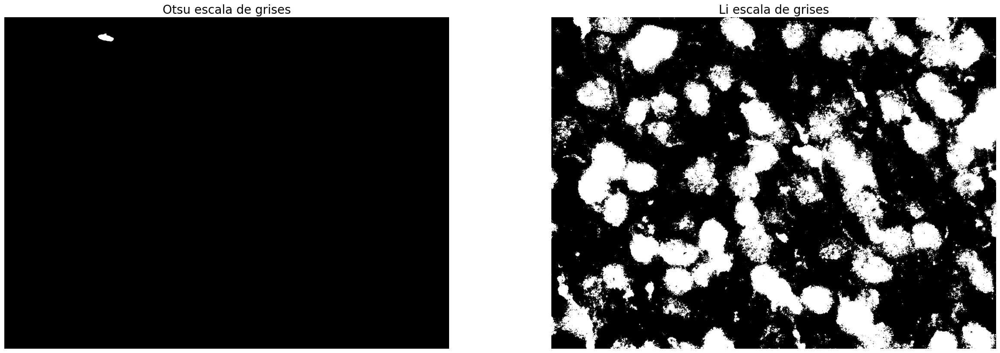

In [5]:
umbral_otsu2472 = filters.threshold_otsu(image2472_gris)
otsu2472 = image2472_gris > umbral_otsu2472

umbral_li2472 = filters.threshold_li(image2472_gris)
li2472 = image2472_gris > umbral_li2472

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(30, 10))
ax[0].imshow(otsu2472, cmap = "gray")
ax[0].set_title('Otsu escala de grises', fontsize=20)

ax[1].imshow(li2472, cmap = "gray")
ax[1].set_title('Li escala de grises', fontsize=20)

for a in ax:
    a.axis('off')

plt.show()

image2472_bin = np.zeros(li2472.shape)
for x in range(0, li2472.shape[0]):
  for y in range(0, li2472.shape[1]):
    if li2472[x][y] == True:
      image2472_bin[x][y] = 1


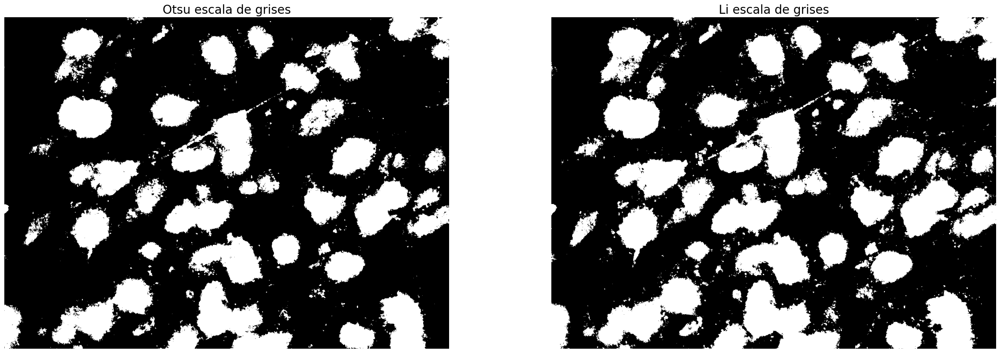

In [6]:
umbral_otsu2949 = filters.threshold_otsu(image2949_gris)
otsu2949 = image2949_gris > umbral_otsu2949

umbral_li2949 = filters.threshold_li(image2949_gris)
li2949 = image2949_gris > umbral_li2949

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(30, 10))
ax[0].imshow(otsu2949, cmap = "gray")
ax[0].set_title('Otsu escala de grises', fontsize=20)

ax[1].imshow(li2949, cmap = "gray")
ax[1].set_title('Li escala de grises', fontsize=20)

for a in ax:
    a.axis('off')

plt.show()

image2949_bin = np.zeros(li2949.shape)
for x in range(0, li2949.shape[0]):
  for y in range(0, li2949.shape[1]):
    if li2949[x][y] == True:
      image2949_bin[x][y] = 1

Como nos interessa un método lo más general posible, el método de umbralización Li es el más favorable ya que Otsu no ofrece resultados en una de las imágenes.

### Fuzzy-c-means

In [7]:
!pip install -U scikit-fuzzy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.0/994.0 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-py3-none-any.whl size=894078 sha256=a01baeb19fc9d19350fa911c96cd00eaf6d1735357205ffefd243c551255b787
  Stored in directory: /root/.cache/pip/wheels/4f/86/1b/dfd97134a2c8313e519bcebd95d3fedc7be7944db022094bc8
Successfully built scikit-fuzzy


In [8]:
import skfuzzy
from skfuzzy import membership as mf
from skfuzzy import image as img

def fuzzy_cmeans(img, n_grupos, n_iter):
    img_array = np.array(img)

    data = img_array.reshape((-1, 3))
    cntr, u, u0, d, jm, p, fpc = skfuzzy.cluster.cmeans(
        data.T, n_grupos, 4, error=0.005, maxiter=n_iter, init=None)


    return u

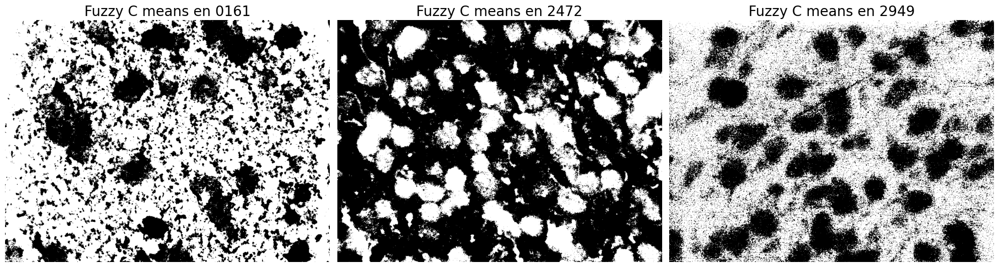

In [9]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 8))

cmeans0161 = fuzzy_cmeans(image0161, 2, 50)
ax[0].imshow(np.uint8(np.argmax(cmeans0161, axis=0).reshape(image0161_gris.shape[0], image0161_gris.shape[1])), cmap = "gray")
ax[0].set_title('Fuzzy C means en 0161', fontsize=20)

cmeans2472 = fuzzy_cmeans(image2472, 2, 50)
ax[1].imshow(np.uint8(np.argmax(cmeans2472, axis=0).reshape(image2472_gris.shape[0], image2472_gris.shape[1])), cmap = "gray")
ax[1].set_title('Fuzzy C means en 2472', fontsize=20)

cmeans2949 = fuzzy_cmeans(image2949, 2, 50)
ax[2].imshow(np.uint8(np.argmax(cmeans2949, axis=0).reshape(image2949_gris.shape[0], image2949_gris.shape[1])), cmap = "gray")
ax[2].set_title('Fuzzy C means en 2949', fontsize=20)

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

In [36]:
dic_colores = {
    1: [0, 153, 0],  # Verde
    2: [153, 0, 153],  # Morado
    3: [255, 255, 0],  # Amarillo
    4: [0, 255, 255],  # Cian
    5: [255, 102, 102],  # Rosa
    6: [0, 0, 255],  # Azul
    7: [255, 0, 255],  # Magenta
    8: [128, 128, 0],  # Oliva
    9: [0, 255, 0],  # Lima
    10: [75, 0, 130],  # Índigo
    11: [139, 69, 19],  # Siena
    12: [153, 0, 0],  # Marrón
    13: [0, 128, 128],  # Teal
    14: [130, 0, 75],  # Borgoña
    15: [153, 153, 0],  # Amarillo verdoso
    16: [128, 0, 128],  # Púrpura
    17: [255, 0, 0],  # Rojo (añadido para completar hasta la clave 21)
    18: [0, 255, 0],  # Verde lima (añadido para completar hasta la clave 21)
    19: [0, 0, 255],  # Azul (añadido para completar hasta la clave 21)
    20: [255, 255, 255],  # Blanco (añadido para completar hasta la clave 21)
    21: [102, 102, 255],
    22: [102, 255, 102],
    23: [0, 128, 0],
    24: [75, 130, 0],
    25: [130, 0, 75],
    26: [153, 75, 75]
}

In [34]:
print(dic_colores[2][1])

0


# IMAGEN 0161

Propiedades de las regiones:
Región 15: Área = 33755, BoundingBox = (0, 832, 219, 1134)


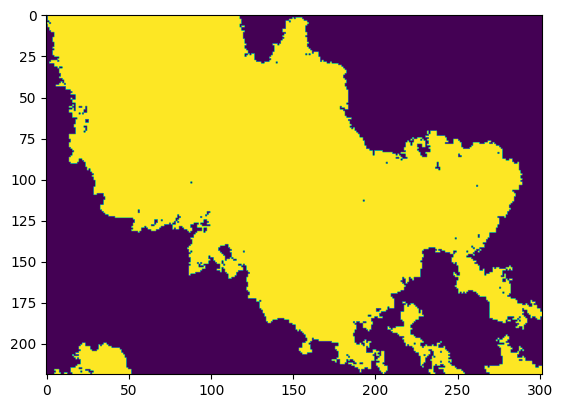

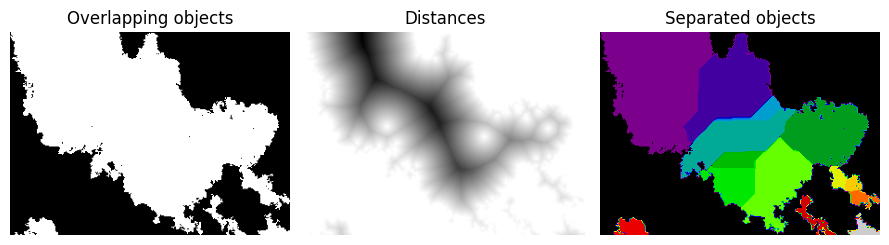

Región 25: Área = 10774, BoundingBox = (3, 331, 176, 484)


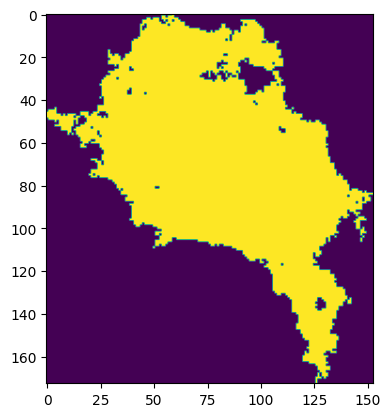

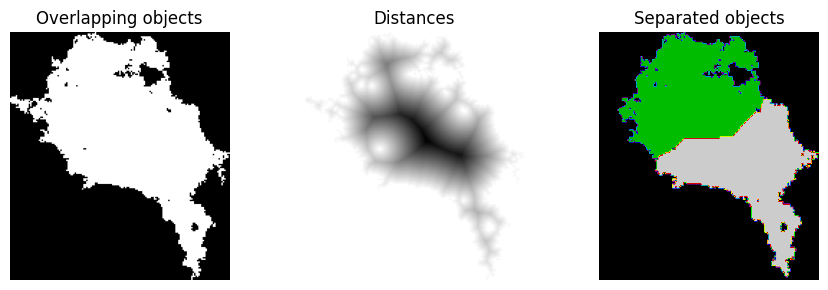

Región 62: Área = 10502, BoundingBox = (13, 1136, 160, 1275)


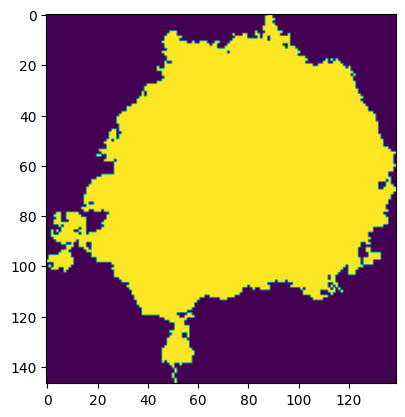

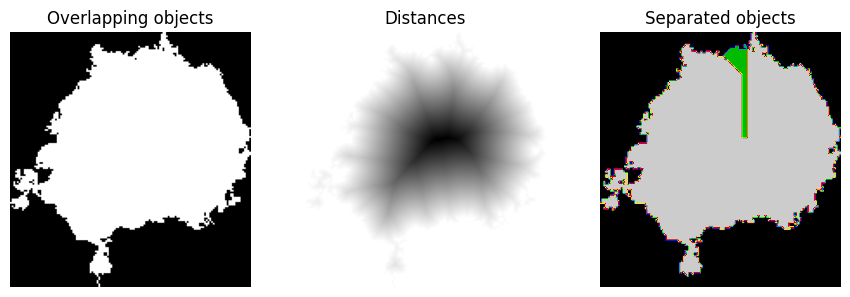

Región 76: Área = 18225, BoundingBox = (17, 574, 216, 792)


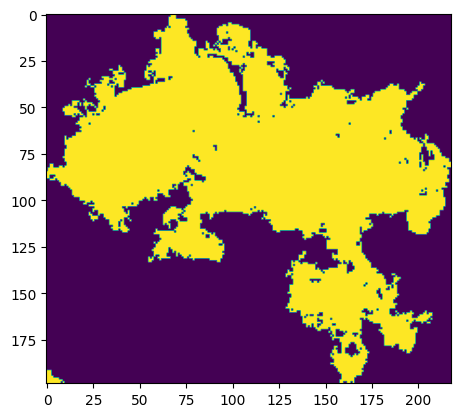

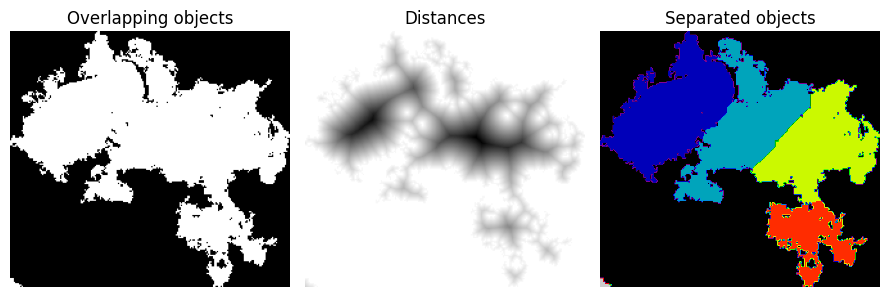

Región 243: Área = 3168, BoundingBox = (91, 98, 170, 179)


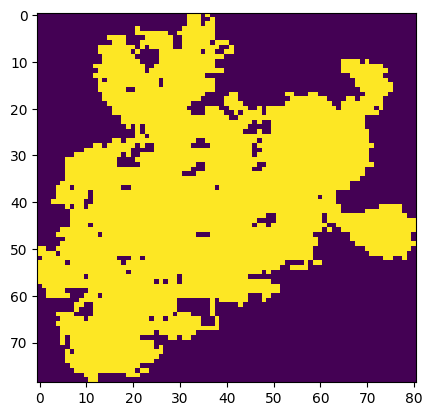

Región 515: Área = 6000, BoundingBox = (174, 245, 320, 382)


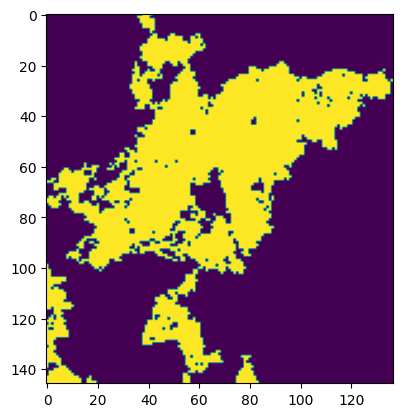

Región 528: Área = 6767, BoundingBox = (175, 1040, 311, 1170)


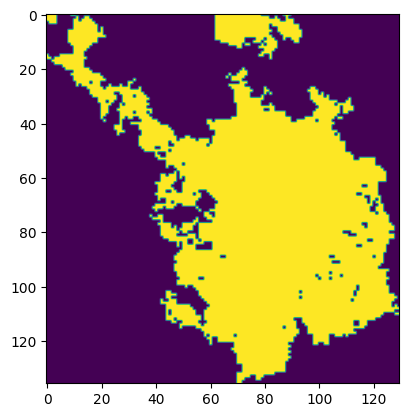

Región 648: Área = 14988, BoundingBox = (200, 783, 364, 932)


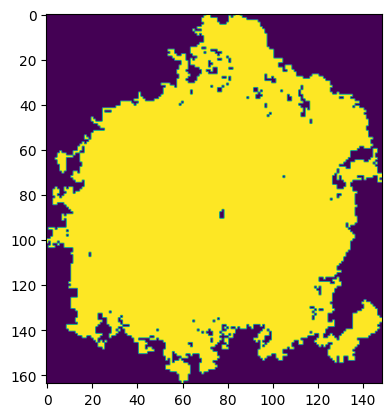

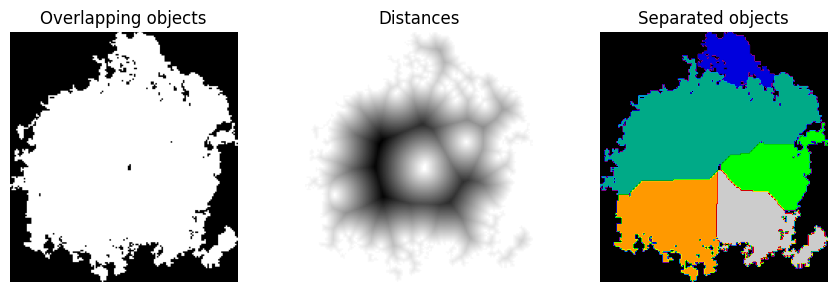

Región 660: Área = 17133, BoundingBox = (203, 447, 380, 636)


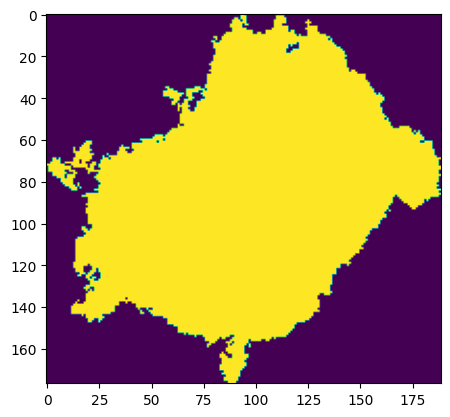

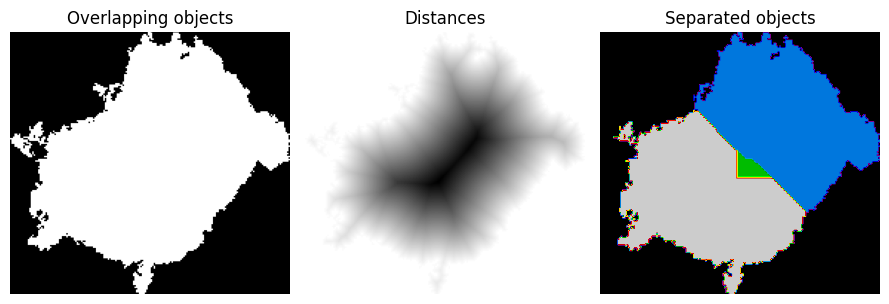

Región 852: Área = 52693, BoundingBox = (252, 130, 624, 456)


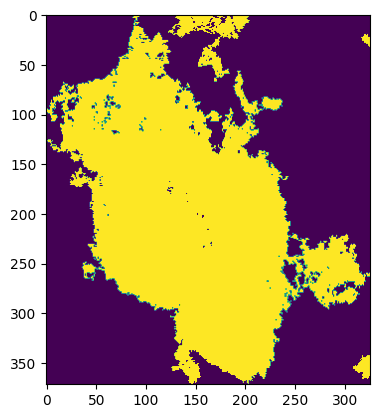

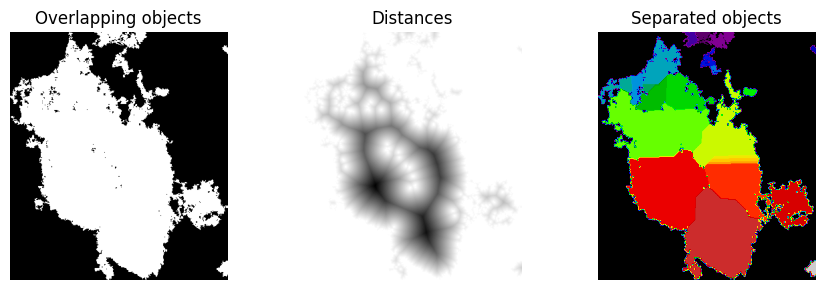

Región 868: Área = 5584, BoundingBox = (257, 641, 359, 743)


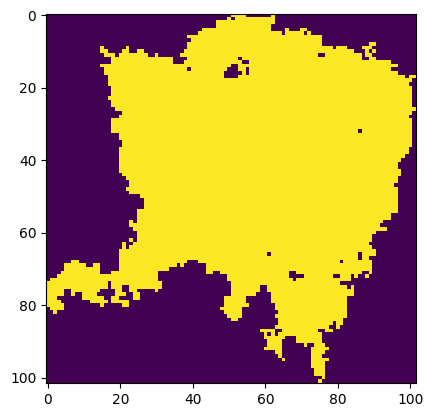

Región 893: Área = 8128, BoundingBox = (265, 1135, 437, 1281)


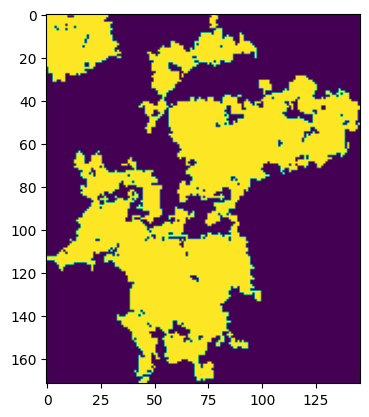

Región 1911: Área = 18987, BoundingBox = (545, 438, 718, 660)


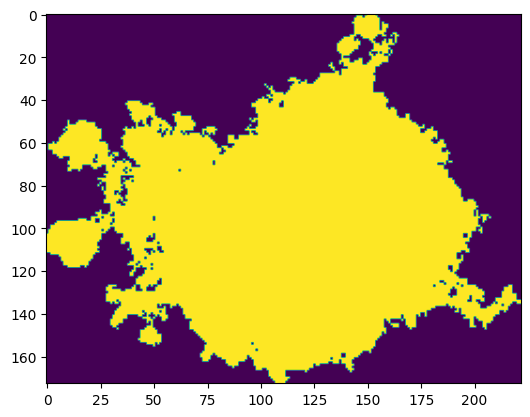

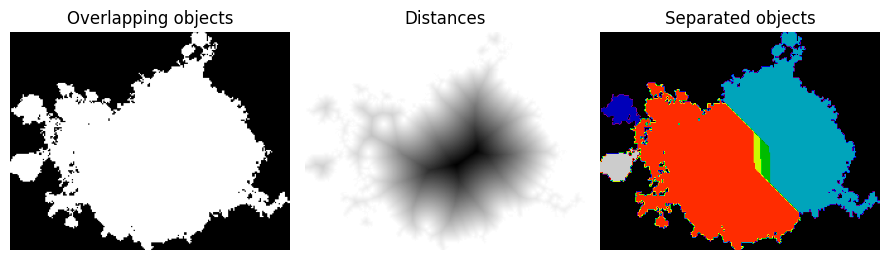

Región 2163: Área = 11224, BoundingBox = (617, 951, 775, 1098)


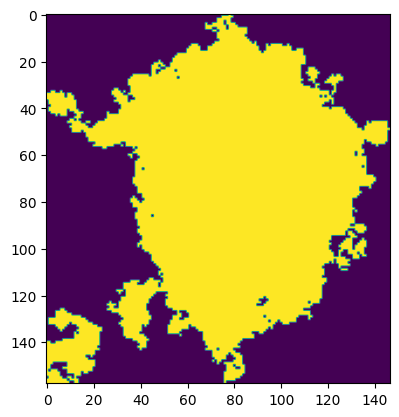

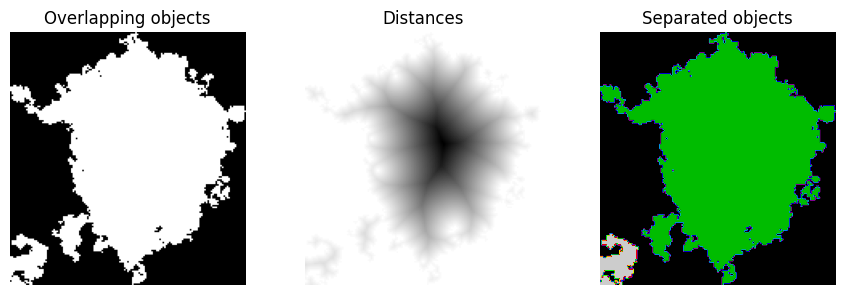

Región 2316: Área = 28366, BoundingBox = (661, 789, 979, 1036)


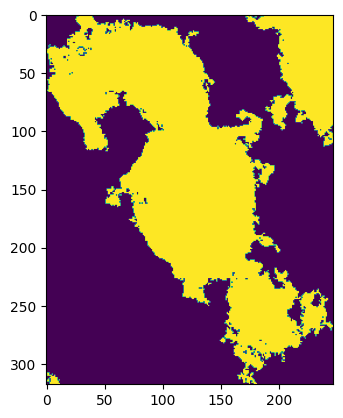

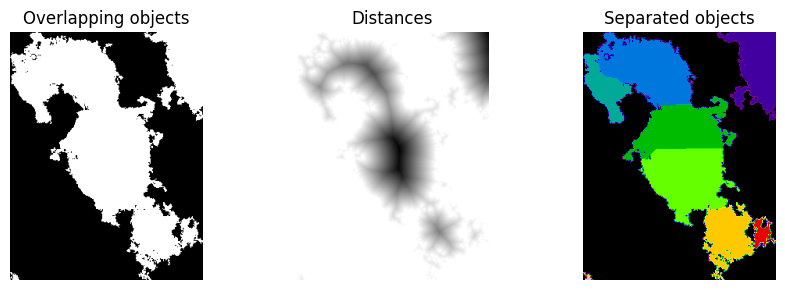

Región 2441: Área = 8509, BoundingBox = (698, 1182, 877, 1320)


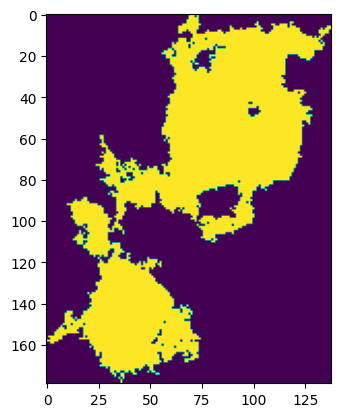

Región 2883: Área = 9889, BoundingBox = (838, 566, 956, 718)


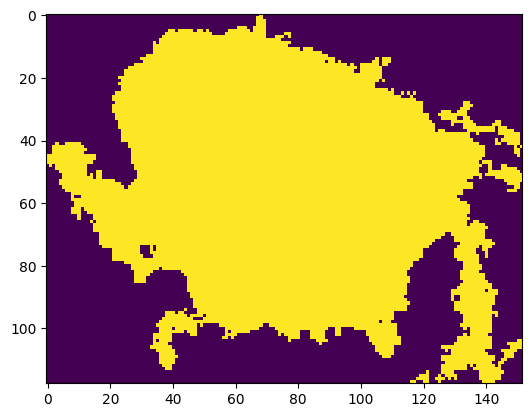

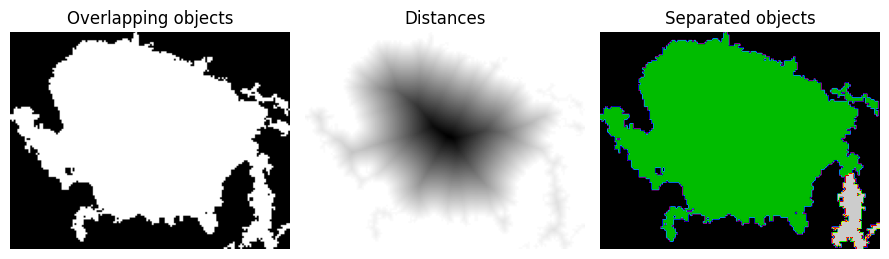

Región 3148: Área = 11043, BoundingBox = (912, 116, 1040, 290)


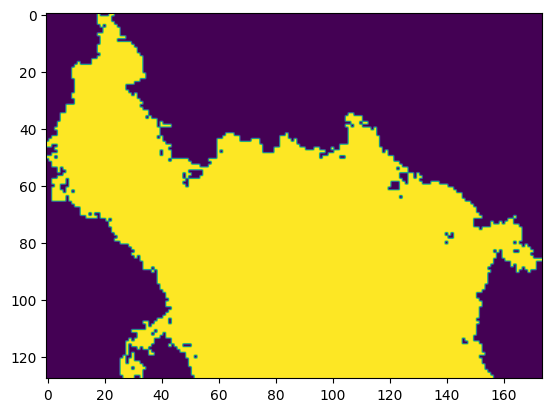

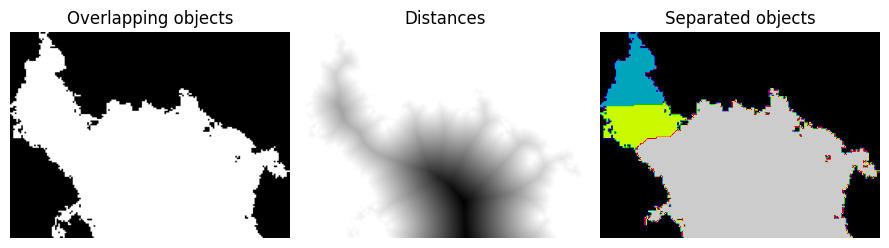

Región 3266: Área = 5683, BoundingBox = (944, 0, 1040, 77)


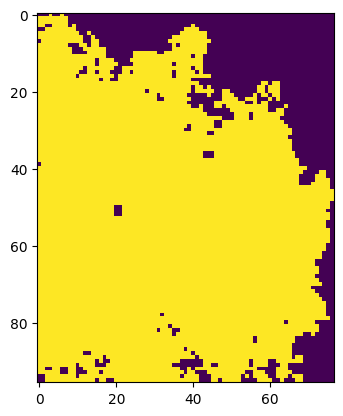

Región 3273: Área = 7557, BoundingBox = (944, 1189, 1040, 1316)


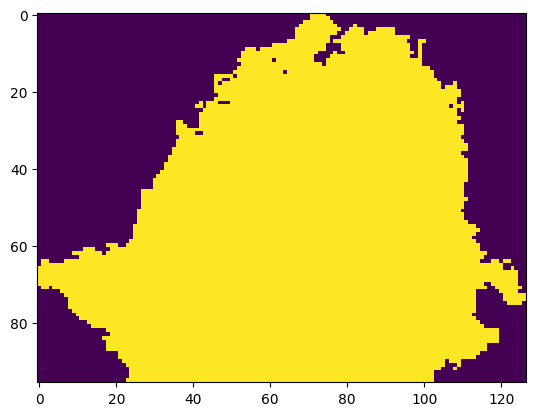

Región 3281: Área = 10717, BoundingBox = (946, 617, 1040, 813)


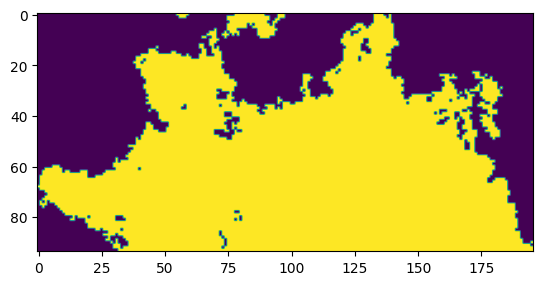

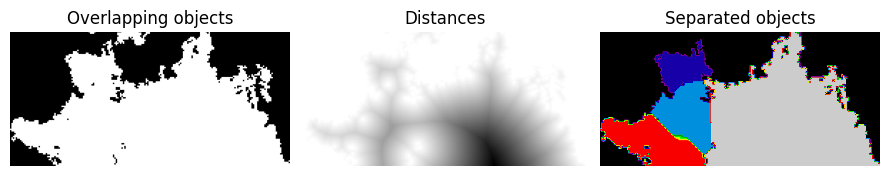

In [37]:
cel_sam = io.imread('cel_0161_bin.jpg')
min_area = 3000
masc_cels0161 = np.zeros(image0161.shape)
label_image0161 = label(image0161_bin)
regions0161 = regionprops(label_image0161)
bw_filtered0161 = np.zeros_like(image0161_bin)
for region in regions0161:
    if min_area <= region.area:
        bw_filtered0161[label_image0161 == region.label] = 1
plt.imshow(bw_filtered0161, cmap = 'gray')

props = regionprops(label_image0161)
print("Propiedades de las regiones:")
for i, prop in enumerate(props):
    if prop.area > 3000:
      print(f"Región {i + 1}: Área = {prop.area}, BoundingBox = {prop.bbox}")
      plt.imshow(bw_filtered0161[prop.bbox[0]:prop.bbox[2], prop.bbox[1]:prop.bbox[3]])
      plt.show()

      for x in range(prop.bbox[0], prop.bbox[2]):
        for y in range(prop.bbox[1],prop.bbox[3]):
          if bw_filtered0161[x][y] != 0:
            masc_cels0161[x][y][0] = dic_colores[bw_filtered0161[x][y]][0]
            masc_cels0161[x][y][1] = dic_colores[bw_filtered0161[x][y]][1]
            masc_cels0161[x][y][2] = dic_colores[bw_filtered0161[x][y]][2]

      if prop.area > 9000:

        reg = bw_filtered0161[prop.bbox[0]:prop.bbox[2], prop.bbox[1]:prop.bbox[3]]
        distance = ndi.distance_transform_edt(reg)
        coords = peak_local_max(distance.astype(int), footprint=np.ones((50, 50)), labels=reg.astype(int))
        mask = np.zeros(distance.shape, dtype=bool)
        mask[tuple(coords.T)] = True
        markers, _ = ndi.label(mask)
        labels = watershed(-distance, markers, mask=reg)

        for x in range(prop.bbox[0], prop.bbox[2]):
          for y in range(prop.bbox[1],prop.bbox[3]):
            if labels[x-prop.bbox[0]][y-prop.bbox[1]] != 0:
              masc_cels0161[x][y][0] = dic_colores[labels[x-prop.bbox[0]][y-prop.bbox[1]]][0]
              masc_cels0161[x][y][1] = dic_colores[labels[x-prop.bbox[0]][y-prop.bbox[1]]][1]
              masc_cels0161[x][y][2] = dic_colores[labels[x-prop.bbox[0]][y-prop.bbox[1]]][2]


        fig, axes = plt.subplots(ncols=3, figsize=(9, 3), sharex=True, sharey=True)
        ax = axes.ravel()



        ax[0].imshow(reg, cmap=plt.cm.gray)
        ax[0].set_title('Overlapping objects')
        ax[1].imshow(-distance, cmap=plt.cm.gray)
        ax[1].set_title('Distances')
        ax[2].imshow(labels, cmap=plt.cm.nipy_spectral)
        ax[2].set_title('Separated objects')

        for a in ax:
            a.set_axis_off()

        fig.tight_layout()
        plt.show()


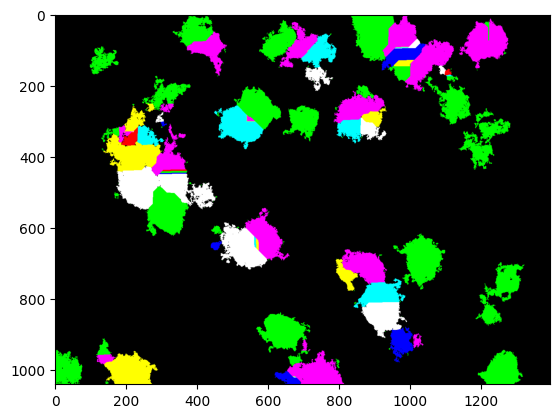

In [38]:
plt.imshow(masc_cels0161, cmap='nipy_spectral')

In [39]:
image = Image.fromarray(masc_cels0161.astype(np.uint8))
image.save('masc_cels0161.jpg')

In [ ]:

        for x in range(0, labels.shape[0]):
          for y in range(0, labels.shape[1]):
            if labels[x][y] == 1:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 153
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 0
            elif labels[x][y] == 2:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 153
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 153
            elif labels[x][y] == 3:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 255
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 255
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 0
            elif labels[x][y] == 4:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 255
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 255
            elif labels[x][y] == 5:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 255
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 102
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 102
            elif labels[x][y] == 6:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 255
            elif labels[x][y] == 7:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 255
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 255
            elif labels[x][y] == 8:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 128
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 128
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 0
            elif labels[x][y] == 9:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 255
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 0
            elif labels[x][y] == 10:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 75
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 130
            elif labels[x][y] == 11:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 139
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 69
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 19
            elif labels[x][y] == 12:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 153
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 0
            elif labels[x][y] == 13:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 128
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 128
            elif labels[x][y] == 14:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 130
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 75
            elif labels[x][y] == 15:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 153
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 153
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 0
            elif labels[x][y] == 16:
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][0] = 128
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][1] = 0
              masc_cels0161[x+prop.bbox[0]][y+prop.bbox[2]][2] = 128

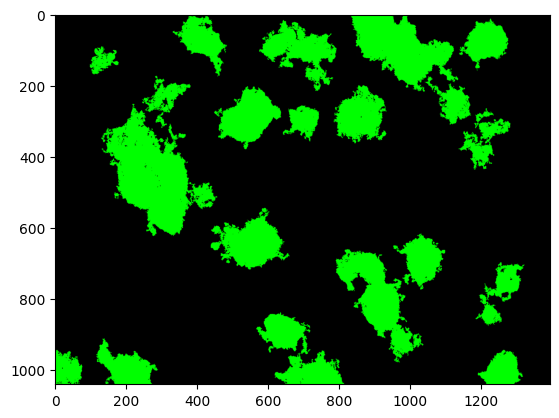

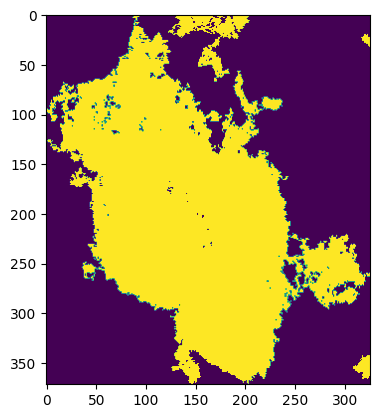

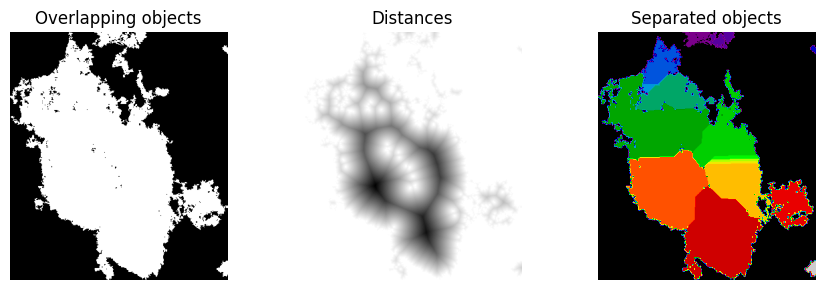

In [ ]:
reg = bw_filtered[252:624, 130:456]

plt.imshow(reg)

distance = ndi.distance_transform_edt(reg)
coords = peak_local_max(distance.astype(int), footprint=np.ones((100, 100)), labels=reg.astype(int))
mask = np.zeros(distance.shape, dtype=bool)
mask[tuple(coords.T)] = True
markers, _ = ndi.label(mask)
labels = watershed(-distance, markers, mask=reg)

fig, axes = plt.subplots(ncols=3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(reg, cmap=plt.cm.gray)
ax[0].set_title('Overlapping objects')
ax[1].imshow(-distance, cmap=plt.cm.gray)
ax[1].set_title('Distances')
ax[2].imshow(labels, cmap=plt.cm.nipy_spectral)
ax[2].set_title('Separated objects')

for a in ax:
  a.set_axis_off()

fig.tight_layout()
plt.show()

# IMAGEN 2472

Propiedades de las regiones:
Región 3: Área = 3865, BoundingBox = (0, 141, 53, 255)
Región 5: Área = 7376, BoundingBox = (0, 528, 104, 640)
Región 10: Área = 9402, BoundingBox = (0, 989, 124, 1150)


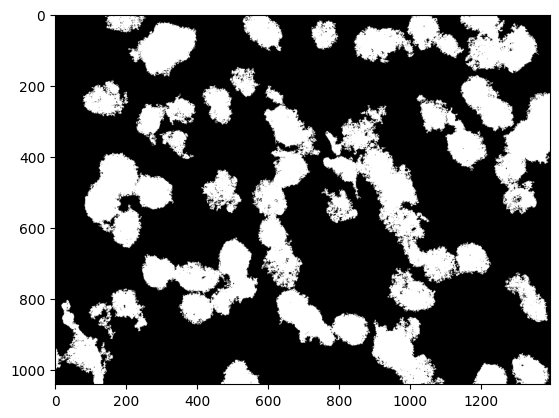

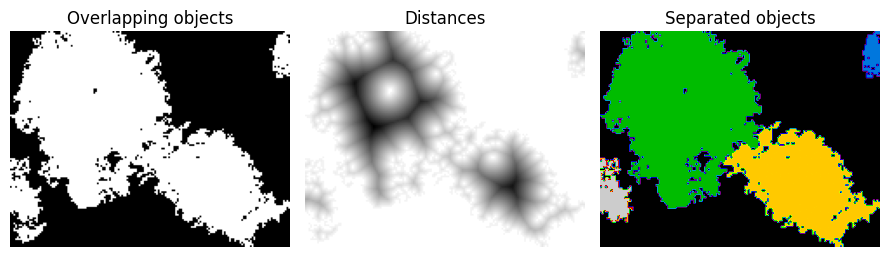

Región 11: Área = 22061, BoundingBox = (0, 1138, 166, 1361)


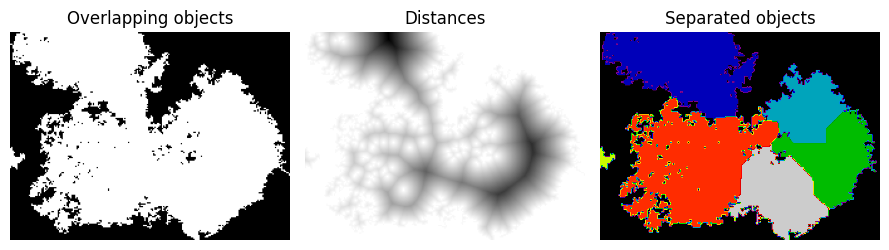

Región 51: Área = 3972, BoundingBox = (18, 720, 100, 797)
Región 60: Área = 17145, BoundingBox = (21, 206, 176, 399)


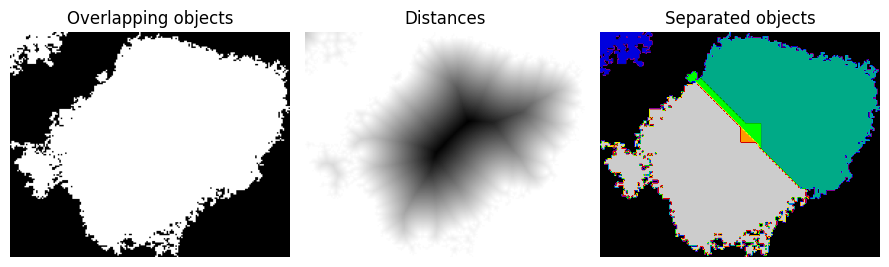

Región 101: Área = 10218, BoundingBox = (34, 840, 139, 1010)


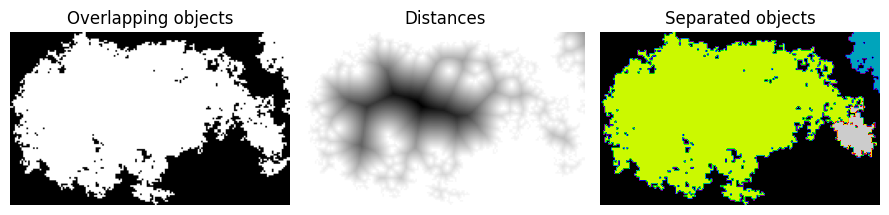

Región 427: Área = 3705, BoundingBox = (149, 492, 234, 577)
Región 512: Área = 12603, BoundingBox = (172, 1140, 331, 1291)


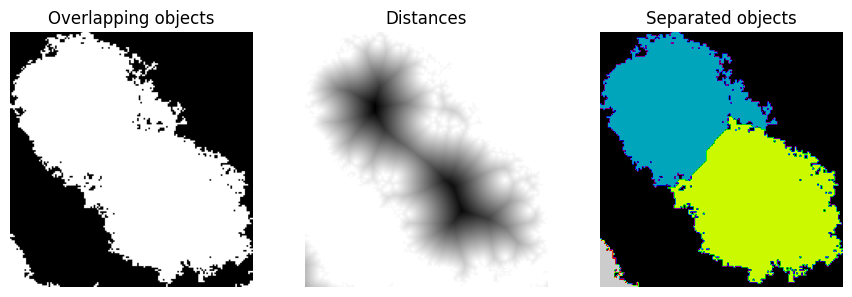

Región 577: Área = 7344, BoundingBox = (185, 77, 288, 207)
Región 623: Área = 5704, BoundingBox = (201, 413, 311, 499)
Región 624: Área = 40128, BoundingBox = (201, 553, 774, 746)


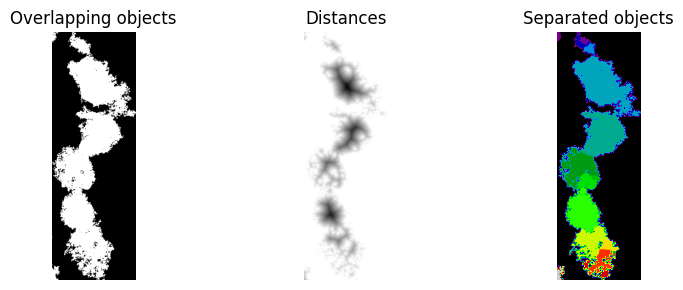

Región 692: Área = 27196, BoundingBox = (220, 1235, 564, 1392)


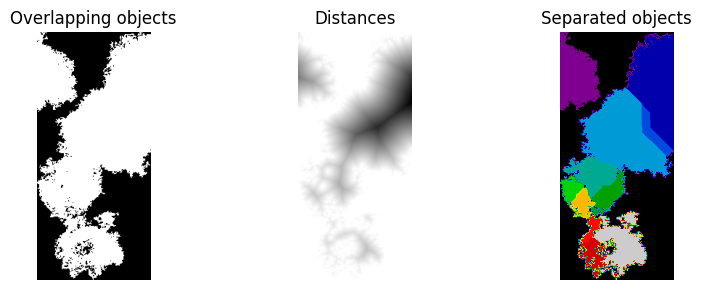

Región 699: Área = 9161, BoundingBox = (223, 228, 369, 396)


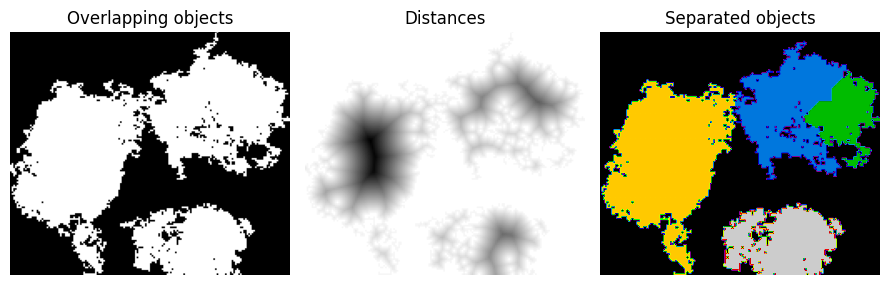

Región 717: Área = 15164, BoundingBox = (227, 1016, 440, 1218)


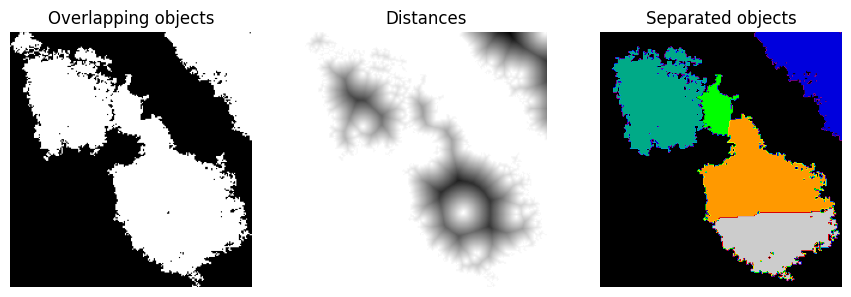

Región 815: Área = 53794, BoundingBox = (256, 754, 757, 1227)


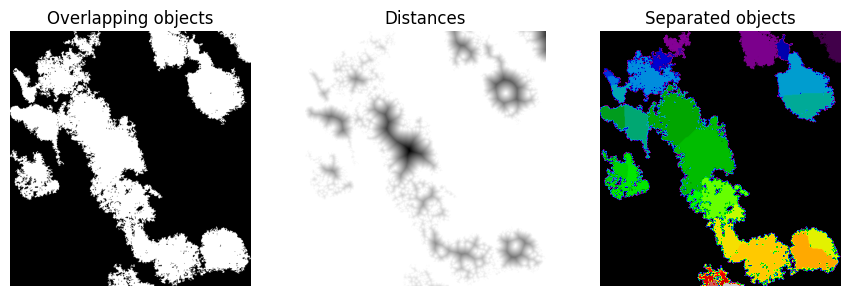

Región 1085: Área = 3189, BoundingBox = (326, 294, 408, 390)
Región 1418: Área = 33099, BoundingBox = (390, 83, 658, 334)


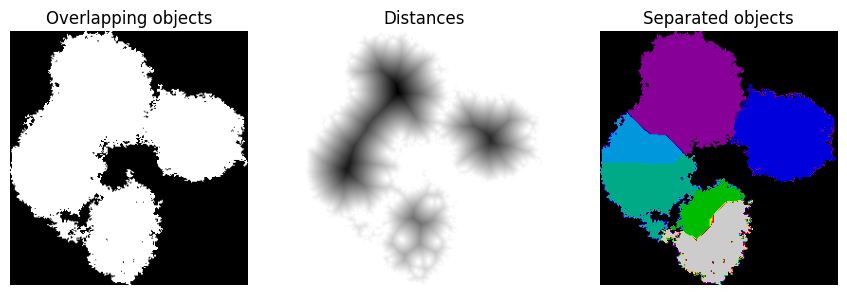

Región 1615: Área = 7045, BoundingBox = (436, 411, 560, 525)
Región 1816: Área = 4497, BoundingBox = (489, 749, 588, 851)
Región 2275: Área = 35440, BoundingBox = (628, 244, 873, 571)


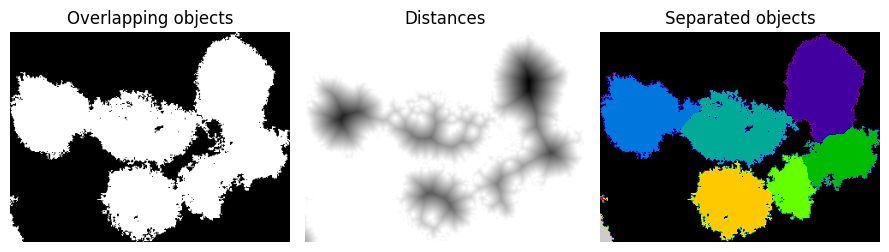

Región 2601: Área = 9148, BoundingBox = (713, 935, 839, 1070)


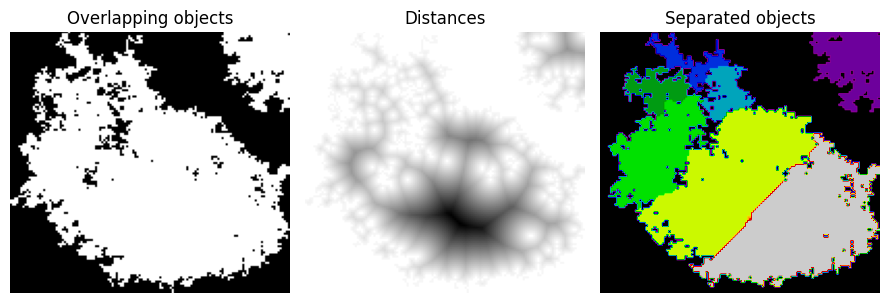

Región 2644: Área = 7199, BoundingBox = (726, 1264, 866, 1386)
Región 2833: Área = 20342, BoundingBox = (770, 622, 934, 886)


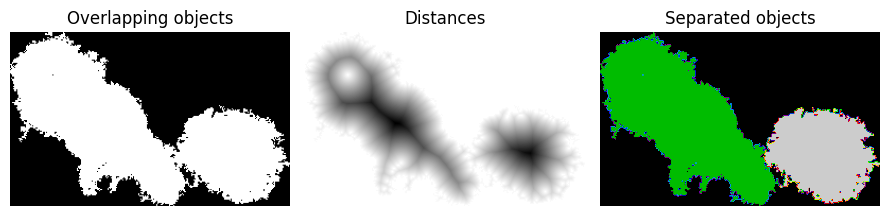

Región 2835: Área = 8051, BoundingBox = (771, 94, 913, 260)
Región 2938: Área = 11982, BoundingBox = (804, 0, 1040, 164)


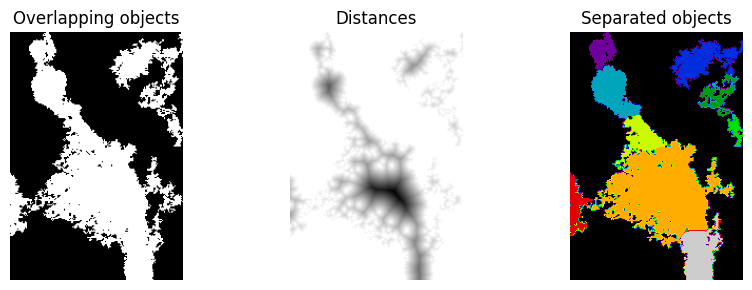

Región 3098: Área = 19363, BoundingBox = (852, 890, 1040, 1095)


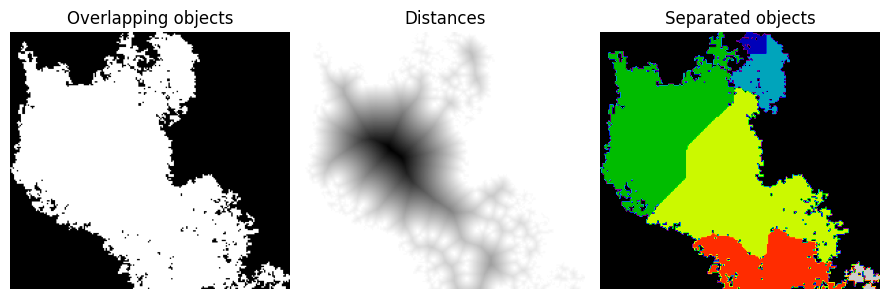

Región 3458: Área = 6349, BoundingBox = (953, 1283, 1040, 1392)
Región 3497: Área = 4643, BoundingBox = (971, 467, 1040, 576)
Región 3525: Área = 4137, BoundingBox = (980, 1175, 1040, 1274)


In [ ]:
boxes = []
boxes_big = []
labels_ar = []
min_area = 3000
label_image = label(image2472_bin)
regions = regionprops(label_image)
bw_filtered = np.zeros_like(image2472_bin)
for region in regions:
    if min_area <= region.area:
        bw_filtered[label_image == region.label] = 1
masc_cels2472 = np.zeros(image2472.shape)
plt.imshow(bw_filtered, cmap = 'gray')
props = regionprops(label_image)
print("Propiedades de las regiones:")
for i, prop in enumerate(props):
    if prop.area > 3000:
      print(f"Región {i + 1}: Área = {prop.area}, BoundingBox = {prop.bbox}")
      if prop.area > 9000:
        boxes_big.append(image2472_sondas[prop.bbox[0]:prop.bbox[2], prop.bbox[1]:prop.bbox[3]])
        reg = bw_filtered[prop.bbox[0]:prop.bbox[2], prop.bbox[1]:prop.bbox[3]]
        distance = ndi.distance_transform_edt(reg)
        coords = peak_local_max(distance.astype(int), footprint=np.ones((50, 50)), labels=reg.astype(int))
        mask = np.zeros(distance.shape, dtype=bool)
        mask[tuple(coords.T)] = True
        markers, _ = ndi.label(mask)
        labels = watershed(-distance, markers, mask=reg)

        fig, axes = plt.subplots(ncols=3, figsize=(9, 3), sharex=True, sharey=True)
        ax = axes.ravel()



        ax[0].imshow(reg, cmap=plt.cm.gray)
        ax[0].set_title('Overlapping objects')
        ax[1].imshow(-distance, cmap=plt.cm.gray)
        ax[1].set_title('Distances')
        ax[2].imshow(labels, cmap=plt.cm.nipy_spectral)
        ax[2].set_title('Separated objects')

        for a in ax:
            a.set_axis_off()

        fig.tight_layout()
        plt.show()
        labels_ar.append(labels)

        for x in range(prop.bbox[0], prop.bbox[2]):
          for y in range(prop.bbox[1], prop.bbox[3]):
            if labels[x-prop.bbox[0]][y-prop.bbox[1]] == 1:
              masc_cels2472[x][y][0] = 0
              masc_cels2472[x][y][1] = 153
              masc_cels2472[x][y][2] = 0
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 2:
              masc_cels2472[x][y][0] = 153
              masc_cels2472[x][y][1] = 0
              masc_cels2472[x][y][2] = 153
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 3:
              masc_cels2472[x][y][0] = 255
              masc_cels2472[x][y][1] = 255
              masc_cels2472[x][y][2] = 0
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 4:
              masc_cels2472[x][y][0] = 0
              masc_cels2472[x][y][1] = 255
              masc_cels2472[x][y][2] = 255
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 5:
              masc_cels2472[x][y][0] = 255
              masc_cels2472[x][y][1] = 102
              masc_cels2472[x][y][2] = 102
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 6:
              masc_cels2472[x][y][0] = 0
              masc_cels2472[x][y][1] = 0
              masc_cels2472[x][y][2] = 255
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 7:
              masc_cels2472[x][y][0] = 255
              masc_cels2472[x][y][1] = 0
              masc_cels2472[x][y][2] = 255
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 8:
              masc_cels2472[x][y][0] = 128
              masc_cels2472[x][y][1] = 128
              masc_cels2472[x][y][2] = 0
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 9:
              masc_cels2472[x][y][0] = 0
              masc_cels2472[x][y][1] = 255
              masc_cels2472[x][y][2] = 0
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 10:
              masc_cels2472[x][y][0] = 75
              masc_cels2472[x][y][1] = 0
              masc_cels2472[x][y][2] = 130
            elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 11:
              masc_cels2472[x][y][0] = 139
              masc_cels2472[x][y][1] = 69
              masc_cels2472[x][y][2] = 19
      else:
        boxes.append([prop.bbox[0], prop.bbox[2], prop.bbox[1], prop.bbox[3]])
# La célula mayor de 10000 creo que es un error causado por un artefacto

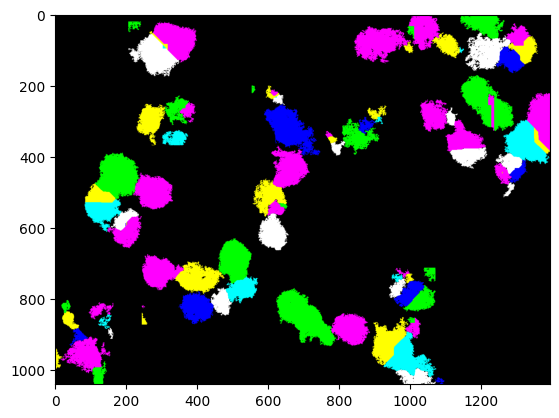

In [ ]:
plt.imshow(masc_cels2472)

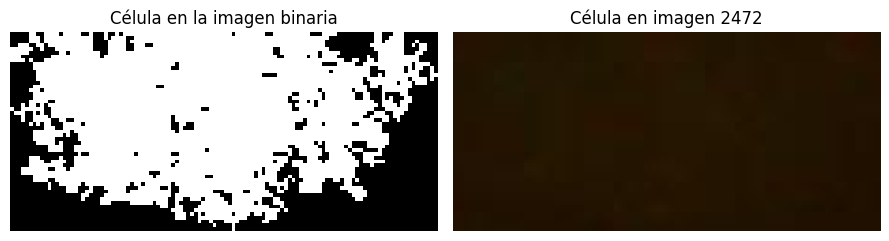

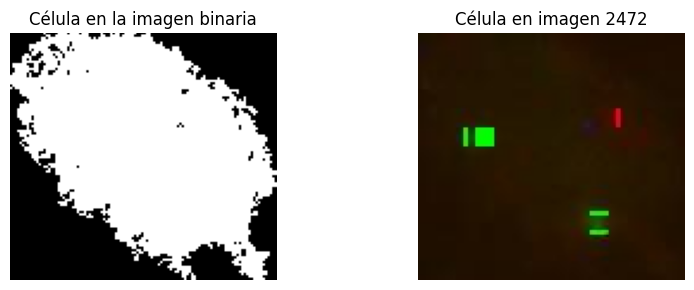

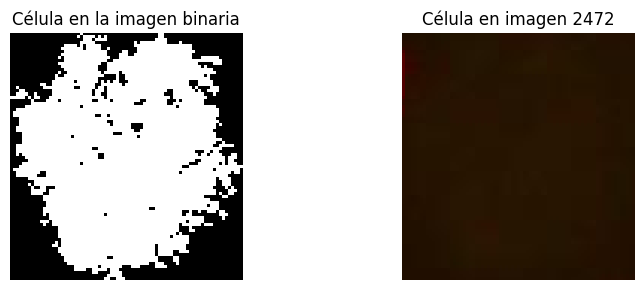

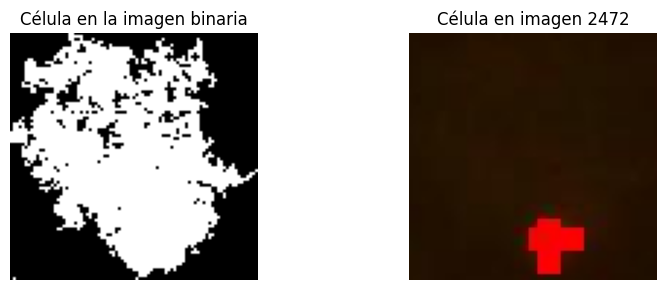

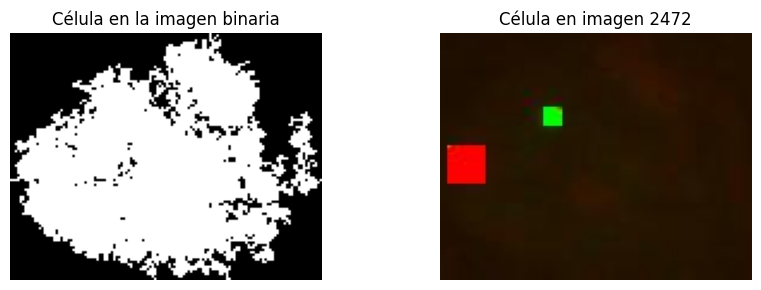

...

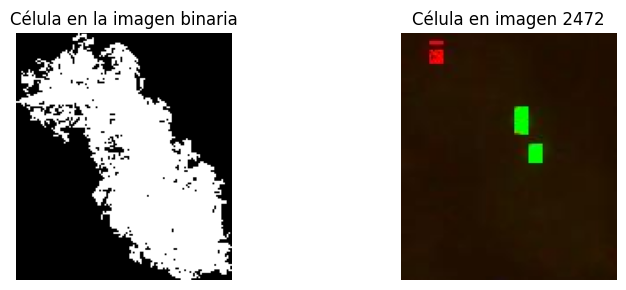

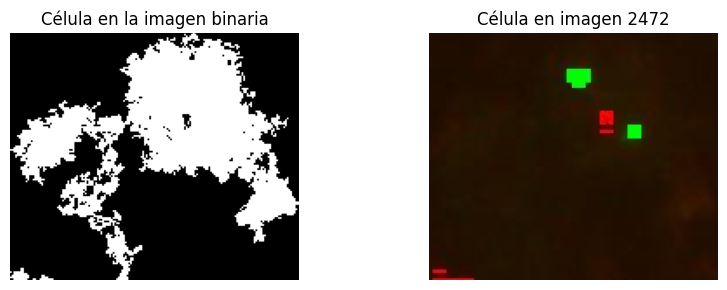

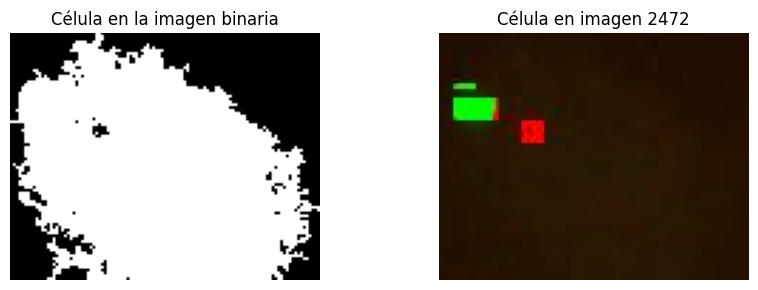

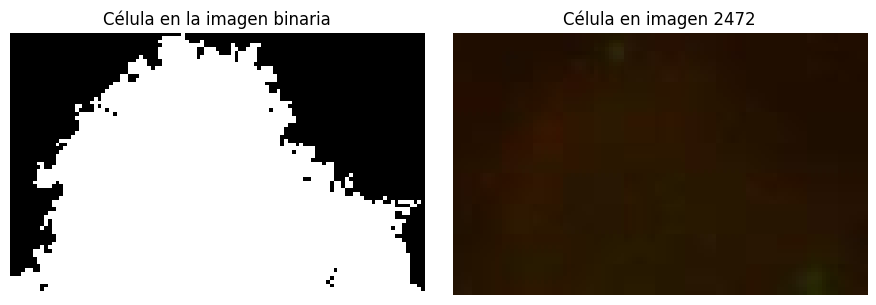

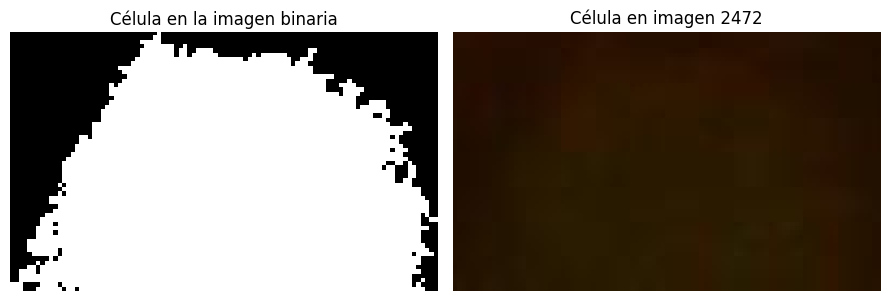

In [ ]:
for box in boxes:
  fig, axes = plt.subplots(ncols=2, figsize=(9, 3), sharex=True, sharey=True)
  ax = axes.ravel()
  for x in range(box[0], box[1]):
    for y in range(box[2], box[3]):
      if bw_filtered[x-prop.bbox[0]][y-prop.bbox[1]] == 1:
        masc_cels2472[x][y][0] = 255
        masc_cels2472[x][y][1] = 0
        masc_cels2472[x][y][2] = 255


  ax[0].imshow(bw_filtered[box[0]:box[1], box[2]:box[3]], cmap=plt.cm.gray)
  ax[0].set_title('Célula en la imagen binaria')
  ax[1].imshow(image2472_sondas[box[0]:box[1], box[2]:box[3]])
  ax[1].set_title('Célula en imagen 2472')

  for a in ax:
    a.set_axis_off()

  fig.tight_layout()
  plt.show()

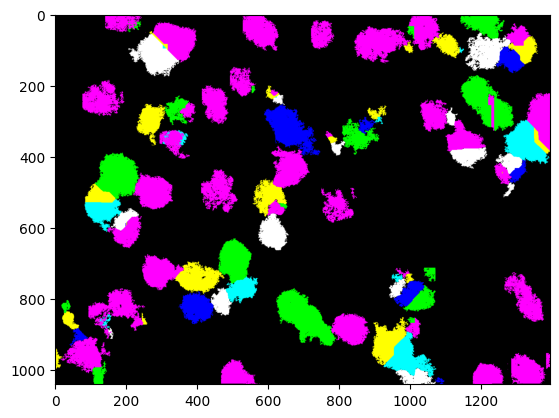

In [ ]:
plt.imshow(masc_cels2472)

In [ ]:
image = Image.fromarray(masc_cels2472.astype(np.uint8))
image.save('masc_cels2472.jpg')

Propiedades de las regiones:
Región 1: Área = 11408, BoundingBox = (0, 0, 133, 123), Centroid = (55.419004207573636, 61.0163920056101)


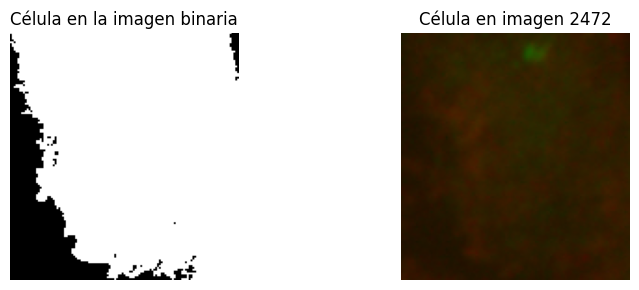

Región 2: Área = 5711, BoundingBox = (2, 89, 120, 186), Centroid = (60.33636841183681, 139.6179303099282)


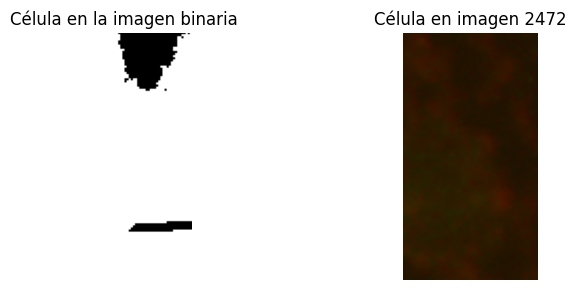

Región 6: Área = 3797, BoundingBox = (82, 86, 159, 210), Centroid = (116.28285488543587, 143.98288122201737)


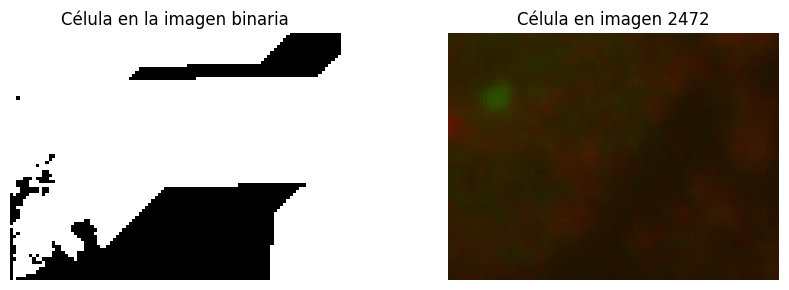

Región 7: Área = 4712, BoundingBox = (71, 194, 146, 290), Centroid = (108.44439728353142, 243.19694397283533)


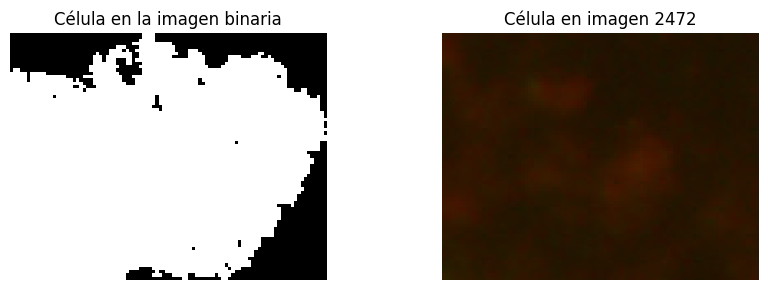

Región 10: Área = 4018, BoundingBox = (114, 152, 218, 230), Centroid = (162.32503733200596, 190.2177700348432)


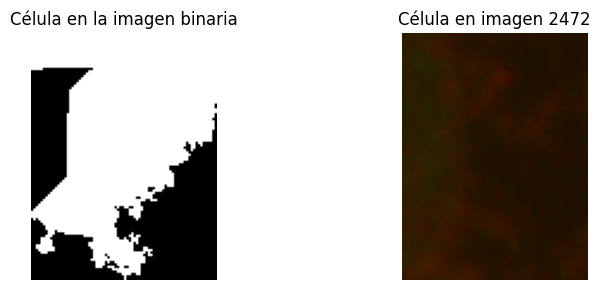

{11408: (55.419004207573636, 61.0163920056101), 5711: (60.33636841183681, 139.6179303099282), 3797: (116.28285488543587, 143.98288122201737), 4712: (108.44439728353142, 243.19694397283533), 4018: (162.32503733200596, 190.2177700348432)}


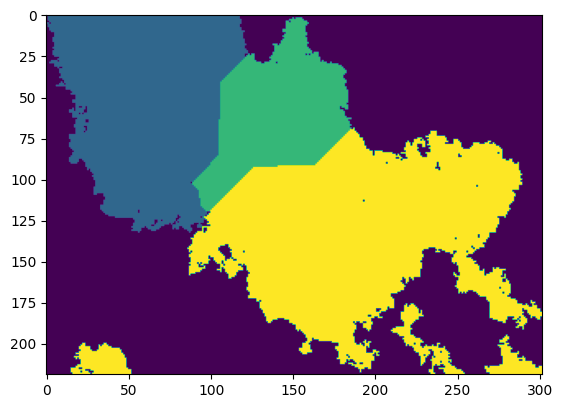

Propiedades de las regiones:
Región 1: Área = 5472, BoundingBox = (0, 13, 88, 115), Centroid = (42.6937134502924, 63.94188596491228)


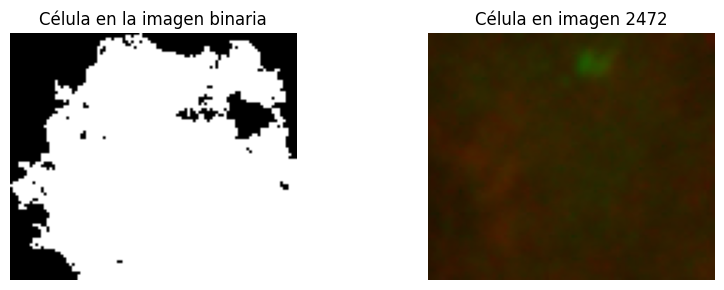

Región 2: Área = 5165, BoundingBox = (46, 39, 171, 153), Centroid = (96.53378509196514, 103.70125847047434)


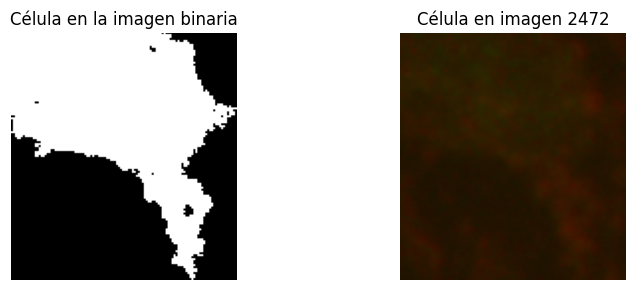

{5472: (42.6937134502924, 63.94188596491228), 5165: (96.53378509196514, 103.70125847047434)}


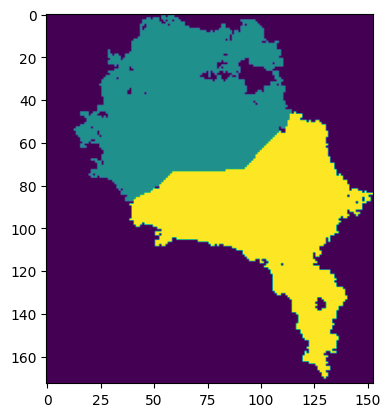

Propiedades de las regiones:
Región 2: Área = 10200, BoundingBox = (0, 0, 141, 139), Centroid = (66.6493137254902, 74.57607843137255)


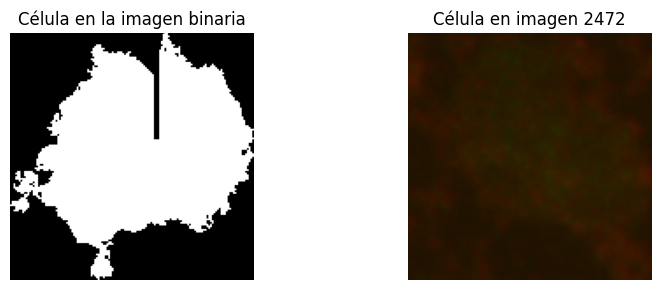

{10200: (66.6493137254902, 74.57607843137255)}


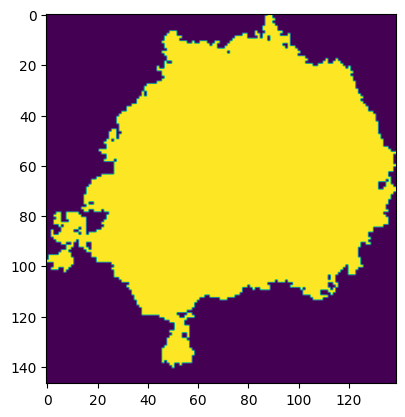

Propiedades de las regiones:
Región 1: Área = 5858, BoundingBox = (0, 0, 118, 105), Centroid = (61.329293274155, 55.714066234209625)


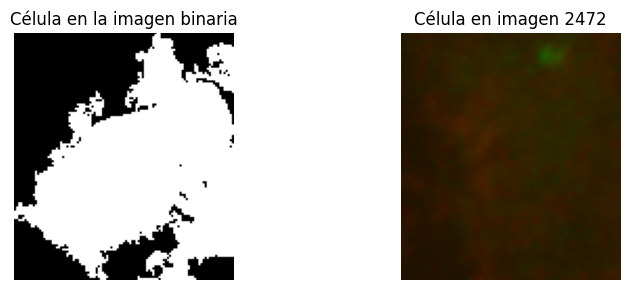

Región 2: Área = 5096, BoundingBox = (5, 57, 134, 166), Centroid = (72.53512558869701, 111.77197802197803)


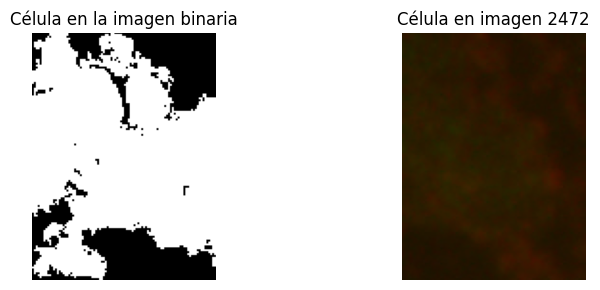

Región 4: Área = 4755, BoundingBox = (38, 117, 135, 218), Centroid = (88.67928496319664, 171.5669821240799)


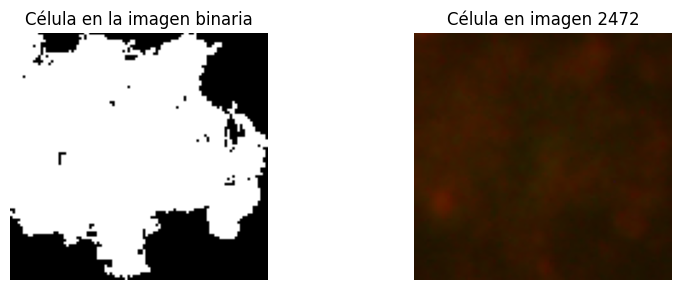

{5858: (61.329293274155, 55.714066234209625), 5096: (72.53512558869701, 111.77197802197803), 4755: (88.67928496319664, 171.5669821240799)}


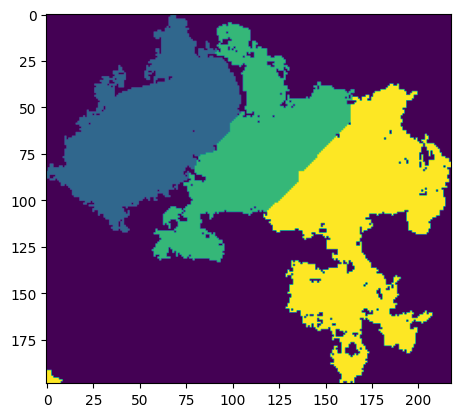

Propiedades de las regiones:
Región 2: Área = 6703, BoundingBox = (16, 0, 107, 145), Centroid = (62.5973444726242, 68.74116067432493)


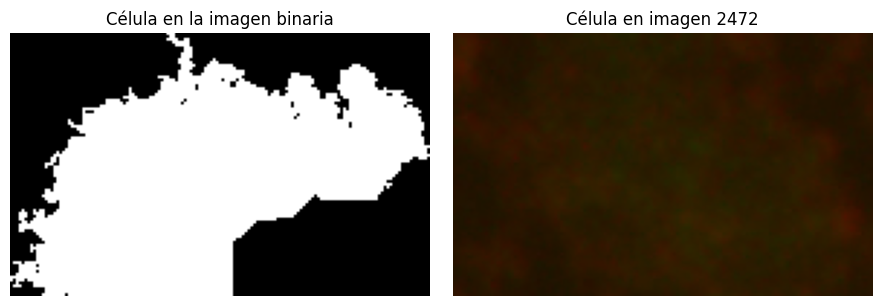

Región 4: Área = 3153, BoundingBox = (92, 9, 164, 78), Centroid = (123.29178560101491, 47.0802410402791)


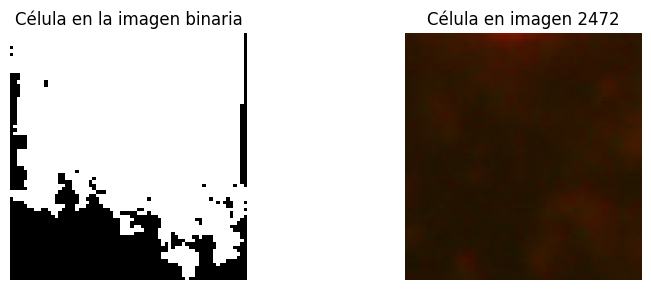

{6703: (62.5973444726242, 68.74116067432493), 3153: (123.29178560101491, 47.0802410402791)}


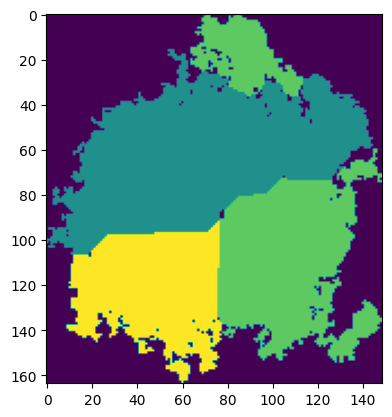

Propiedades de las regiones:
Región 1: Área = 8189, BoundingBox = (0, 63, 122, 189), Centroid = (58.043350836487974, 125.23275125167908)


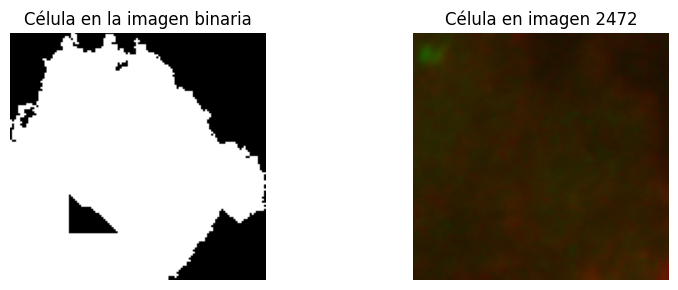

Región 4: Área = 8523, BoundingBox = (53, 9, 177, 139), Centroid = (112.32512026281826, 69.8149712542532)


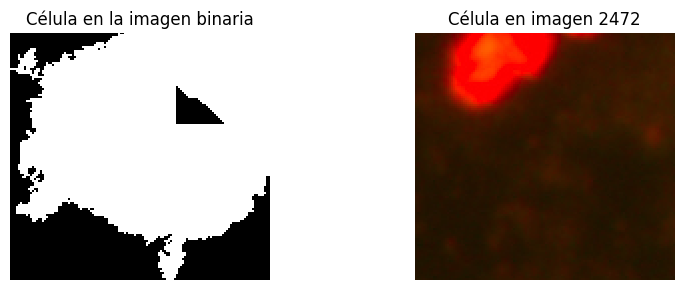

{8189: (58.043350836487974, 125.23275125167908), 8523: (112.32512026281826, 69.8149712542532)}


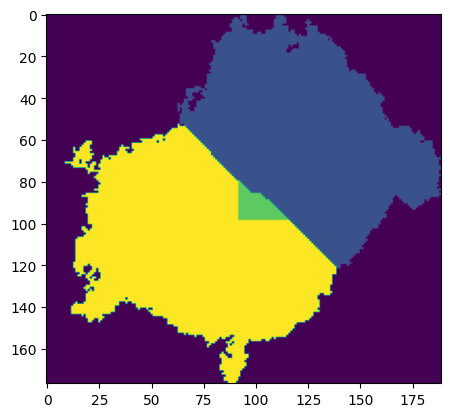

Propiedades de las regiones:
Región 15: Área = 9685, BoundingBox = (84, 6, 191, 171), Centroid = (143.61414558595766, 86.90655653071761)


IndexError: list index out of range

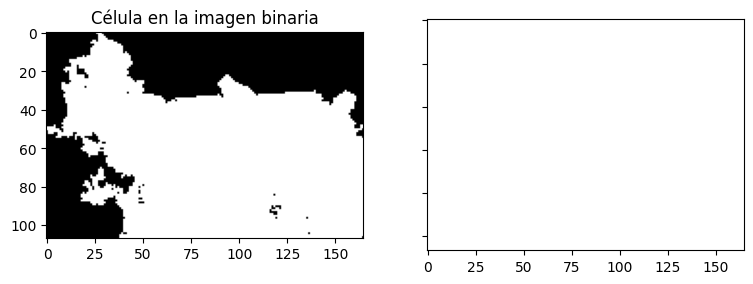

In [ ]:
for i, label in enumerate(labels_ar):
  dic = dict()
  centroids = []
  min_area = 3000
  regions = regionprops(label)
  bw_filtered = np.zeros_like(label)
  for region in regions:
    if min_area <= region.area:
      bw_filtered[label == region.label] = 1

  props = regionprops(label)
  print("Propiedades de las regiones:")
  for i, prop in enumerate(props):
    if prop.area > 3000:
      print(f"Región {i + 1}: Área = {prop.area}, BoundingBox = {prop.bbox}, Centroid = {prop.centroid}")
      dic[prop.area] = prop.centroid
      fig, axes = plt.subplots(ncols=2, figsize=(9, 3), sharex=True, sharey=True)
      ax = axes.ravel()

      ax[0].imshow(bw_filtered[prop.bbox[0]:prop.bbox[2], prop.bbox[1]:prop.bbox[3]], cmap=plt.cm.gray)
      ax[0].set_title('Célula en la imagen binaria')
      ax[1].imshow(boxes_big[i][prop.bbox[0]:prop.bbox[2], prop.bbox[1]:prop.bbox[3]])
      ax[1].set_title('Célula en imagen 2472')

      for a in ax:
        a.set_axis_off()

      fig.tight_layout()
      plt.show()
  print(dic)
  areas_max = sorted(dic.keys(), reverse = True)
  if len(areas_max) < 2:
    for x in range(0, label.shape[0]):
      for y in range(0, label.shape[1]):
        if label[x][y] != 0:
          label[x][y] = 1

    plt.imshow(label)
    plt.show()
  else:
    centroids = [dic[areas_max[0]], dic[areas_max[1]]]
    for x in range(0, label.shape[0]):
      for y in range(0, label.shape[1]):
        if label[x][y] != label[int(centroids[0][0])][int(centroids[0][1])] and label[x][y] != label[int(centroids[1][0])][int(centroids[1][1])] and label[x][y] != 0:
          label[x][y] = 3

    plt.imshow(label)
    plt.show()

In [ ]:
for i, prop in enumerate(props):
  print(props[i].area)

240
1214
6846
7754
2913
241


In [ ]:
for box in boxes_big:
  cel = bw_filtered[box[0]:box[1], box[2]:box[3]]
  plt.imshow(cel)
  fig.tight_layout()
  plt.show()

  reg = bw_filtered[box[0]:box[1], box[2]:box[3]]
  distance = ndi.distance_transform_edt(reg)
  coords = peak_local_max(distance.astype(int), footprint=np.ones((50, 50)), labels=reg.astype(int))
  mask = np.zeros(distance.shape, dtype=bool)
  mask[tuple(coords.T)] = True
  markers, _ = ndi.label(mask)
  labels = watershed(-distance, markers, mask=reg)
  fig, axes = plt.subplots(ncols=3, figsize=(9, 3), sharex=True, sharey=True)
  ax = axes.ravel()

  ax[0].imshow(reg, cmap=plt.cm.gray)
  ax[0].set_title('Overlapping objects')
  ax[1].imshow(-distance, cmap=plt.cm.gray)
  ax[1].set_title('Distances')
  ax[2].imshow(labels, cmap=plt.cm.nipy_spectral)
  ax[2].set_title('Separated objects')

  for a in ax:
    a.set_axis_off()

  fig.tight_layout()
  plt.show()


  min_area = 3000
  label_image = label(labels)
  regions = regionprops(label_image)
  bw_filtered = np.zeros_like(labels)
  for region in regions:
    if min_area <= region.area:
        bw_filtered[label_image == region.label] = 1

  props = regionprops(label_image)
  print("Propiedades de las regiones:")
  for i, prop in enumerate(props):
    if prop.area > 3000:
      print(f"Región {i + 1}: Área = {prop.area}, BoundingBox = {prop.bbox}, Centroid = {prop.centroid}")
  for x in range(0, label_image.shape[0]):
    for y in range(0, label_image.shape[1]):
      if label_image[x][y] != label_image[27][66] and label_image[x][y] != label_image[105][72] and label_image[x][y] != 0:
        label_image[x][y] = 4

  plt.imshow(image2472_sondas[prop.bbox[0]:prop.bbox[2], prop.bbox[1]:prop.bbox[3]])
  fig.tight_layout()
  plt.show()


TypeError: only integer scalar arrays can be converted to a scalar index

Propiedades de las regiones:
Región 3: Área = 3865, BoundingBox = (0, 141, 53, 255)
Región 5: Área = 7376, BoundingBox = (0, 528, 104, 640)
Región 10: Área = 9402, BoundingBox = (0, 989, 124, 1150)
Región 11: Área = 22061, BoundingBox = (0, 1138, 166, 1361)
Región 51: Área = 3972, BoundingBox = (18, 720, 100, 797)
Región 60: Área = 17145, BoundingBox = (21, 206, 176, 399)
Región 101: Área = 10218, BoundingBox = (34, 840, 139, 1010)
Región 427: Área = 3705, BoundingBox = (149, 492, 234, 577)
Región 512: Área = 12603, BoundingBox = (172, 1140, 331, 1291)
Región 577: Área = 7344, BoundingBox = (185, 77, 288, 207)
Región 623: Área = 5704, BoundingBox = (201, 413, 311, 499)
Región 624: Área = 40128, BoundingBox = (201, 553, 774, 746)
Región 692: Área = 27196, BoundingBox = (220, 1235, 564, 1392)
Región 699: Área = 9161, BoundingBox = (223, 228, 369, 396)
Región 717: Área = 15164, BoundingBox = (227, 1016, 440, 1218)
Región 815: Área = 53794, BoundingBox = (256, 754, 757, 1227)
Región 1085: 

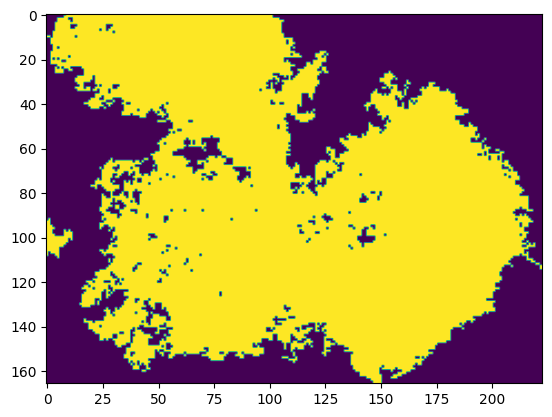

In [ ]:
min_area = 3000
label_image = label(image2472_bin)
regions = regionprops(label_image)
bw_filtered = np.zeros_like(image2472_bin)
for region in regions:
    if min_area <= region.area:
        bw_filtered[label_image == region.label] = 1

plt.imshow(bw_filtered, cmap = 'gray')
props = regionprops(label_image)
print("Propiedades de las regiones:")
for i, prop in enumerate(props):
    if prop.area > 3000:
      print(f"Región {i + 1}: Área = {prop.area}, BoundingBox = {prop.bbox}")

reg = bw_filtered[0:166, 1138:1361]
plt.imshow(reg)

In [ ]:
el_estructurante = disk(2)
y_seed = opening(el_estructurante, reg)


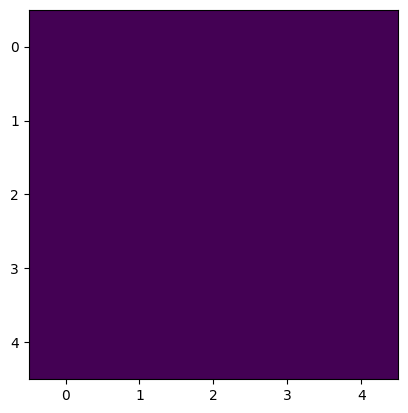

In [ ]:
plt.imshow(y_seed)

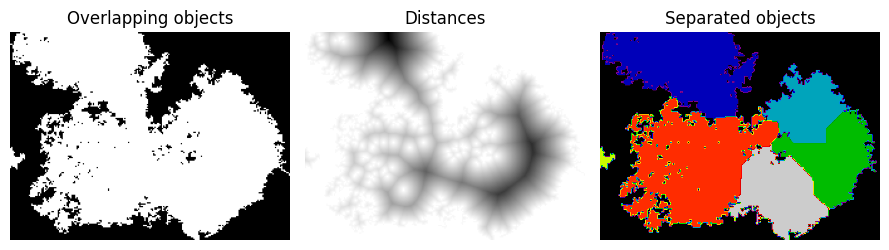

In [ ]:
distance = ndi.distance_transform_edt(reg)
coords = peak_local_max(distance.astype(int), footprint=np.ones((50, 50)), labels=reg.astype(int))
mask = np.zeros(distance.shape, dtype=bool)
mask[tuple(coords.T)] = True
markers, _ = ndi.label(mask)
labels = watershed(-distance, markers, mask=reg)

fig, axes = plt.subplots(ncols=3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(reg, cmap=plt.cm.gray)
ax[0].set_title('Overlapping objects')
ax[1].imshow(-distance, cmap=plt.cm.gray)
ax[1].set_title('Distances')
ax[2].imshow(labels, cmap=plt.cm.nipy_spectral)
ax[2].set_title('Separated objects')

for a in ax:
    a.set_axis_off()

fig.tight_layout()
plt.show()

Propiedades de las regiones:
Región 1: Área = 5500, BoundingBox = (0, 2, 71, 126), Centroid = (27.293454545454544, 66.344)
Región 3: Área = 7576, BoundingBox = (52, 15, 160, 143), Centroid = (105.9425818373812, 72.9977560718057)
Región 4: Área = 3129, BoundingBox = (62, 137, 141, 220), Centroid = (100.2106104186641, 185.24704378395654)
Región 5: Área = 3356, BoundingBox = (90, 102, 166, 183), Centroid = (128.87902264600714, 142.08998808104886)


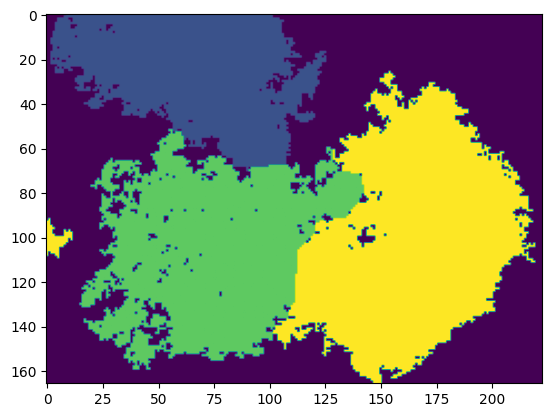

In [ ]:
min_area = 3000
label_image = label(labels)
regions = regionprops(label_image)
bw_filtered = np.zeros_like(labels)
for region in regions:
    if min_area <= region.area:
        bw_filtered[label_image == region.label] = 1

props = regionprops(label_image)
print("Propiedades de las regiones:")
for i, prop in enumerate(props):
    if prop.area > 3000:
      print(f"Región {i + 1}: Área = {prop.area}, BoundingBox = {prop.bbox}, Centroid = {prop.centroid}")
for x in range(0, label_image.shape[0]):
  for y in range(0, label_image.shape[1]):
    if label_image[x][y] != label_image[27][66] and label_image[x][y] != label_image[105][72] and label_image[x][y] != 0:
      label_image[x][y] = 4

plt.imshow(label_image)

In [ ]:
print(len(props))

6


In [ ]:
pix_red = [[24, 712], [24, 713], [24, 714], [24, 715], [24, 716], [24, 717], [24, 718], [24, 719], [24, 1141], [24, 1142], [24, 1143], [24, 1144], [24, 1145], [24, 1146], [24, 1147], [24, 1148], [24, 1149], [24, 1150], [24, 1151], [24, 1152], [24, 1153], [24, 1154], [25, 712], [25, 713], [25, 714], [25, 715], [25, 716], [25, 717], [25, 718], [25, 719], [25, 1141], [25, 1142], [25, 1143], [25, 1144], [25, 1145], [25, 1146], [25, 1147], [25, 1148], [25, 1149], [25, 1150], [25, 1151], [25, 1152], [25, 1153], [25, 1154], [26, 712], [26, 713], [26, 714], [26, 715], [26, 716], [26, 717], [26, 718], [26, 719], [26, 1141], [26, 1142], [26, 1143], [26, 1144], [26, 1145], [26, 1146], [26, 1147], [26, 1148], [26, 1149], [26, 1150], [26, 1151], [26, 1152], [26, 1153], [26, 1154], [27, 712], [27, 713], [27, 714], [27, 715], [27, 716], [27, 717], [27, 718], [27, 719], [27, 1141], [27, 1142], [27, 1143], [27, 1144], [27, 1145], [27, 1146], [27, 1147], [27, 1148], [27, 1149], [27, 1150], [27, 1151], [27, 1152], [27, 1153], [27, 1154], [28, 712], [28, 713], [28, 714], [28, 715], [28, 716], [28, 717], [28, 718], [28, 719], [28, 1141], [28, 1142], [28, 1143], [28, 1144], [28, 1145], [28, 1146], [28, 1147], [28, 1148], [28, 1149], [28, 1150], [28, 1151], [28, 1152], [28, 1153], [28, 1154], [29, 712], [29, 713], [29, 714], [29, 715], [29, 716], [29, 717], [29, 718], [29, 719], [29, 1032], [29, 1033], [29, 1034], [29, 1035], [29, 1036], [29, 1037], [29, 1038], [29, 1039], [29, 1141], [29, 1142], [29, 1143], [29, 1144], [29, 1145], [29, 1146], [29, 1147], [29, 1148], [29, 1149], [29, 1150], [29, 1151], [29, 1152], [29, 1153], [29, 1154], [30, 712], [30, 713], [30, 714], [30, 715], [30, 716], [30, 717], [30, 1032], [30, 1033], [30, 1034], [30, 1035], [30, 1036], [30, 1037], [30, 1038], [30, 1039], [30, 1141], [30, 1142], [30, 1143], [30, 1144], [30, 1145], [30, 1146], [30, 1147], [30, 1149], [30, 1150], [30, 1151], [30, 1152], [30, 1153], [30, 1154], [31, 712], [31, 713], [31, 714], [31, 715], [31, 716], [31, 717], [31, 719], [31, 1032], [31, 1033], [31, 1034], [31, 1035], [31, 1036], [31, 1037], [31, 1038], [31, 1039], [31, 1141], [31, 1142], [31, 1143], [31, 1144], [31, 1145], [31, 1146], [31, 1147], [31, 1148], [31, 1149], [31, 1150], [31, 1151], [31, 1152], [31, 1153], [31, 1154], [32, 611], [32, 612], [32, 712], [32, 713], [32, 714], [32, 715], [32, 716], [32, 717], [32, 718], [32, 719], [32, 1029], [32, 1030], [32, 1031], [32, 1032], [32, 1033], [32, 1034], [32, 1035], [32, 1036], [32, 1037], [32, 1038], [32, 1039], [32, 1144], [32, 1145], [32, 1146], [32, 1147], [32, 1148], [32, 1149], [32, 1150], [32, 1151], [33, 611], [33, 612], [33, 712], [33, 713], [33, 714], [33, 715], [33, 716], [33, 717], [33, 718], [33, 719], [33, 1029], [33, 1030], [33, 1031], [33, 1032], [33, 1033], [33, 1034], [33, 1035], [33, 1036], [33, 1037], [33, 1038], [33, 1039], [33, 1144], [33, 1145], [33, 1146], [33, 1147], [33, 1148], [33, 1149], [33, 1150], [33, 1151], [34, 611], [34, 612], [34, 712], [34, 713], [34, 714], [34, 715], [34, 716], [34, 717], [34, 718], [34, 719], [34, 1029], [34, 1030], [34, 1031], [34, 1032], [34, 1033], [34, 1034], [34, 1035], [34, 1036], [34, 1037], [34, 1038], [34, 1039], [34, 1144], [34, 1145], [34, 1146], [34, 1147], [34, 1148], [34, 1149], [34, 1150], [34, 1151], [35, 611], [35, 612], [35, 712], [35, 713], [35, 714], [35, 715], [35, 716], [35, 717], [35, 718], [35, 719], [35, 1029], [35, 1030], [35, 1031], [35, 1032], [35, 1033], [35, 1034], [35, 1035], [35, 1036], [35, 1037], [35, 1038], [35, 1039], [36, 611], [36, 612], [36, 712], [36, 713], [36, 714], [36, 715], [36, 716], [36, 717], [36, 718], [36, 719], [36, 1029], [36, 1030], [36, 1031], [36, 1032], [36, 1033], [36, 1034], [36, 1035], [36, 1036], [36, 1037], [36, 1038], [36, 1039], [37, 611], [37, 612], [37, 712], [37, 713], [37, 714], [37, 715], [37, 716], [37, 717], [37, 718], [37, 719], [37, 1029], [37, 1030], [37, 1031], [37, 1032], [37, 1033], [37, 1034], [37, 1035], [37, 1036], [37, 1037], [37, 1038], [37, 1039], [38, 611], [38, 612], [38, 712], [38, 713], [38, 714], [38, 715], [38, 716], [38, 717], [38, 718], [38, 719], [38, 1029], [38, 1030], [38, 1031], [38, 1032], [38, 1033], [38, 1034], [38, 1035], [38, 1036], [38, 1037], [38, 1038], [38, 1039], [39, 611], [39, 612], [39, 712], [39, 713], [39, 714], [39, 715], [39, 716], [39, 717], [39, 718], [39, 719], [39, 1029], [39, 1030], [39, 1031], [39, 1032], [39, 1033], [39, 1034], [39, 1035], [39, 1036], [39, 1037], [39, 1038], [39, 1039], [43, 712], [43, 713], [43, 714], [43, 715], [43, 716], [43, 717], [43, 718], [43, 719], [44, 712], [44, 713], [44, 714], [44, 715], [44, 716], [44, 717], [44, 718], [44, 719], [46, 1319], [56, 898], [56, 899], [56, 901], [56, 902], [56, 903], [57, 901], [57, 902], [57, 903], [58, 902], [58, 903], [59, 902], [59, 903], [60, 902], [60, 903], [61, 903], [62, 903], [63, 903], [64, 888], [64, 889], [64, 890], [64, 891], [64, 892], [64, 902], [64, 903], [65, 888], [65, 889], [65, 890], [65, 891], [65, 892], [65, 893], [65, 903], [66, 888], [66, 889], [66, 890], [66, 891], [66, 892], [66, 893], [66, 894], [66, 903], [67, 888], [67, 889], [67, 890], [67, 891], [67, 892], [67, 893], [67, 894], [67, 901], [67, 902], [67, 903], [68, 888], [68, 889], [68, 890], [68, 891], [68, 892], [68, 893], [68, 894], [68, 900], [68, 901], [68, 902], [69, 888], [69, 889], [69, 890], [69, 891], [69, 892], [69, 893], [69, 894], [69, 900], [69, 901], [69, 902], [69, 903], [70, 888], [70, 889], [70, 890], [70, 891], [70, 892], [70, 893], [70, 900], [70, 901], [70, 902], [70, 903], [71, 888], [71, 889], [71, 890], [71, 891], [71, 892], [71, 893], [71, 896], [71, 898], [71, 899], [71, 900], [71, 901], [71, 902], [71, 903], [84, 607], [92, 1024], [94, 1024], [95, 1024], [112, 1264], [113, 1264], [113, 1265], [114, 1264], [114, 1265], [115, 1264], [120, 1176], [120, 1177], [120, 1178], [120, 1179], [120, 1180], [120, 1181], [120, 1182], [120, 1183], [120, 1184], [120, 1185], [120, 1186], [120, 1187], [120, 1188], [120, 1189], [120, 1190], [120, 1191], [121, 1176], [121, 1177], [121, 1178], [121, 1179], [121, 1180], [121, 1181], [121, 1182], [121, 1183], [121, 1184], [121, 1185], [121, 1186], [121, 1187], [121, 1188], [121, 1189], [121, 1190], [121, 1191], [122, 1176], [122, 1177], [122, 1178], [122, 1179], [122, 1180], [122, 1181], [122, 1182], [122, 1183], [122, 1184], [122, 1185], [122, 1186], [122, 1187], [122, 1188], [122, 1189], [122, 1190], [122, 1191], [123, 1176], [123, 1177], [123, 1178], [123, 1179], [123, 1180], [123, 1181], [123, 1182], [123, 1183], [123, 1184], [123, 1185], [123, 1186], [123, 1187], [123, 1188], [123, 1189], [123, 1190], [123, 1191], [124, 1176], [124, 1177], [124, 1178], [124, 1179], [124, 1180], [124, 1181], [124, 1182], [124, 1183], [124, 1184], [124, 1185], [124, 1186], [124, 1187], [124, 1188], [124, 1189], [124, 1190], [124, 1191], [125, 1176], [125, 1177], [125, 1178], [125, 1179], [125, 1180], [125, 1181], [125, 1182], [125, 1183], [125, 1184], [125, 1185], [125, 1186], [125, 1187], [125, 1188], [125, 1189], [125, 1190], [125, 1191], [125, 1265], [126, 1176], [126, 1177], [126, 1178], [126, 1179], [126, 1180], [126, 1181], [126, 1182], [126, 1183], [126, 1184], [126, 1185], [126, 1186], [126, 1187], [126, 1188], [126, 1189], [126, 1190], [126, 1191], [126, 1265], [126, 1266], [126, 1279], [127, 1176], [127, 1177], [127, 1178], [127, 1179], [127, 1180], [127, 1181], [127, 1182], [127, 1183], [127, 1184], [127, 1185], [127, 1186], [127, 1187], [127, 1188], [127, 1189], [127, 1190], [127, 1191], [127, 1265], [127, 1266], [127, 1267], [127, 1269], [127, 1270], [127, 1277], [127, 1279], [128, 1176], [128, 1177], [128, 1178], [128, 1179], [128, 1180], [128, 1181], [128, 1182], [128, 1183], [129, 1176], [129, 1177], [129, 1178], [129, 1179], [129, 1180], [129, 1181], [129, 1182], [129, 1183], [130, 1176], [130, 1177], [130, 1178], [130, 1179], [130, 1180], [130, 1181], [130, 1182], [130, 1183], [131, 1176], [131, 1177], [131, 1178], [131, 1179], [131, 1180], [131, 1181], [131, 1182], [131, 1183], [132, 1176], [132, 1177], [132, 1178], [132, 1179], [132, 1180], [132, 1181], [132, 1182], [132, 1183], [133, 1176], [133, 1177], [133, 1178], [133, 1179], [133, 1180], [133, 1181], [133, 1182], [133, 1183], [134, 1176], [134, 1177], [134, 1178], [134, 1179], [134, 1180], [134, 1181], [134, 1182], [134, 1183], [135, 1176], [135, 1177], [135, 1178], [135, 1179], [135, 1180], [135, 1181], [135, 1182], [135, 1183], [144, 931], [144, 932], [144, 933], [144, 935], [145, 931], [145, 932], [145, 933], [145, 935], [146, 928], [147, 928], [150, 935], [151, 928], [151, 929], [151, 930], [151, 931], [151, 933], [151, 934], [151, 935], [213, 536], [213, 537], [213, 538], [213, 539], [213, 540], [213, 541], [213, 542], [213, 543], [214, 536], [214, 537], [214, 538], [214, 539], [214, 540], [214, 541], [214, 542], [214, 543], [215, 536], [215, 537], [215, 538], [215, 539], [215, 540], [215, 541], [215, 542], [215, 543], [216, 126], [216, 127], [216, 533], [216, 534], [216, 535], [216, 536], [216, 537], [216, 538], [216, 539], [216, 540], [216, 541], [216, 542], [216, 543], [216, 544], [216, 545], [216, 546], [216, 547], [216, 548], [216, 549], [216, 550], [216, 551], [216, 1253], [216, 1254], [216, 1255], [216, 1256], [216, 1257], [216, 1258], [216, 1259], [216, 1260], [216, 1261], [216, 1262], [216, 1263], [216, 1264], [216, 1265], [216, 1266], [216, 1267], [216, 1268], [216, 1269], [216, 1270], [216, 1271], [217, 533], [217, 534], [217, 535], [217, 536], [217, 537], [217, 538], [217, 539], [217, 540], [217, 541], [217, 542], [217, 543], [217, 544], [217, 545], [217, 546], [217, 547], [217, 548], [217, 549], [217, 550], [217, 551], [217, 1253], [217, 1254], [217, 1255], [217, 1256], [217, 1257], [217, 1258], [217, 1259], [217, 1260], [217, 1261], [217, 1262], [217, 1263], [217, 1264], [217, 1265], [217, 1266], [217, 1267], [217, 1268], [217, 1269], [217, 1270], [217, 1271], [218, 533], [218, 534], [218, 535], [218, 536], [218, 537], [218, 538], [218, 539], [218, 540], [218, 541], [218, 542], [218, 543], [218, 544], [218, 545], [218, 546], [218, 547], [218, 548], [218, 549], [218, 550], [218, 551], [218, 1253], [218, 1254], [218, 1255], [218, 1256], [218, 1257], [218, 1258], [218, 1259], [218, 1260], [218, 1261], [218, 1262], [218, 1263], [218, 1264], [218, 1265], [218, 1266], [218, 1267], [218, 1268], [218, 1269], [218, 1270], [218, 1271], [219, 533], [219, 534], [219, 535], [219, 536], [219, 537], [219, 538], [219, 539], [219, 540], [219, 541], [219, 542], [219, 543], [219, 544], [219, 545], [219, 546], [219, 547], [219, 548], [219, 549], [219, 550], [219, 551], [219, 1253], [219, 1254], [219, 1255], [219, 1256], [219, 1257], [219, 1258], [219, 1259], [219, 1260], [219, 1261], [219, 1262], [219, 1263], [219, 1264], [219, 1265], [219, 1266], [219, 1267], [219, 1268], [219, 1269], [219, 1270], [219, 1271], [220, 533], [220, 534], [220, 535], [220, 536], [220, 537], [220, 538], [220, 539], [220, 540], [220, 541], [220, 542], [220, 543], [220, 544], [220, 545], [220, 546], [220, 547], [220, 548], [220, 549], [220, 550], [220, 551], [220, 1253], [220, 1254], [220, 1255], [220, 1256], [220, 1257], [220, 1258], [220, 1259], [220, 1260], [220, 1261], [220, 1262], [220, 1263], [220, 1264], [220, 1265], [220, 1266], [220, 1267], [220, 1268], [220, 1269], [220, 1270], [220, 1271], [221, 533], [221, 534], [221, 535], [221, 536], [221, 537], [221, 538], [221, 539], [221, 540], [221, 541], [221, 542], [221, 543], [221, 544], [221, 545], [221, 546], [221, 547], [221, 548], [221, 549], [221, 550], [221, 551], [221, 1253], [221, 1254], [221, 1255], [221, 1256], [221, 1257], [221, 1258], [221, 1259], [221, 1260], [221, 1261], [221, 1262], [221, 1263], [221, 1264], [221, 1265], [221, 1266], [221, 1267], [221, 1268], [221, 1269], [221, 1270], [221, 1271], [222, 533], [222, 534], [222, 535], [222, 536], [222, 537], [222, 538], [222, 539], [222, 540], [222, 541], [222, 542], [222, 543], [222, 544], [222, 545], [222, 546], [222, 547], [222, 548], [222, 549], [222, 550], [222, 551], [222, 1253], [222, 1254], [222, 1255], [222, 1256], [222, 1257], [222, 1258], [222, 1259], [222, 1260], [222, 1261], [222, 1262], [222, 1263], [222, 1264], [222, 1265], [222, 1266], [222, 1267], [222, 1268], [222, 1269], [222, 1270], [222, 1271], [223, 533], [223, 534], [223, 535], [223, 536], [223, 537], [223, 538], [223, 539], [223, 540], [223, 541], [223, 542], [223, 543], [223, 544], [223, 545], [223, 546], [223, 547], [223, 548], [223, 549], [223, 550], [223, 551], [223, 1253], [223, 1254], [223, 1255], [223, 1256], [223, 1257], [223, 1258], [223, 1259], [223, 1260], [223, 1261], [223, 1262], [223, 1263], [223, 1264], [223, 1265], [223, 1266], [223, 1267], [223, 1268], [223, 1269], [223, 1270], [223, 1271], [224, 536], [224, 537], [224, 538], [224, 539], [224, 540], [224, 541], [224, 542], [224, 543], [225, 536], [225, 537], [225, 538], [225, 539], [225, 540], [225, 541], [225, 542], [225, 543], [226, 536], [226, 537], [226, 538], [226, 539], [226, 540], [226, 541], [226, 542], [226, 543], [227, 536], [227, 537], [227, 538], [227, 539], [227, 540], [227, 541], [227, 542], [227, 543], [227, 1256], [227, 1257], [227, 1258], [227, 1259], [227, 1260], [227, 1261], [227, 1262], [227, 1263], [228, 536], [228, 537], [228, 538], [228, 539], [228, 540], [228, 541], [228, 542], [228, 543], [228, 1256], [228, 1257], [228, 1258], [228, 1259], [228, 1260], [228, 1261], [228, 1262], [228, 1263], [229, 536], [229, 537], [229, 538], [229, 539], [229, 540], [229, 541], [229, 542], [229, 543], [230, 536], [230, 537], [230, 538], [230, 539], [230, 540], [230, 541], [230, 542], [230, 543], [231, 479], [231, 536], [231, 537], [231, 538], [231, 539], [231, 540], [231, 541], [231, 542], [231, 543], [232, 81], [232, 82], [232, 83], [232, 84], [232, 85], [232, 86], [232, 87], [232, 88], [232, 89], [232, 90], [232, 91], [232, 92], [232, 93], [232, 94], [232, 95], [233, 80], [233, 81], [233, 82], [233, 83], [233, 84], [233, 85], [233, 86], [233, 87], [233, 88], [233, 89], [233, 90], [233, 91], [233, 92], [233, 93], [233, 94], [233, 95], [234, 80], [234, 81], [234, 82], [234, 83], [234, 84], [234, 85], [234, 86], [234, 87], [234, 88], [234, 89], [234, 90], [234, 91], [234, 92], [234, 93], [234, 94], [234, 95], [235, 80], [235, 81], [235, 82], [235, 83], [235, 84], [235, 85], [235, 86], [235, 87], [235, 88], [235, 89], [235, 90], [235, 91], [235, 92], [235, 93], [235, 94], [235, 95], [236, 80], [236, 81], [236, 82], [236, 83], [236, 84], [236, 85], [236, 86], [236, 87], [236, 88], [236, 89], [236, 90], [236, 91], [236, 92], [236, 93], [236, 94], [236, 95], [237, 80], [237, 81], [237, 82], [237, 83], [237, 84], [237, 85], [237, 86], [237, 87], [237, 88], [237, 89], [237, 90], [237, 91], [237, 92], [237, 93], [237, 94], [237, 95], [238, 80], [238, 81], [238, 82], [238, 83], [238, 84], [238, 85], [238, 86], [238, 87], [238, 88], [238, 89], [238, 90], [238, 91], [238, 92], [238, 93], [238, 94], [238, 95], [239, 80], [239, 81], [239, 82], [239, 83], [239, 84], [239, 85], [239, 86], [239, 87], [239, 88], [239, 89], [239, 90], [239, 91], [239, 92], [239, 93], [239, 94], [239, 95], [240, 80], [240, 81], [240, 82], [240, 83], [240, 84], [240, 85], [240, 86], [240, 87], [240, 88], [240, 89], [240, 90], [240, 91], [240, 92], [240, 93], [240, 94], [240, 95], [241, 80], [241, 81], [241, 82], [241, 83], [241, 84], [241, 85], [241, 86], [241, 87], [241, 88], [241, 89], [241, 90], [241, 91], [241, 92], [241, 93], [241, 94], [241, 95], [242, 80], [242, 81], [242, 82], [242, 83], [242, 84], [242, 85], [242, 86], [242, 87], [242, 88], [242, 89], [242, 90], [242, 91], [242, 92], [242, 93], [242, 94], [242, 95], [243, 80], [243, 81], [243, 82], [243, 83], [243, 84], [243, 85], [243, 86], [243, 87], [243, 88], [243, 89], [243, 90], [243, 91], [243, 92], [243, 93], [243, 94], [243, 95], [244, 80], [244, 81], [244, 82], [244, 83], [244, 84], [244, 85], [244, 86], [244, 87], [244, 88], [244, 89], [244, 90], [244, 91], [244, 92], [244, 93], [244, 94], [244, 95], [245, 80], [245, 81], [245, 82], [245, 83], [245, 84], [245, 85], [245, 86], [245, 87], [245, 88], [245, 89], [245, 90], [245, 91], [245, 92], [245, 93], [245, 94], [245, 95], [246, 80], [246, 81], [246, 82], [246, 83], [246, 84], [246, 85], [246, 86], [246, 87], [246, 88], [246, 89], [246, 90], [246, 91], [246, 92], [246, 93], [246, 94], [246, 95], [247, 80], [247, 81], [247, 82], [247, 83], [247, 84], [247, 85], [247, 86], [247, 87], [247, 88], [247, 89], [247, 90], [247, 91], [247, 92], [247, 93], [247, 94], [247, 95], [272, 1280], [272, 1281], [272, 1282], [272, 1283], [272, 1284], [272, 1285], [272, 1286], [272, 1287], [272, 1288], [272, 1289], [272, 1290], [272, 1291], [272, 1292], [272, 1293], [272, 1294], [272, 1295], [273, 1280], [273, 1281], [273, 1282], [273, 1283], [273, 1284], [273, 1285], [273, 1286], [273, 1287], [273, 1288], [273, 1289], [273, 1290], [273, 1291], [273, 1292], [273, 1293], [273, 1294], [273, 1295], [274, 1280], [274, 1281], [274, 1282], [274, 1283], [274, 1284], [274, 1285], [274, 1286], [274, 1287], [274, 1288], [274, 1289], [274, 1290], [274, 1291], [274, 1292], [274, 1293], [274, 1294], [274, 1295], [275, 1280], [275, 1281], [275, 1282], [275, 1283], [275, 1284], [275, 1285], [275, 1286], [275, 1287], [275, 1288], [275, 1289], [275, 1290], [275, 1291], [275, 1292], [275, 1293], [275, 1294], [275, 1295], [276, 1280], [276, 1281], [276, 1282], [276, 1283], [276, 1284], [276, 1285], [276, 1286], [276, 1287], [276, 1290], [276, 1291], [276, 1292], [276, 1293], [276, 1294], [276, 1295], [277, 1280], [277, 1281], [277, 1282], [277, 1283], [277, 1284], [277, 1286], [277, 1287], [277, 1289], [277, 1290], [277, 1291], [277, 1292], [277, 1293], [277, 1294], [277, 1295], [278, 1280], [278, 1281], [278, 1282], [278, 1283], [278, 1284], [278, 1285], [278, 1286], [278, 1287], [278, 1288], [278, 1289], [278, 1290], [278, 1291], [278, 1292], [278, 1293], [278, 1294], [278, 1295], [279, 1280], [279, 1281], [279, 1282], [279, 1283], [279, 1284], [279, 1285], [279, 1286], [279, 1287], [279, 1288], [279, 1289], [279, 1290], [279, 1291], [279, 1292], [279, 1293], [279, 1294], [279, 1295], [280, 1280], [280, 1281], [280, 1282], [280, 1283], [280, 1284], [280, 1285], [280, 1286], [280, 1287], [281, 1280], [281, 1281], [281, 1282], [281, 1283], [281, 1284], [281, 1285], [281, 1286], [281, 1287], [282, 1280], [282, 1281], [282, 1282], [282, 1283], [282, 1284], [282, 1285], [282, 1286], [282, 1287], [285, 648], [285, 649], [285, 650], [285, 651], [285, 652], [285, 653], [285, 654], [285, 655], [286, 648], [286, 649], [286, 650], [286, 651], [286, 652], [286, 653], [286, 654], [286, 655], [287, 648], [287, 649], [287, 650], [287, 651], [287, 652], [287, 653], [287, 654], [287, 655], [291, 648], [291, 649], [291, 650], [291, 651], [291, 652], [291, 653], [291, 654], [291, 655], [291, 1376], [291, 1377], [291, 1378], [291, 1379], [291, 1380], [291, 1381], [291, 1382], [291, 1383], [292, 648], [292, 649], [292, 650], [292, 651], [292, 652], [292, 653], [292, 654], [292, 655], [292, 1376], [292, 1377], [292, 1378], [292, 1379], [292, 1380], [292, 1381], [292, 1382], [292, 1383], [295, 1048], [295, 1049], [295, 1055], [296, 1368], [296, 1369], [296, 1370], [296, 1371], [296, 1372], [296, 1373], [296, 1374], [296, 1375], [297, 1368], [297, 1369], [297, 1370], [297, 1371], [297, 1372], [297, 1373], [297, 1374], [297, 1375], [298, 1368], [298, 1369], [298, 1370], [298, 1371], [298, 1372], [298, 1373], [298, 1374], [298, 1375], [299, 1368], [299, 1369], [299, 1370], [299, 1371], [299, 1372], [299, 1373], [299, 1374], [299, 1375], [300, 1368], [300, 1369], [300, 1370], [300, 1371], [300, 1372], [300, 1373], [300, 1374], [300, 1375], [301, 1368], [301, 1369], [301, 1370], [301, 1371], [301, 1372], [301, 1373], [301, 1374], [301, 1375], [302, 1368], [302, 1369], [302, 1370], [302, 1371], [302, 1372], [302, 1373], [302, 1374], [302, 1375], [303, 1368], [303, 1369], [303, 1370], [303, 1371], [303, 1372], [303, 1373], [303, 1374], [303, 1375], [304, 1376], [304, 1377], [304, 1378], [304, 1387], [304, 1388], [304, 1389], [304, 1390], [304, 1391], [305, 1376], [305, 1387], [305, 1388], [305, 1389], [305, 1390], [305, 1391], [306, 1380], [306, 1387], [306, 1388], [306, 1389], [306, 1390], [306, 1391], [307, 1388], [307, 1389], [311, 1391], [315, 1391], [316, 1390], [316, 1391], [317, 1390], [317, 1391], [318, 1389], [318, 1391], [319, 1388], [319, 1389], [319, 1390], [319, 1391], [320, 663], [321, 663], [336, 848], [336, 849], [336, 850], [336, 862], [336, 863], [337, 848], [337, 849], [339, 848], [340, 848], [341, 848], [344, 1144], [344, 1145], [344, 1146], [344, 1157], [344, 1159], [345, 1144], [345, 1156], [345, 1157], [346, 1144], [346, 1159], [347, 1144], [347, 1159], [350, 849], [350, 850], [350, 851], [350, 863], [350, 1144], [351, 850], [351, 851], [351, 852], [351, 855], [351, 856], [351, 1144], [352, 1144], [353, 1144], [355, 1144], [355, 1145], [356, 1144], [356, 1145], [356, 1146], [357, 1144], [357, 1145], [357, 1146], [357, 1147], [358, 1145], [358, 1146], [358, 1147], [358, 1148], [359, 1145], [359, 1146], [359, 1147], [359, 1148], [359, 1149], [359, 1150], [360, 309], [360, 310], [360, 311], [360, 312], [360, 313], [360, 314], [360, 315], [360, 316], [360, 317], [360, 318], [360, 319], [360, 560], [360, 561], [360, 562], [360, 563], [360, 564], [360, 565], [360, 566], [360, 567], [361, 309], [361, 310], [361, 311], [361, 312], [361, 313], [361, 314], [361, 315], [361, 316], [361, 317], [361, 318], [361, 319], [361, 560], [361, 561], [361, 562], [361, 563], [361, 564], [361, 565], [361, 566], [361, 567], [362, 309], [362, 310], [362, 311], [362, 312], [362, 313], [362, 314], [362, 315], [362, 316], [362, 317], [362, 318], [362, 319], [362, 560], [362, 561], [362, 562], [362, 563], [362, 564], [362, 565], [362, 566], [362, 567], [363, 309], [363, 310], [363, 311], [363, 312], [363, 313], [363, 314], [363, 315], [363, 316], [363, 317], [363, 318], [363, 319], [363, 560], [363, 561], [363, 562], [363, 563], [363, 564], [363, 565], [363, 566], [363, 567], [364, 309], [364, 310], [364, 311], [364, 312], [364, 313], [364, 317], [364, 318], [364, 319], [364, 560], [364, 561], [364, 562], [364, 563], [364, 564], [364, 565], [364, 566], [364, 567], [365, 309], [365, 310], [365, 311], [365, 312], [365, 313], [365, 314], [365, 315], [365, 316], [365, 317], [365, 318], [365, 319], [365, 560], [365, 561], [365, 562], [365, 563], [365, 564], [365, 565], [365, 566], [365, 567], [366, 309], [366, 310], [366, 311], [366, 312], [366, 313], [366, 314], [366, 315], [366, 316], [366, 317], [366, 318], [366, 319], [366, 560], [366, 561], [366, 562], [366, 563], [366, 564], [366, 565], [366, 566], [366, 567], [367, 309], [367, 310], [367, 311], [367, 312], [367, 313], [367, 315], [367, 316], [367, 317], [367, 318], [367, 319], [367, 560], [367, 561], [367, 562], [367, 563], [367, 564], [367, 565], [367, 566], [367, 567], [368, 557], [368, 558], [368, 559], [368, 560], [368, 561], [368, 562], [368, 563], [368, 564], [368, 565], [368, 566], [368, 567], [369, 557], [369, 558], [369, 559], [369, 560], [369, 561], [369, 562], [369, 563], [369, 564], [369, 565], [369, 566], [369, 567], [370, 557], [370, 558], [370, 559], [370, 560], [370, 561], [370, 562], [370, 563], [370, 564], [370, 565], [370, 566], [370, 567], [371, 557], [371, 558], [371, 559], [371, 560], [371, 561], [371, 562], [371, 563], [371, 564], [371, 565], [371, 566], [371, 567], [371, 1144], [371, 1145], [371, 1146], [371, 1147], [371, 1148], [371, 1149], [371, 1150], [371, 1151], [372, 557], [372, 558], [372, 559], [372, 560], [372, 561], [372, 562], [372, 563], [372, 564], [372, 565], [372, 566], [372, 567], [372, 1144], [372, 1145], [372, 1146], [372, 1147], [372, 1148], [372, 1149], [372, 1150], [372, 1151], [373, 557], [373, 558], [373, 559], [373, 560], [373, 561], [373, 562], [373, 563], [373, 564], [373, 565], [373, 566], [373, 567], [374, 557], [374, 558], [374, 559], [374, 560], [374, 561], [374, 562], [374, 563], [374, 564], [374, 565], [374, 566], [374, 567], [375, 557], [375, 558], [375, 559], [375, 560], [375, 561], [375, 562], [375, 563], [375, 564], [375, 565], [375, 566], [375, 567], [376, 560], [376, 561], [376, 562], [376, 563], [376, 564], [376, 565], [376, 566], [376, 567], [376, 1144], [376, 1145], [376, 1146], [376, 1147], [376, 1148], [376, 1149], [376, 1150], [376, 1151], [377, 560], [377, 561], [377, 562], [377, 563], [377, 564], [377, 565], [377, 566], [377, 567], [377, 1144], [377, 1145], [377, 1146], [377, 1147], [377, 1148], [377, 1149], [377, 1150], [377, 1151], [378, 560], [378, 561], [378, 562], [378, 563], [378, 564], [378, 565], [378, 566], [378, 567], [378, 1144], [378, 1145], [378, 1146], [378, 1148], [378, 1149], [378, 1150], [378, 1151], [379, 560], [379, 561], [379, 562], [379, 563], [379, 564], [379, 565], [379, 566], [379, 567], [379, 1144], [379, 1145], [379, 1146], [379, 1147], [379, 1148], [379, 1149], [379, 1150], [379, 1151], [380, 560], [380, 561], [380, 562], [380, 563], [380, 564], [380, 565], [380, 566], [380, 567], [380, 1144], [380, 1145], [380, 1146], [380, 1147], [380, 1148], [380, 1149], [380, 1150], [380, 1151], [381, 560], [381, 561], [381, 562], [381, 563], [381, 564], [381, 565], [381, 566], [381, 567], [381, 1144], [381, 1145], [381, 1146], [381, 1147], [381, 1148], [381, 1149], [381, 1150], [381, 1151], [382, 560], [382, 561], [382, 562], [382, 563], [382, 564], [382, 565], [382, 566], [382, 567], [382, 1144], [382, 1145], [382, 1146], [382, 1147], [382, 1148], [382, 1149], [382, 1150], [382, 1151], [383, 560], [383, 561], [383, 562], [383, 563], [383, 564], [383, 565], [383, 566], [383, 567], [383, 1144], [383, 1145], [383, 1146], [383, 1147], [383, 1148], [383, 1149], [383, 1150], [383, 1151], [400, 158], [400, 159], [401, 159], [402, 158], [402, 159], [403, 159], [404, 144], [405, 144], [406, 144], [407, 144], [407, 145], [432, 1295], [440, 128], [440, 129], [440, 130], [440, 131], [440, 132], [440, 133], [440, 134], [440, 135], [440, 136], [440, 137], [440, 138], [440, 139], [440, 140], [440, 141], [440, 142], [440, 143], [441, 128], [441, 129], [441, 130], [441, 131], [441, 132], [441, 133], [441, 134], [441, 135], [441, 136], [441, 137], [441, 138], [441, 139], [441, 140], [441, 141], [441, 142], [441, 143], [442, 128], [442, 129], [442, 130], [442, 131], [442, 132], [442, 133], [442, 134], [442, 135], [442, 136], [442, 137], [442, 138], [442, 139], [442, 140], [442, 141], [442, 142], [442, 143], [443, 128], [443, 129], [443, 130], [443, 131], [443, 132], [443, 133], [443, 134], [443, 135], [443, 136], [443, 137], [443, 138], [443, 139], [443, 140], [443, 141], [443, 142], [443, 143], [444, 128], [444, 129], [444, 130], [444, 131], [444, 132], [444, 133], [444, 134], [444, 135], [444, 136], [444, 137], [444, 138], [444, 139], [444, 140], [444, 141], [444, 142], [444, 143], [445, 128], [445, 129], [445, 130], [445, 131], [445, 132], [445, 133], [445, 134], [445, 135], [445, 136], [445, 137], [445, 138], [445, 139], [445, 140], [445, 141], [445, 142], [445, 143], [446, 128], [446, 129], [446, 130], [446, 131], [446, 133], [446, 134], [446, 135], [446, 136], [446, 137], [446, 138], [446, 139], [446, 140], [446, 141], [446, 142], [446, 143], [447, 128], [447, 129], [447, 130], [447, 131], [447, 132], [447, 133], [447, 134], [447, 135], [447, 136], [447, 137], [447, 138], [447, 139], [447, 140], [447, 141], [447, 142], [447, 143], [447, 1288], [447, 1301], [447, 1302], [447, 1303], [456, 504], [456, 505], [456, 506], [456, 507], [456, 508], [456, 509], [456, 510], [456, 511], [457, 504], [457, 505], [457, 506], [457, 507], [457, 508], [457, 509], [457, 510], [457, 511], [458, 504], [458, 505], [458, 506], [458, 507], [458, 508], [458, 509], [458, 510], [458, 511], [459, 504], [459, 505], [459, 506], [459, 507], [459, 508], [459, 509], [459, 510], [459, 511], [460, 504], [460, 505], [460, 506], [460, 507], [460, 508], [460, 509], [460, 510], [460, 511], [461, 504], [461, 505], [461, 506], [461, 507], [461, 508], [461, 509], [461, 510], [461, 511], [462, 504], [462, 505], [462, 506], [462, 507], [462, 508], [462, 509], [462, 510], [462, 511], [463, 504], [463, 505], [463, 506], [463, 507], [463, 508], [463, 509], [463, 510], [463, 511], [464, 496], [464, 497], [464, 498], [464, 499], [464, 500], [464, 501], [464, 502], [464, 503], [464, 504], [464, 505], [464, 506], [464, 507], [464, 508], [464, 509], [464, 510], [464, 511], [465, 496], [465, 497], [465, 498], [465, 499], [465, 500], [465, 501], [465, 502], [465, 503], [465, 504], [465, 505], [465, 506], [465, 507], [465, 508], [465, 509], [465, 510], [465, 511], [466, 496], [466, 497], [466, 498], [466, 499], [466, 500], [466, 501], [466, 502], [466, 503], [466, 504], [466, 505], [466, 506], [466, 507], [466, 508], [466, 509], [466, 510], [466, 511], [467, 496], [467, 497], [467, 498], [467, 499], [467, 500], [467, 501], [467, 502], [467, 503], [467, 504], [467, 505], [467, 506], [467, 507], [467, 508], [467, 509], [467, 510], [467, 511], [468, 496], [468, 497], [468, 498], [468, 499], [468, 500], [468, 501], [468, 502], [468, 503], [468, 504], [468, 505], [468, 506], [468, 507], [468, 508], [468, 509], [468, 510], [468, 511], [469, 496], [469, 497], [469, 498], [469, 499], [469, 500], [469, 501], [469, 502], [469, 503], [469, 504], [469, 505], [469, 506], [469, 507], [469, 508], [469, 509], [469, 510], [469, 511], [470, 496], [470, 497], [470, 498], [470, 499], [470, 500], [470, 501], [470, 502], [470, 503], [470, 504], [470, 505], [470, 506], [470, 507], [470, 508], [470, 509], [470, 510], [470, 511], [471, 496], [471, 497], [471, 498], [471, 499], [471, 500], [471, 501], [471, 502], [471, 503], [471, 504], [471, 505], [471, 506], [471, 507], [471, 508], [471, 509], [471, 510], [471, 511], [475, 504], [475, 505], [475, 506], [475, 507], [475, 508], [475, 509], [475, 510], [475, 511], [475, 624], [476, 504], [476, 505], [476, 506], [476, 507], [476, 508], [476, 509], [476, 510], [476, 511], [476, 624], [477, 624], [477, 625], [478, 626], [479, 624], [479, 625], [479, 626], [483, 992], [483, 999], [484, 992], [488, 1006], [488, 1007], [489, 1006], [489, 1007], [490, 1006], [490, 1007], [491, 1007], [493, 1007], [494, 1007], [495, 1007], [508, 15], [509, 15], [509, 464], [509, 465], [509, 466], [509, 467], [509, 468], [509, 469], [509, 470], [509, 471], [509, 512], [509, 513], [509, 514], [509, 515], [509, 516], [509, 517], [509, 518], [509, 519], [510, 15], [510, 464], [510, 465], [510, 466], [510, 467], [510, 469], [510, 470], [510, 471], [510, 512], [510, 513], [510, 514], [510, 515], [510, 516], [510, 517], [510, 518], [511, 15], [511, 464], [511, 465], [511, 466], [511, 467], [511, 468], [511, 469], [511, 471], [511, 512], [511, 513], [511, 515], [511, 516], [511, 518], [511, 519], [512, 509], [512, 510], [512, 511], [512, 512], [512, 513], [512, 514], [512, 516], [512, 517], [512, 520], [512, 521], [512, 522], [513, 509], [513, 510], [513, 511], [513, 512], [513, 513], [513, 514], [513, 517], [513, 518], [513, 519], [513, 520], [513, 521], [513, 522], [514, 509], [514, 510], [514, 511], [514, 512], [514, 513], [514, 514], [514, 515], [514, 519], [514, 520], [514, 521], [514, 522], [515, 464], [515, 465], [515, 466], [515, 467], [515, 468], [515, 469], [515, 470], [515, 471], [515, 509], [515, 510], [515, 511], [515, 512], [515, 513], [515, 514], [515, 515], [515, 519], [515, 520], [515, 521], [515, 522], [516, 464], [516, 465], [516, 466], [516, 467], [516, 468], [516, 469], [516, 470], [516, 471], [516, 509], [516, 510], [516, 511], [516, 512], [516, 513], [516, 514], [516, 515], [516, 516], [516, 517], [516, 518], [516, 519], [516, 521], [516, 522], [517, 509], [517, 510], [517, 511], [517, 512], [517, 513], [517, 514], [517, 515], [517, 516], [517, 517], [517, 518], [517, 519], [517, 521], [518, 509], [518, 510], [518, 511], [518, 512], [518, 513], [518, 514], [518, 515], [518, 516], [518, 517], [518, 519], [518, 520], [518, 521], [518, 522], [519, 509], [519, 510], [519, 511], [519, 512], [519, 513], [519, 514], [519, 515], [519, 516], [519, 517], [519, 518], [519, 519], [519, 520], [519, 521], [519, 522], [520, 91], [520, 92], [520, 96], [520, 97], [520, 98], [520, 99], [520, 100], [520, 101], [520, 102], [520, 103], [520, 512], [520, 513], [520, 514], [520, 515], [520, 516], [520, 517], [520, 518], [520, 519], [520, 616], [520, 617], [520, 618], [520, 619], [520, 620], [520, 621], [520, 622], [520, 623], [521, 91], [521, 92], [521, 96], [521, 97], [521, 98], [521, 99], [521, 100], [521, 101], [521, 102], [521, 103], [521, 512], [521, 513], [521, 514], [521, 515], [521, 516], [521, 517], [521, 518], [521, 519], [521, 616], [521, 617], [521, 618], [521, 619], [521, 620], [521, 621], [521, 622], [521, 623], [522, 91], [522, 92], [522, 96], [522, 97], [522, 98], [522, 99], [522, 100], [522, 101], [522, 102], [522, 103], [522, 512], [522, 513], [522, 514], [522, 515], [522, 516], [522, 517], [522, 518], [522, 519], [522, 616], [522, 617], [522, 618], [522, 619], [522, 620], [522, 621], [522, 622], [523, 91], [523, 92], [523, 96], [523, 97], [523, 98], [523, 99], [523, 100], [523, 101], [523, 102], [523, 103], [523, 512], [523, 513], [523, 514], [523, 515], [523, 516], [523, 517], [523, 518], [523, 519], [523, 616], [523, 617], [523, 618], [523, 619], [523, 622], [523, 623], [524, 91], [524, 92], [524, 96], [524, 97], [524, 98], [524, 99], [524, 100], [524, 101], [524, 102], [524, 103], [524, 512], [524, 513], [524, 514], [524, 515], [524, 516], [524, 517], [524, 518], [524, 519], [524, 616], [524, 617], [524, 618], [524, 619], [524, 620], [524, 622], [524, 623], [525, 91], [525, 92], [525, 96], [525, 97], [525, 98], [525, 99], [525, 100], [525, 101], [525, 102], [525, 103], [525, 512], [525, 513], [525, 514], [525, 515], [525, 516], [525, 517], [525, 518], [525, 519], [525, 616], [525, 617], [525, 618], [525, 619], [525, 621], [525, 622], [526, 91], [526, 92], [526, 96], [526, 97], [526, 98], [526, 99], [526, 100], [526, 101], [526, 102], [526, 103], [526, 512], [526, 513], [526, 514], [526, 515], [526, 516], [526, 517], [526, 518], [526, 519], [526, 616], [526, 617], [526, 618], [526, 619], [526, 620], [526, 623], [527, 91], [527, 92], [527, 96], [527, 97], [527, 98], [527, 99], [527, 100], [527, 101], [527, 102], [527, 103], [527, 512], [527, 513], [527, 514], [527, 515], [527, 516], [527, 517], [527, 518], [527, 519], [527, 616], [527, 617], [527, 618], [527, 619], [527, 620], [527, 621], [527, 623], [528, 813], [528, 814], [528, 815], [532, 1351], [535, 1336], [544, 789], [544, 790], [544, 791], [544, 792], [544, 793], [544, 794], [544, 795], [544, 796], [544, 797], [544, 798], [544, 799], [544, 800], [544, 801], [544, 802], [545, 789], [545, 790], [545, 791], [545, 792], [545, 793], [545, 794], [545, 795], [545, 796], [545, 797], [545, 798], [545, 799], [545, 800], [545, 801], [545, 802], [546, 789], [546, 790], [546, 791], [546, 792], [546, 793], [546, 794], [546, 795], [546, 796], [546, 797], [546, 798], [546, 799], [546, 800], [546, 801], [546, 802], [547, 789], [547, 790], [547, 791], [547, 792], [547, 793], [547, 794], [547, 795], [547, 796], [547, 797], [547, 798], [547, 799], [547, 800], [547, 801], [547, 802], [548, 789], [548, 790], [548, 791], [548, 792], [548, 793], [548, 794], [548, 795], [548, 796], [548, 797], [548, 798], [548, 799], [548, 800], [548, 801], [548, 802], [549, 789], [549, 790], [549, 791], [549, 792], [549, 793], [549, 794], [549, 795], [549, 796], [549, 797], [549, 798], [549, 799], [549, 800], [549, 801], [549, 802], [550, 789], [550, 790], [550, 791], [550, 792], [550, 793], [550, 794], [550, 795], [550, 796], [550, 797], [550, 798], [550, 799], [550, 800], [550, 801], [550, 802], [551, 789], [551, 790], [551, 791], [551, 792], [551, 793], [551, 794], [551, 795], [551, 796], [551, 797], [551, 798], [551, 799], [551, 800], [551, 801], [551, 802], [552, 792], [552, 793], [552, 794], [552, 795], [552, 796], [552, 797], [552, 798], [552, 799], [552, 832], [552, 833], [552, 834], [552, 835], [552, 836], [552, 839], [552, 846], [552, 847], [553, 792], [553, 793], [553, 794], [553, 795], [553, 796], [553, 797], [553, 798], [553, 799], [553, 832], [553, 833], [553, 834], [553, 835], [553, 836], [553, 837], [553, 846], [553, 847], [554, 792], [554, 793], [554, 794], [554, 795], [554, 796], [554, 797], [554, 798], [554, 799], [554, 832], [554, 833], [554, 834], [554, 835], [555, 792], [555, 793], [555, 794], [555, 795], [555, 796], [555, 797], [555, 798], [555, 799], [555, 832], [555, 833], [555, 834], [555, 835], [555, 836], [556, 792], [556, 793], [556, 794], [556, 795], [556, 796], [556, 797], [556, 798], [556, 799], [556, 832], [556, 833], [556, 834], [556, 835], [556, 836], [557, 792], [557, 793], [557, 794], [557, 795], [557, 796], [557, 797], [557, 798], [557, 799], [557, 832], [557, 833], [558, 792], [558, 793], [558, 794], [558, 795], [558, 796], [558, 797], [558, 798], [558, 799], [559, 792], [559, 793], [559, 794], [559, 795], [559, 796], [559, 797], [559, 798], [559, 799], [560, 1007], [564, 847], [576, 304], [576, 305], [576, 306], [576, 307], [576, 308], [576, 309], [576, 310], [576, 311], [576, 312], [576, 313], [576, 314], [576, 315], [576, 316], [576, 317], [576, 318], [576, 319], [577, 304], [577, 305], [577, 306], [577, 307], [577, 308], [577, 309], [577, 310], [577, 311], [577, 312], [577, 313], [577, 314], [577, 315], [577, 316], [577, 317], [577, 318], [577, 319], [578, 304], [578, 305], [578, 306], [578, 307], [578, 308], [578, 309], [578, 310], [578, 311], [578, 312], [578, 313], [578, 314], [578, 315], [578, 316], [578, 317], [578, 318], [578, 319], [579, 304], [579, 305], [579, 306], [579, 307], [579, 308], [579, 309], [579, 310], [579, 311], [579, 312], [579, 313], [579, 314], [579, 315], [579, 316], [579, 317], [579, 318], [579, 319], [580, 304], [580, 305], [580, 306], [580, 307], [580, 308], [580, 309], [580, 310], [580, 311], [580, 312], [580, 313], [580, 314], [580, 315], [580, 316], [580, 317], [580, 318], [580, 319], [581, 304], [581, 305], [581, 306], [581, 307], [581, 308], [581, 309], [581, 310], [581, 311], [581, 312], [581, 313], [581, 314], [581, 315], [581, 316], [581, 317], [581, 318], [581, 319], [582, 304], [582, 305], [582, 306], [582, 307], [582, 308], [582, 309], [582, 310], [582, 311], [582, 312], [582, 313], [582, 314], [582, 315], [582, 316], [582, 317], [582, 318], [582, 319], [583, 304], [583, 305], [583, 306], [583, 307], [583, 308], [583, 309], [583, 310], [583, 311], [583, 312], [583, 313], [583, 314], [583, 315], [583, 316], [583, 317], [583, 318], [583, 319], [584, 304], [584, 305], [584, 306], [584, 307], [584, 308], [584, 309], [584, 310], [584, 311], [585, 304], [585, 305], [585, 306], [585, 307], [585, 308], [585, 309], [585, 310], [585, 311], [586, 304], [586, 305], [586, 306], [586, 307], [586, 308], [586, 309], [586, 310], [586, 311], [587, 304], [587, 305], [587, 306], [587, 307], [587, 308], [587, 309], [587, 310], [587, 311], [588, 304], [588, 305], [588, 306], [588, 307], [588, 308], [588, 309], [588, 310], [588, 311], [589, 304], [589, 305], [589, 306], [589, 307], [589, 308], [589, 309], [589, 310], [589, 311], [590, 304], [590, 305], [590, 306], [590, 307], [590, 308], [590, 309], [590, 310], [590, 311], [591, 304], [591, 305], [591, 306], [591, 307], [591, 308], [591, 309], [591, 310], [591, 311], [597, 1008], [597, 1009], [597, 1010], [597, 1011], [597, 1012], [597, 1013], [597, 1014], [597, 1015], [598, 1008], [598, 1009], [598, 1010], [598, 1011], [598, 1012], [598, 1013], [598, 1014], [598, 1015], [599, 1008], [599, 1009], [599, 1010], [599, 1011], [599, 1012], [599, 1013], [599, 1014], [599, 1015], [600, 1000], [600, 1001], [600, 1002], [600, 1003], [600, 1004], [600, 1005], [600, 1006], [600, 1007], [600, 1008], [600, 1009], [600, 1010], [600, 1011], [600, 1012], [600, 1013], [600, 1014], [600, 1015], [601, 1000], [601, 1001], [601, 1002], [601, 1003], [601, 1004], [601, 1005], [601, 1006], [601, 1007], [601, 1008], [601, 1010], [601, 1011], [601, 1012], [601, 1013], [601, 1014], [601, 1015], [602, 1000], [602, 1001], [602, 1002], [602, 1003], [602, 1004], [602, 1005], [602, 1006], [602, 1007], [602, 1008], [602, 1009], [602, 1010], [602, 1011], [602, 1013], [602, 1014], [602, 1015], [603, 1000], [603, 1001], [603, 1002], [603, 1003], [603, 1004], [603, 1005], [603, 1006], [603, 1007], [603, 1008], [603, 1009], [603, 1010], [603, 1011], [603, 1012], [603, 1013], [603, 1014], [603, 1015], [604, 1000], [604, 1001], [604, 1002], [604, 1003], [604, 1004], [604, 1005], [604, 1006], [604, 1007], [604, 1008], [604, 1009], [604, 1010], [604, 1011], [604, 1012], [604, 1013], [604, 1014], [604, 1015], [605, 1000], [605, 1001], [605, 1002], [605, 1003], [605, 1004], [605, 1005], [605, 1006], [605, 1007], [605, 1008], [605, 1009], [605, 1010], [605, 1011], [605, 1012], [605, 1013], [605, 1014], [605, 1015], [606, 1000], [606, 1001], [606, 1002], [606, 1003], [606, 1004], [606, 1005], [606, 1006], [606, 1007], [606, 1008], [606, 1009], [606, 1010], [606, 1011], [606, 1012], [606, 1013], [606, 1014], [606, 1015], [607, 1000], [607, 1001], [607, 1002], [607, 1003], [607, 1004], [607, 1005], [607, 1006], [607, 1007], [607, 1008], [607, 1009], [607, 1010], [607, 1011], [607, 1012], [607, 1013], [607, 1014], [607, 1015], [620, 1135], [630, 634], [631, 634], [648, 992], [648, 993], [648, 994], [648, 995], [648, 996], [648, 997], [648, 998], [648, 999], [649, 992], [649, 993], [649, 994], [649, 995], [649, 996], [649, 997], [649, 998], [649, 999], [650, 992], [650, 993], [650, 994], [650, 995], [650, 996], [650, 997], [650, 998], [650, 999], [651, 992], [651, 993], [651, 994], [651, 995], [651, 996], [651, 997], [651, 998], [651, 999], [652, 992], [652, 993], [652, 994], [652, 995], [652, 996], [652, 997], [652, 998], [652, 999], [653, 992], [653, 993], [653, 994], [653, 995], [653, 997], [653, 998], [653, 999], [654, 992], [654, 993], [654, 994], [654, 995], [654, 997], [654, 998], [654, 999], [655, 992], [655, 993], [655, 994], [655, 995], [655, 996], [655, 997], [655, 998], [655, 999], [656, 992], [656, 993], [656, 994], [656, 996], [656, 997], [656, 998], [656, 999], [657, 992], [657, 993], [657, 994], [657, 995], [657, 996], [657, 997], [657, 998], [657, 999], [658, 992], [658, 993], [658, 994], [658, 995], [658, 996], [658, 997], [658, 998], [658, 999], [672, 1160], [672, 1161], [672, 1162], [672, 1163], [672, 1164], [672, 1165], [672, 1166], [672, 1167], [672, 1168], [672, 1169], [672, 1170], [673, 1160], [673, 1161], [673, 1162], [673, 1163], [673, 1164], [673, 1165], [673, 1166], [673, 1167], [673, 1168], [673, 1169], [673, 1170], [674, 1160], [674, 1161], [674, 1162], [674, 1163], [674, 1164], [674, 1165], [674, 1166], [674, 1167], [674, 1168], [674, 1169], [674, 1170], [675, 1160], [675, 1161], [675, 1162], [675, 1163], [675, 1164], [675, 1165], [675, 1166], [675, 1167], [675, 1168], [675, 1169], [675, 1170], [676, 1160], [676, 1161], [676, 1162], [676, 1163], [676, 1164], [676, 1165], [676, 1167], [676, 1168], [676, 1169], [676, 1170], [677, 1160], [677, 1161], [677, 1162], [677, 1163], [677, 1164], [677, 1165], [677, 1167], [677, 1168], [677, 1169], [677, 1170], [678, 1160], [678, 1161], [678, 1162], [678, 1163], [678, 1164], [678, 1165], [678, 1166], [678, 1167], [678, 1168], [678, 1169], [678, 1170], [679, 1160], [679, 1161], [679, 1162], [679, 1163], [679, 1164], [679, 1165], [679, 1166], [679, 1167], [679, 1168], [679, 1169], [679, 1170], [696, 512], [696, 513], [696, 514], [696, 515], [696, 516], [696, 517], [696, 518], [696, 519], [697, 512], [697, 513], [697, 514], [697, 515], [697, 516], [697, 517], [697, 518], [697, 519], [698, 512], [698, 513], [698, 514], [698, 515], [698, 516], [698, 517], [698, 518], [698, 519], [731, 1280], [731, 1281], [731, 1282], [731, 1283], [731, 1284], [731, 1285], [731, 1286], [731, 1287], [732, 1280], [732, 1281], [732, 1282], [732, 1283], [732, 1284], [732, 1285], [732, 1286], [732, 1287], [736, 72], [736, 73], [736, 74], [736, 75], [736, 76], [736, 77], [736, 78], [736, 79], [736, 81], [736, 82], [736, 83], [736, 84], [736, 85], [736, 86], [736, 87], [736, 256], [736, 257], [736, 258], [736, 259], [736, 416], [736, 417], [736, 418], [736, 419], [736, 420], [736, 421], [736, 422], [736, 423], [736, 1280], [736, 1281], [736, 1283], [736, 1284], [736, 1285], [736, 1286], [736, 1287], [737, 72], [737, 73], [737, 74], [737, 75], [737, 76], [737, 77], [737, 78], [737, 79], [737, 80], [737, 81], [737, 82], [737, 83], [737, 84], [737, 85], [737, 86], [737, 87], [737, 256], [737, 257], [737, 258], [737, 416], [737, 417], [737, 418], [737, 419], [737, 420], [737, 421], [737, 422], [737, 423], [737, 1281], [737, 1282], [737, 1283], [737, 1284], [737, 1286], [737, 1287], [738, 72], [738, 73], [738, 74], [738, 75], [738, 76], [738, 77], [738, 78], [738, 79], [738, 80], [738, 81], [738, 82], [738, 83], [738, 84], [738, 85], [738, 86], [738, 87], [738, 256], [738, 257], [738, 258], [738, 416], [738, 417], [738, 418], [738, 419], [738, 420], [738, 421], [738, 422], [738, 423], [738, 1280], [738, 1281], [738, 1282], [738, 1283], [738, 1284], [738, 1285], [738, 1286], [738, 1287], [739, 72], [739, 73], [739, 74], [739, 75], [739, 76], [739, 77], [739, 78], [739, 79], [739, 80], [739, 81], [739, 82], [739, 83], [739, 84], [739, 85], [739, 86], [739, 87], [739, 256], [739, 257], [739, 258], [739, 416], [739, 417], [739, 418], [739, 419], [739, 420], [739, 421], [739, 422], [739, 423], [739, 1280], [739, 1283], [739, 1284], [739, 1285], [739, 1286], [739, 1287], [740, 72], [740, 73], [740, 74], [740, 75], [740, 76], [740, 77], [740, 78], [740, 79], [740, 80], [740, 81], [740, 82], [740, 83], [740, 84], [740, 85], [740, 86], [740, 87], [740, 256], [740, 258], [740, 418], [740, 419], [740, 420], [740, 421], [740, 422], [740, 423], [740, 1280], [740, 1284], [740, 1285], [740, 1286], [740, 1287], [741, 72], [741, 73], [741, 74], [741, 75], [741, 76], [741, 77], [741, 78], [741, 79], [741, 80], [741, 81], [741, 82], [741, 83], [741, 84], [741, 85], [741, 86], [741, 87], [741, 416], [741, 417], [741, 418], [741, 419], [741, 420], [741, 421], [741, 422], [741, 423], [741, 1280], [741, 1282], [741, 1283], [741, 1284], [741, 1285], [741, 1286], [741, 1287], [742, 72], [742, 73], [742, 74], [742, 75], [742, 76], [742, 77], [742, 78], [742, 79], [742, 80], [742, 81], [742, 82], [742, 83], [742, 84], [742, 85], [742, 86], [742, 87], [742, 416], [742, 417], [742, 418], [742, 419], [742, 420], [742, 421], [742, 422], [742, 423], [742, 1280], [742, 1281], [742, 1282], [742, 1283], [742, 1284], [742, 1285], [742, 1286], [742, 1287], [743, 72], [743, 73], [743, 74], [743, 75], [743, 76], [743, 77], [743, 78], [743, 79], [743, 80], [743, 81], [743, 82], [743, 83], [743, 84], [743, 85], [743, 86], [743, 87], [743, 416], [743, 417], [743, 418], [743, 419], [743, 420], [743, 421], [743, 422], [743, 423], [743, 1280], [743, 1281], [743, 1282], [743, 1283], [743, 1284], [743, 1285], [743, 1286], [743, 1287], [744, 77], [744, 79], [744, 83], [744, 84], [744, 85], [744, 86], [744, 87], [745, 77], [745, 78], [745, 79], [745, 80], [745, 83], [745, 84], [745, 85], [745, 86], [745, 87], [746, 77], [746, 78], [746, 79], [746, 80], [746, 81], [746, 82], [746, 83], [746, 84], [746, 85], [746, 86], [746, 87], [747, 77], [747, 78], [747, 79], [747, 80], [747, 81], [747, 82], [747, 83], [747, 84], [747, 85], [747, 86], [747, 87], [748, 77], [748, 78], [748, 79], [748, 80], [748, 81], [748, 82], [748, 83], [748, 84], [748, 85], [748, 86], [748, 87], [748, 352], [749, 77], [749, 78], [749, 79], [749, 80], [749, 81], [749, 82], [749, 83], [749, 84], [749, 85], [749, 86], [749, 87], [749, 366], [750, 77], [750, 78], [750, 79], [750, 80], [750, 81], [750, 82], [750, 83], [750, 84], [750, 85], [750, 86], [750, 87], [751, 77], [751, 78], [751, 79], [751, 80], [751, 81], [751, 82], [751, 83], [751, 84], [751, 85], [751, 86], [751, 87], [768, 1328], [783, 1328], [783, 1329], [783, 1330], [789, 1336], [792, 378], [792, 379], [792, 380], [792, 381], [792, 382], [792, 383], [793, 383], [794, 383], [816, 192], [816, 193], [816, 194], [816, 195], [816, 196], [816, 197], [816, 198], [816, 199], [817, 192], [817, 193], [817, 194], [817, 195], [817, 196], [817, 197], [817, 198], [817, 199], [818, 192], [818, 193], [818, 194], [818, 195], [818, 196], [818, 197], [818, 198], [818, 199], [819, 192], [819, 193], [819, 195], [819, 196], [819, 197], [819, 198], [819, 199], [820, 192], [820, 193], [820, 194], [820, 195], [820, 197], [820, 198], [820, 199], [821, 192], [821, 193], [821, 194], [821, 195], [821, 197], [821, 198], [821, 199], [822, 192], [822, 193], [822, 194], [822, 197], [822, 198], [822, 199], [823, 192], [823, 193], [823, 194], [823, 195], [823, 197], [823, 198], [823, 199], [827, 192], [827, 193], [827, 194], [827, 195], [827, 196], [827, 197], [827, 198], [827, 199], [828, 192], [828, 193], [828, 194], [828, 195], [828, 196], [828, 197], [828, 198], [828, 199], [832, 486], [832, 487], [837, 368], [837, 369], [837, 370], [837, 371], [837, 372], [837, 373], [837, 374], [837, 375], [838, 368], [838, 369], [838, 370], [838, 371], [838, 372], [838, 373], [838, 374], [838, 375], [839, 368], [839, 369], [839, 370], [839, 371], [839, 372], [839, 373], [839, 374], [839, 375], [839, 704], [840, 368], [840, 369], [840, 370], [840, 371], [840, 372], [840, 373], [840, 374], [840, 375], [840, 376], [840, 377], [840, 378], [840, 624], [840, 625], [840, 626], [840, 627], [840, 628], [840, 629], [840, 630], [840, 631], [841, 368], [841, 369], [841, 370], [841, 371], [841, 372], [841, 373], [841, 374], [841, 375], [841, 376], [841, 377], [841, 378], [841, 625], [841, 627], [841, 628], [841, 629], [841, 630], [841, 631], [842, 368], [842, 369], [842, 370], [842, 371], [842, 372], [842, 373], [842, 374], [842, 375], [842, 376], [842, 377], [842, 378], [842, 624], [842, 625], [842, 626], [842, 627], [842, 628], [842, 629], [842, 630], [842, 631], [843, 368], [843, 369], [843, 370], [843, 371], [843, 372], [843, 373], [843, 374], [843, 375], [843, 376], [843, 377], [843, 378], [843, 624], [843, 625], [843, 626], [843, 627], [843, 628], [843, 629], [843, 630], [843, 631], [844, 368], [844, 369], [844, 370], [844, 371], [844, 372], [844, 373], [844, 374], [844, 375], [844, 376], [844, 377], [844, 378], [844, 624], [844, 625], [844, 626], [844, 627], [844, 628], [844, 629], [844, 630], [844, 631], [845, 368], [845, 369], [845, 370], [845, 371], [845, 372], [845, 373], [845, 374], [845, 375], [845, 376], [845, 377], [845, 378], [845, 624], [845, 625], [845, 626], [845, 627], [845, 628], [845, 629], [845, 630], [845, 631], [846, 368], [846, 369], [846, 370], [846, 371], [846, 372], [846, 373], [846, 374], [846, 375], [846, 376], [846, 377], [846, 378], [846, 624], [846, 626], [846, 627], [846, 628], [846, 629], [846, 630], [846, 631], [847, 368], [847, 369], [847, 370], [847, 371], [847, 372], [847, 373], [847, 374], [847, 375], [847, 376], [847, 377], [847, 378], [847, 627], [847, 628], [847, 629], [847, 630], [847, 631], [870, 1015], [871, 1008], [871, 1009], [871, 1015], [902, 834], [903, 832], [903, 839], [904, 368], [907, 96], [907, 97], [907, 98], [907, 99], [907, 100], [907, 101], [907, 102], [907, 103], [908, 96], [908, 97], [908, 98], [908, 99], [908, 100], [908, 101], [908, 102], [908, 103], [912, 96], [912, 97], [912, 98], [912, 99], [912, 100], [912, 101], [912, 102], [912, 103], [912, 104], [912, 105], [912, 106], [912, 107], [912, 108], [912, 109], [912, 110], [912, 111], [912, 112], [912, 113], [912, 114], [912, 115], [912, 116], [912, 117], [912, 118], [912, 119], [912, 904], [912, 909], [912, 910], [912, 911], [913, 96], [913, 97], [913, 98], [913, 99], [913, 100], [913, 101], [913, 102], [913, 103], [913, 104], [913, 105], [913, 106], [913, 107], [913, 108], [913, 109], [913, 110], [913, 111], [913, 112], [913, 113], [913, 114], [913, 115], [913, 116], [913, 117], [913, 118], [913, 119], [913, 910], [913, 911], [914, 96], [914, 97], [914, 98], [914, 99], [914, 100], [914, 101], [914, 102], [914, 103], [914, 104], [914, 105], [914, 106], [914, 107], [914, 108], [914, 109], [914, 110], [914, 111], [914, 112], [914, 113], [914, 114], [914, 115], [914, 116], [914, 117], [914, 118], [914, 119], [914, 911], [915, 104], [915, 105], [915, 106], [915, 107], [915, 108], [915, 109], [915, 110], [915, 111], [915, 112], [915, 113], [915, 114], [915, 115], [915, 116], [915, 117], [915, 118], [915, 119], [916, 104], [916, 105], [916, 106], [916, 107], [916, 108], [916, 109], [916, 110], [916, 111], [916, 112], [916, 113], [916, 114], [916, 115], [916, 116], [916, 117], [916, 118], [916, 119], [917, 104], [917, 105], [917, 106], [917, 107], [917, 108], [917, 109], [917, 110], [917, 111], [917, 112], [917, 113], [917, 114], [917, 115], [917, 116], [917, 117], [917, 118], [917, 119], [918, 104], [918, 105], [918, 106], [918, 107], [918, 108], [918, 109], [918, 110], [918, 111], [918, 112], [918, 113], [918, 114], [918, 115], [918, 116], [918, 117], [918, 118], [918, 119], [919, 104], [919, 105], [919, 106], [919, 107], [919, 108], [919, 109], [919, 110], [919, 111], [919, 112], [919, 113], [919, 114], [919, 115], [919, 116], [919, 117], [919, 118], [919, 119], [926, 910], [926, 911], [927, 909], [927, 910], [927, 911], [936, 944], [936, 945], [936, 946], [936, 947], [936, 948], [936, 949], [936, 950], [936, 951], [937, 944], [937, 945], [937, 946], [937, 947], [937, 948], [937, 949], [937, 950], [937, 951], [938, 944], [938, 945], [938, 946], [938, 947], [938, 948], [938, 949], [938, 950], [938, 951], [939, 944], [939, 945], [939, 946], [939, 947], [939, 948], [939, 949], [939, 950], [939, 951], [940, 944], [940, 945], [940, 946], [940, 947], [940, 948], [940, 949], [940, 950], [940, 951], [941, 944], [941, 945], [941, 946], [941, 947], [941, 948], [941, 949], [941, 950], [941, 951], [942, 944], [942, 945], [942, 946], [942, 947], [942, 948], [942, 949], [942, 950], [942, 951], [943, 944], [943, 945], [943, 946], [943, 947], [943, 948], [943, 949], [943, 950], [943, 951], [944, 944], [944, 945], [944, 946], [944, 947], [944, 948], [944, 949], [944, 950], [944, 951], [945, 944], [945, 945], [945, 946], [945, 947], [945, 948], [945, 949], [945, 950], [945, 951], [946, 944], [946, 945], [946, 946], [946, 947], [946, 948], [946, 949], [946, 950], [946, 951], [947, 944], [947, 945], [947, 946], [947, 947], [947, 948], [947, 949], [947, 950], [947, 951], [948, 944], [948, 945], [948, 946], [948, 947], [948, 948], [948, 949], [948, 950], [948, 951], [949, 944], [949, 945], [949, 946], [949, 947], [949, 948], [949, 949], [949, 950], [949, 951], [950, 944], [950, 945], [950, 946], [950, 947], [950, 948], [950, 949], [950, 950], [950, 951], [951, 944], [951, 945], [951, 946], [951, 947], [951, 948], [951, 949], [951, 950], [951, 951], [952, 1144], [952, 1145], [952, 1146], [952, 1147], [952, 1148], [952, 1149], [952, 1150], [952, 1151], [953, 1144], [953, 1145], [953, 1146], [953, 1147], [953, 1148], [953, 1149], [953, 1150], [953, 1151], [954, 1144], [954, 1145], [954, 1146], [954, 1147], [954, 1148], [954, 1149], [954, 1150], [954, 1151], [955, 1144], [955, 1145], [955, 1146], [955, 1147], [955, 1148], [955, 1149], [955, 1150], [955, 1151], [956, 1144], [956, 1145], [956, 1146], [956, 1147], [956, 1148], [956, 1149], [956, 1150], [956, 1151], [957, 1144], [957, 1145], [957, 1146], [957, 1147], [957, 1148], [957, 1149], [957, 1150], [957, 1151], [958, 1144], [958, 1145], [958, 1146], [958, 1147], [958, 1148], [958, 1149], [958, 1150], [958, 1151], [959, 1144], [959, 1145], [959, 1146], [959, 1147], [959, 1148], [959, 1149], [959, 1150], [959, 1151], [960, 88], [960, 89], [960, 90], [960, 91], [960, 92], [960, 93], [960, 94], [960, 95], [961, 88], [961, 89], [961, 90], [961, 91], [961, 92], [961, 93], [961, 94], [961, 95], [962, 88], [962, 89], [962, 90], [962, 91], [962, 92], [962, 93], [962, 94], [962, 95], [963, 88], [963, 89], [963, 90], [963, 91], [963, 92], [963, 93], [963, 94], [963, 95], [964, 88], [964, 89], [964, 90], [964, 91], [964, 92], [964, 93], [964, 94], [964, 95], [965, 88], [965, 89], [965, 90], [965, 91], [965, 92], [965, 93], [965, 94], [965, 95], [966, 88], [966, 89], [966, 90], [966, 91], [966, 92], [966, 93], [966, 94], [966, 95], [967, 88], [967, 89], [967, 90], [967, 91], [967, 92], [967, 93], [967, 94], [967, 95], [968, 88], [968, 89], [968, 90], [968, 91], [968, 92], [968, 93], [968, 94], [968, 95], [969, 88], [969, 89], [969, 90], [969, 91], [969, 92], [969, 93], [969, 94], [969, 95], [970, 88], [970, 89], [970, 90], [970, 91], [970, 92], [970, 93], [970, 94], [970, 95], [971, 88], [971, 89], [971, 90], [971, 91], [971, 92], [971, 93], [971, 94], [971, 95], [971, 1288], [972, 88], [972, 89], [972, 90], [972, 91], [972, 92], [972, 93], [972, 94], [972, 95], [973, 88], [973, 89], [973, 90], [973, 91], [973, 92], [973, 93], [973, 94], [973, 95], [974, 88], [974, 89], [974, 90], [974, 91], [974, 92], [974, 93], [974, 94], [974, 95], [975, 88], [975, 89], [975, 90], [975, 91], [975, 92], [975, 93], [975, 94], [975, 95], [976, 1303], [977, 1303], [978, 1303], [979, 1303], [980, 1303], [981, 1302], [981, 1303], [982, 1302], [982, 1303], [983, 1288], [983, 1302], [983, 1303], [984, 1312], [984, 1313], [984, 1314], [984, 1315], [984, 1316], [984, 1317], [984, 1318], [984, 1319], [985, 1312], [985, 1313], [985, 1314], [985, 1315], [985, 1316], [985, 1317], [985, 1318], [985, 1319], [986, 1312], [986, 1313], [986, 1315], [986, 1316], [986, 1317], [986, 1318], [986, 1319], [987, 1312], [987, 1313], [987, 1315], [987, 1316], [987, 1317], [987, 1318], [987, 1319], [988, 1313], [988, 1314], [988, 1316], [988, 1317], [988, 1318], [988, 1319], [989, 1312], [989, 1313], [989, 1314], [989, 1315], [989, 1316], [989, 1317], [989, 1318], [989, 1319], [990, 1312], [990, 1313], [990, 1314], [990, 1315], [990, 1316], [990, 1317], [990, 1318], [990, 1319], [991, 1312], [991, 1313], [991, 1314], [991, 1315], [991, 1316], [991, 1317], [991, 1318], [991, 1319], [992, 1120], [992, 1121], [992, 1122], [992, 1123], [992, 1124], [992, 1125], [992, 1126], [992, 1127], [992, 1128], [992, 1129], [992, 1130], [993, 1120], [993, 1121], [993, 1122], [993, 1123], [993, 1124], [993, 1125], [993, 1126], [993, 1127], [993, 1128], [993, 1129], [993, 1130], [994, 1120], [994, 1121], [994, 1122], [994, 1123], [994, 1124], [994, 1125], [994, 1127], [994, 1128], [994, 1129], [994, 1130], [995, 1120], [995, 1121], [995, 1122], [995, 1123], [995, 1124], [995, 1125], [995, 1127], [995, 1128], [995, 1129], [996, 1120], [996, 1121], [996, 1122], [996, 1123], [996, 1127], [996, 1128], [996, 1130], [997, 1120], [997, 1121], [997, 1122], [997, 1123], [997, 1124], [997, 1125], [997, 1128], [997, 1129], [997, 1130], [998, 1120], [998, 1121], [998, 1122], [998, 1123], [998, 1124], [998, 1125], [998, 1128], [998, 1130], [999, 1120], [999, 1121], [999, 1122], [999, 1123], [999, 1124], [999, 1125], [999, 1126], [999, 1127], [999, 1128], [999, 1130], [1025, 296], [1026, 296], [1026, 297], [1030, 296], [1030, 297], [1031, 296], [1031, 297], [1032, 258], [1032, 259], [1032, 261], [1032, 262], [1032, 263], [1032, 960], [1032, 961], [1032, 962], [1032, 963], [1032, 964], [1032, 965], [1032, 966], [1032, 967], [1033, 263], [1033, 960], [1033, 961], [1033, 962], [1033, 963], [1033, 964], [1033, 965], [1033, 966], [1033, 967], [1034, 263], [1034, 311], [1034, 960], [1034, 961], [1034, 962], [1034, 963], [1034, 964], [1034, 965], [1034, 966], [1034, 967], [1035, 408], [1035, 960], [1035, 961], [1035, 962], [1035, 963], [1035, 964], [1035, 965], [1035, 966], [1035, 967], [1036, 408], [1036, 960], [1036, 961], [1036, 962], [1036, 963], [1036, 964], [1036, 965], [1036, 966], [1036, 967], [1037, 408], [1037, 409], [1037, 960], [1037, 961], [1037, 962], [1037, 963], [1037, 964], [1037, 965], [1037, 966], [1037, 967], [1038, 408], [1038, 409], [1038, 410], [1038, 411], [1038, 412], [1038, 413], [1038, 960], [1038, 961], [1038, 962], [1038, 963], [1038, 964], [1038, 965], [1038, 966], [1038, 967], [1039, 408], [1039, 409], [1039, 410], [1039, 411], [1039, 412], [1039, 413], [1039, 414], [1039, 415], [1039, 416], [1039, 417], [1039, 418], [1039, 419], [1039, 420], [1039, 960], [1039, 961], [1039, 962], [1039, 963], [1039, 964], [1039, 965], [1039, 966], [1039, 967]]
pix_green = [[24, 1005], [24, 1006], [24, 1007], [24, 1008], [24, 1009], [24, 1010], [24, 1011], [24, 1012], [24, 1013], [24, 1014], [24, 1015], [24, 1016], [24, 1017], [24, 1018], [25, 1005], [25, 1006], [25, 1007], [25, 1008], [25, 1009], [25, 1010], [25, 1011], [25, 1012], [25, 1013], [25, 1014], [25, 1015], [25, 1016], [25, 1017], [25, 1018], [26, 1005], [26, 1006], [26, 1007], [26, 1008], [26, 1009], [26, 1010], [26, 1011], [26, 1012], [26, 1013], [26, 1014], [26, 1015], [26, 1016], [26, 1017], [26, 1018], [27, 1005], [27, 1006], [27, 1007], [27, 1008], [27, 1009], [27, 1010], [27, 1011], [27, 1012], [27, 1013], [27, 1014], [27, 1015], [27, 1016], [27, 1017], [27, 1018], [28, 1005], [28, 1006], [28, 1007], [28, 1008], [28, 1009], [28, 1010], [28, 1011], [28, 1012], [28, 1013], [28, 1014], [28, 1015], [28, 1016], [28, 1017], [28, 1018], [29, 1005], [29, 1006], [29, 1007], [29, 1008], [29, 1009], [29, 1010], [29, 1011], [29, 1012], [29, 1013], [29, 1014], [29, 1015], [29, 1016], [29, 1017], [29, 1018], [30, 1005], [30, 1006], [30, 1007], [30, 1008], [30, 1009], [30, 1010], [30, 1011], [30, 1012], [30, 1013], [30, 1014], [30, 1015], [30, 1016], [30, 1017], [30, 1018], [31, 1005], [31, 1006], [31, 1007], [31, 1008], [31, 1009], [31, 1010], [31, 1011], [31, 1012], [31, 1013], [31, 1014], [31, 1015], [31, 1016], [31, 1017], [31, 1018], [32, 1008], [32, 1009], [32, 1010], [32, 1011], [32, 1012], [32, 1013], [32, 1014], [32, 1015], [33, 1008], [33, 1009], [33, 1010], [33, 1011], [33, 1012], [33, 1013], [33, 1014], [33, 1015], [34, 1008], [34, 1009], [34, 1010], [34, 1011], [34, 1012], [34, 1013], [34, 1014], [34, 1015], [40, 547], [40, 548], [40, 552], [40, 553], [40, 554], [40, 555], [40, 556], [40, 557], [40, 558], [40, 559], [40, 1307], [40, 1308], [40, 1312], [40, 1313], [40, 1314], [40, 1315], [40, 1316], [40, 1317], [40, 1318], [40, 1319], [41, 547], [41, 548], [41, 552], [41, 553], [41, 554], [41, 555], [41, 556], [41, 557], [41, 558], [41, 559], [41, 1307], [41, 1308], [41, 1312], [41, 1313], [41, 1314], [41, 1315], [41, 1316], [41, 1317], [41, 1318], [41, 1319], [42, 547], [42, 548], [42, 552], [42, 553], [42, 554], [42, 555], [42, 556], [42, 557], [42, 558], [42, 559], [42, 1307], [42, 1308], [42, 1312], [42, 1313], [42, 1314], [42, 1315], [42, 1316], [42, 1317], [42, 1318], [42, 1319], [43, 547], [43, 548], [43, 552], [43, 553], [43, 554], [43, 555], [43, 556], [43, 557], [43, 558], [43, 559], [43, 1307], [43, 1308], [43, 1312], [43, 1313], [43, 1314], [43, 1315], [43, 1316], [43, 1317], [43, 1318], [43, 1319], [44, 547], [44, 548], [44, 552], [44, 553], [44, 554], [44, 555], [44, 556], [44, 557], [44, 558], [44, 559], [44, 1307], [44, 1308], [44, 1312], [44, 1313], [44, 1314], [44, 1315], [44, 1316], [44, 1317], [44, 1318], [44, 1319], [45, 547], [45, 548], [45, 552], [45, 553], [45, 554], [45, 555], [45, 556], [45, 557], [45, 558], [45, 559], [45, 1307], [45, 1308], [45, 1312], [45, 1313], [45, 1314], [45, 1315], [45, 1316], [45, 1317], [45, 1318], [45, 1319], [46, 547], [46, 548], [46, 552], [46, 553], [46, 554], [46, 555], [46, 556], [46, 557], [46, 558], [46, 559], [46, 1307], [46, 1308], [46, 1312], [46, 1313], [46, 1314], [46, 1315], [46, 1316], [46, 1317], [46, 1318], [47, 547], [47, 548], [47, 552], [47, 553], [47, 554], [47, 555], [47, 556], [47, 557], [47, 558], [47, 559], [47, 1307], [47, 1308], [47, 1312], [47, 1313], [47, 1314], [47, 1315], [47, 1316], [47, 1317], [47, 1318], [47, 1319], [56, 896], [56, 897], [56, 900], [57, 896], [57, 897], [57, 898], [57, 899], [57, 900], [58, 896], [58, 897], [58, 898], [58, 899], [58, 900], [58, 901], [59, 896], [59, 897], [59, 898], [59, 899], [59, 900], [59, 901], [60, 896], [60, 897], [60, 898], [60, 899], [60, 900], [60, 901], [61, 896], [61, 897], [61, 898], [61, 899], [61, 900], [61, 901], [61, 902], [62, 896], [62, 897], [62, 898], [62, 899], [62, 900], [62, 901], [62, 902], [63, 896], [63, 897], [63, 898], [63, 899], [63, 900], [63, 901], [63, 902], [64, 893], [64, 894], [64, 895], [64, 896], [64, 897], [64, 898], [64, 899], [64, 900], [64, 901], [65, 894], [65, 895], [65, 896], [65, 897], [65, 898], [65, 899], [65, 900], [65, 901], [65, 902], [66, 895], [66, 896], [66, 897], [66, 898], [66, 899], [66, 900], [66, 901], [66, 902], [67, 895], [67, 896], [67, 897], [67, 898], [67, 899], [67, 900], [68, 895], [68, 896], [68, 897], [68, 898], [68, 899], [68, 903], [69, 895], [69, 896], [69, 897], [69, 898], [69, 899], [70, 894], [70, 895], [70, 896], [70, 897], [70, 898], [70, 899], [71, 894], [71, 895], [71, 897], [75, 600], [75, 601], [75, 602], [75, 603], [75, 604], [75, 605], [75, 606], [75, 607], [76, 600], [76, 601], [76, 602], [76, 603], [76, 604], [76, 605], [76, 606], [76, 607], [83, 600], [83, 601], [83, 602], [83, 603], [83, 604], [83, 605], [83, 606], [83, 607], [84, 600], [84, 601], [84, 602], [84, 603], [84, 604], [84, 605], [84, 606], [88, 1024], [88, 1025], [88, 1026], [88, 1027], [88, 1028], [88, 1029], [88, 1030], [88, 1031], [88, 1035], [88, 1036], [89, 1024], [89, 1025], [89, 1026], [89, 1027], [89, 1028], [89, 1029], [89, 1030], [89, 1031], [89, 1035], [89, 1036], [90, 1024], [90, 1025], [90, 1026], [90, 1027], [90, 1028], [90, 1029], [90, 1030], [90, 1031], [90, 1035], [90, 1036], [91, 1024], [91, 1025], [91, 1026], [91, 1027], [91, 1028], [91, 1029], [91, 1030], [91, 1031], [91, 1035], [91, 1036], [92, 1025], [92, 1026], [92, 1027], [92, 1028], [92, 1029], [92, 1030], [92, 1031], [92, 1035], [92, 1036], [93, 1024], [93, 1025], [93, 1026], [93, 1027], [93, 1028], [93, 1029], [93, 1030], [93, 1031], [93, 1035], [93, 1036], [94, 1025], [94, 1026], [94, 1027], [94, 1028], [94, 1029], [94, 1030], [94, 1031], [94, 1035], [94, 1036], [95, 1025], [95, 1026], [95, 1027], [95, 1028], [95, 1029], [95, 1030], [95, 1031], [95, 1035], [95, 1036], [112, 1265], [112, 1266], [112, 1267], [112, 1268], [112, 1269], [112, 1270], [112, 1271], [112, 1272], [112, 1273], [112, 1274], [112, 1275], [112, 1276], [112, 1277], [112, 1278], [112, 1279], [113, 1266], [113, 1267], [113, 1268], [113, 1269], [113, 1270], [113, 1271], [113, 1272], [113, 1273], [113, 1274], [113, 1275], [113, 1276], [113, 1277], [113, 1278], [113, 1279], [114, 1266], [114, 1267], [114, 1268], [114, 1269], [114, 1270], [114, 1271], [114, 1272], [114, 1273], [114, 1274], [114, 1275], [114, 1276], [114, 1277], [114, 1278], [114, 1279], [115, 1265], [115, 1266], [115, 1267], [115, 1268], [115, 1269], [115, 1270], [115, 1271], [115, 1272], [115, 1273], [115, 1274], [115, 1275], [115, 1276], [115, 1277], [115, 1278], [115, 1279], [116, 1264], [116, 1265], [116, 1266], [116, 1267], [116, 1268], [116, 1269], [116, 1270], [116, 1271], [116, 1272], [116, 1273], [116, 1274], [116, 1275], [116, 1276], [116, 1277], [116, 1278], [116, 1279], [117, 1264], [117, 1265], [117, 1266], [117, 1267], [117, 1268], [117, 1269], [117, 1270], [117, 1271], [117, 1272], [117, 1273], [117, 1274], [117, 1275], [117, 1276], [117, 1277], [117, 1278], [117, 1279], [118, 1264], [118, 1265], [118, 1266], [118, 1267], [118, 1268], [118, 1269], [118, 1270], [118, 1271], [118, 1272], [118, 1273], [118, 1274], [118, 1275], [118, 1276], [118, 1277], [118, 1278], [118, 1279], [119, 1264], [119, 1265], [119, 1266], [119, 1267], [119, 1268], [119, 1269], [119, 1270], [119, 1271], [119, 1272], [119, 1273], [119, 1274], [119, 1275], [119, 1276], [119, 1277], [119, 1278], [119, 1279], [120, 1264], [120, 1265], [120, 1266], [120, 1267], [120, 1268], [120, 1269], [120, 1270], [120, 1271], [120, 1272], [120, 1273], [120, 1274], [120, 1275], [120, 1276], [120, 1277], [120, 1278], [120, 1279], [121, 1264], [121, 1265], [121, 1266], [121, 1267], [121, 1268], [121, 1269], [121, 1270], [121, 1271], [121, 1272], [121, 1273], [121, 1274], [121, 1275], [121, 1276], [121, 1277], [121, 1278], [121, 1279], [122, 1264], [122, 1265], [122, 1266], [122, 1267], [122, 1268], [122, 1269], [122, 1270], [122, 1271], [122, 1272], [122, 1273], [122, 1274], [122, 1275], [122, 1276], [122, 1277], [122, 1278], [122, 1279], [123, 1264], [123, 1265], [123, 1266], [123, 1267], [123, 1268], [123, 1269], [123, 1270], [123, 1271], [123, 1272], [123, 1273], [123, 1274], [123, 1275], [123, 1276], [123, 1277], [123, 1278], [123, 1279], [124, 1264], [124, 1265], [124, 1266], [124, 1267], [124, 1268], [124, 1269], [124, 1270], [124, 1271], [124, 1272], [124, 1273], [124, 1274], [124, 1275], [124, 1276], [124, 1277], [124, 1278], [124, 1279], [125, 1264], [125, 1266], [125, 1267], [125, 1268], [125, 1269], [125, 1270], [125, 1271], [125, 1272], [125, 1273], [125, 1274], [125, 1275], [125, 1276], [125, 1277], [125, 1278], [125, 1279], [126, 1264], [126, 1267], [126, 1268], [126, 1269], [126, 1270], [126, 1271], [126, 1272], [126, 1273], [126, 1274], [126, 1275], [126, 1276], [126, 1277], [126, 1278], [127, 1264], [127, 1268], [127, 1271], [127, 1272], [127, 1273], [127, 1274], [127, 1275], [127, 1276], [127, 1278], [131, 320], [131, 321], [131, 322], [131, 323], [131, 324], [131, 325], [131, 326], [131, 327], [132, 320], [132, 321], [132, 322], [132, 323], [132, 324], [132, 325], [132, 326], [132, 327], [144, 928], [144, 929], [144, 930], [144, 934], [145, 928], [145, 929], [145, 930], [145, 934], [146, 929], [146, 930], [146, 931], [146, 932], [146, 933], [146, 934], [146, 935], [147, 929], [147, 930], [147, 931], [147, 932], [147, 933], [147, 934], [147, 935], [148, 928], [148, 929], [148, 930], [148, 931], [148, 932], [148, 933], [148, 934], [148, 935], [149, 928], [149, 929], [149, 930], [149, 931], [149, 932], [149, 933], [149, 934], [149, 935], [150, 928], [150, 929], [150, 930], [150, 931], [150, 932], [150, 933], [150, 934], [151, 932], [216, 120], [216, 121], [216, 122], [216, 123], [216, 124], [216, 125], [217, 120], [217, 121], [217, 122], [217, 123], [217, 124], [217, 125], [217, 126], [217, 127], [218, 120], [218, 121], [218, 122], [218, 123], [218, 124], [218, 125], [218, 126], [218, 127], [219, 120], [219, 121], [219, 122], [219, 123], [219, 124], [219, 125], [219, 126], [219, 127], [220, 120], [220, 121], [220, 122], [220, 123], [220, 124], [220, 125], [220, 126], [220, 127], [221, 120], [221, 121], [221, 122], [221, 123], [221, 124], [221, 125], [221, 126], [221, 127], [222, 120], [222, 121], [222, 122], [222, 123], [222, 124], [222, 125], [222, 126], [222, 127], [223, 120], [223, 121], [223, 122], [223, 123], [223, 124], [223, 125], [223, 126], [223, 127], [224, 469], [224, 470], [224, 471], [224, 472], [224, 473], [224, 474], [224, 475], [224, 476], [224, 477], [224, 478], [224, 479], [225, 469], [225, 470], [225, 471], [225, 472], [225, 473], [225, 474], [225, 475], [225, 476], [225, 477], [225, 478], [225, 479], [226, 469], [226, 470], [226, 471], [226, 472], [226, 473], [226, 474], [226, 475], [226, 476], [226, 477], [226, 478], [226, 479], [227, 469], [227, 470], [227, 471], [227, 472], [227, 473], [227, 474], [227, 475], [227, 476], [227, 477], [227, 478], [227, 479], [228, 469], [228, 470], [228, 471], [228, 472], [228, 473], [228, 474], [228, 475], [228, 476], [228, 477], [228, 478], [228, 479], [229, 469], [229, 470], [229, 471], [229, 472], [229, 473], [229, 474], [229, 475], [229, 476], [229, 477], [229, 478], [229, 479], [230, 469], [230, 470], [230, 471], [230, 472], [230, 473], [230, 474], [230, 475], [230, 476], [230, 477], [230, 478], [230, 479], [231, 469], [231, 470], [231, 471], [231, 472], [231, 473], [231, 474], [231, 475], [231, 476], [231, 477], [231, 478], [232, 80], [269, 1352], [269, 1353], [269, 1354], [269, 1355], [269, 1356], [269, 1357], [269, 1358], [269, 1359], [270, 1352], [270, 1353], [270, 1354], [270, 1355], [270, 1356], [270, 1357], [270, 1358], [270, 1359], [271, 1352], [271, 1353], [271, 1354], [271, 1355], [271, 1356], [271, 1357], [271, 1358], [271, 1359], [275, 1352], [275, 1353], [275, 1354], [275, 1355], [275, 1356], [275, 1357], [275, 1358], [275, 1359], [276, 1352], [276, 1353], [276, 1354], [276, 1355], [276, 1356], [276, 1357], [276, 1358], [276, 1359], [288, 1048], [288, 1049], [288, 1050], [288, 1051], [288, 1052], [288, 1053], [288, 1054], [288, 1055], [289, 1048], [289, 1049], [289, 1050], [289, 1051], [289, 1052], [289, 1053], [289, 1054], [289, 1055], [290, 1048], [290, 1049], [290, 1050], [290, 1051], [290, 1052], [290, 1053], [290, 1054], [290, 1055], [291, 1048], [291, 1049], [291, 1050], [291, 1051], [291, 1052], [291, 1053], [291, 1054], [291, 1055], [292, 1048], [292, 1049], [292, 1050], [292, 1051], [292, 1052], [292, 1053], [292, 1054], [292, 1055], [293, 1048], [293, 1049], [293, 1050], [293, 1051], [293, 1052], [293, 1053], [293, 1054], [293, 1055], [294, 1048], [294, 1049], [294, 1050], [294, 1051], [294, 1052], [294, 1053], [294, 1054], [294, 1055], [295, 1050], [295, 1051], [295, 1052], [295, 1053], [295, 1054], [304, 1379], [304, 1380], [304, 1381], [304, 1382], [304, 1383], [304, 1384], [304, 1385], [304, 1386], [305, 1377], [305, 1378], [305, 1379], [305, 1380], [305, 1381], [305, 1382], [305, 1383], [305, 1384], [305, 1385], [305, 1386], [306, 1376], [306, 1377], [306, 1378], [306, 1379], [306, 1381], [306, 1382], [306, 1383], [306, 1384], [306, 1385], [306, 1386], [307, 1376], [307, 1377], [307, 1378], [307, 1379], [307, 1380], [307, 1381], [307, 1382], [307, 1383], [307, 1384], [307, 1385], [307, 1386], [307, 1387], [307, 1390], [307, 1391], [308, 1376], [308, 1377], [308, 1378], [308, 1379], [308, 1380], [308, 1381], [308, 1382], [308, 1383], [308, 1384], [308, 1385], [308, 1386], [308, 1387], [308, 1388], [308, 1389], [308, 1390], [308, 1391], [309, 1376], [309, 1377], [309, 1378], [309, 1379], [309, 1380], [309, 1381], [309, 1382], [309, 1383], [309, 1384], [309, 1385], [309, 1386], [309, 1387], [309, 1388], [309, 1389], [309, 1390], [309, 1391], [310, 1376], [310, 1377], [310, 1378], [310, 1379], [310, 1380], [310, 1381], [310, 1382], [310, 1383], [310, 1384], [310, 1385], [310, 1386], [310, 1387], [310, 1388], [310, 1389], [310, 1390], [310, 1391], [311, 1376], [311, 1377], [311, 1378], [311, 1379], [311, 1380], [311, 1381], [311, 1382], [311, 1383], [311, 1384], [311, 1385], [311, 1386], [311, 1387], [311, 1388], [311, 1389], [311, 1390], [312, 1373], [312, 1374], [312, 1375], [312, 1376], [312, 1377], [312, 1378], [312, 1379], [312, 1380], [312, 1381], [312, 1382], [312, 1383], [312, 1384], [312, 1385], [312, 1386], [312, 1387], [312, 1388], [312, 1389], [312, 1390], [312, 1391], [313, 1373], [313, 1374], [313, 1375], [313, 1376], [313, 1377], [313, 1378], [313, 1379], [313, 1380], [313, 1381], [313, 1382], [313, 1383], [313, 1384], [313, 1385], [313, 1386], [313, 1387], [313, 1388], [313, 1389], [313, 1390], [313, 1391], [314, 1373], [314, 1374], [314, 1375], [314, 1376], [314, 1377], [314, 1378], [314, 1379], [314, 1380], [314, 1381], [314, 1382], [314, 1383], [314, 1384], [314, 1385], [314, 1386], [314, 1387], [314, 1388], [314, 1389], [314, 1390], [314, 1391], [315, 1373], [315, 1374], [315, 1375], [315, 1376], [315, 1377], [315, 1378], [315, 1379], [315, 1380], [315, 1381], [315, 1382], [315, 1383], [315, 1384], [315, 1385], [315, 1386], [315, 1387], [315, 1388], [315, 1389], [315, 1390], [316, 1373], [316, 1374], [316, 1375], [316, 1376], [316, 1377], [316, 1378], [316, 1379], [316, 1380], [316, 1381], [316, 1382], [316, 1383], [316, 1384], [316, 1385], [316, 1386], [316, 1387], [316, 1388], [316, 1389], [317, 1373], [317, 1374], [317, 1375], [317, 1376], [317, 1377], [317, 1378], [317, 1379], [317, 1380], [317, 1381], [317, 1382], [317, 1383], [317, 1384], [317, 1385], [317, 1386], [317, 1387], [317, 1388], [317, 1389], [318, 1373], [318, 1374], [318, 1375], [318, 1376], [318, 1377], [318, 1378], [318, 1379], [318, 1380], [318, 1381], [318, 1382], [318, 1383], [318, 1384], [318, 1385], [318, 1386], [318, 1387], [318, 1388], [318, 1390], [319, 1373], [319, 1374], [319, 1375], [319, 1376], [319, 1377], [319, 1378], [319, 1379], [319, 1380], [319, 1381], [319, 1382], [319, 1383], [319, 1384], [319, 1385], [319, 1386], [319, 1387], [320, 653], [320, 654], [320, 655], [320, 656], [320, 657], [320, 658], [320, 659], [320, 660], [320, 661], [320, 662], [321, 653], [321, 654], [321, 655], [321, 656], [321, 657], [321, 658], [321, 659], [321, 660], [321, 661], [321, 662], [322, 653], [322, 654], [322, 655], [322, 656], [322, 657], [322, 658], [322, 659], [322, 660], [322, 661], [322, 662], [322, 663], [323, 653], [323, 654], [323, 655], [323, 656], [323, 657], [323, 658], [323, 659], [323, 660], [323, 661], [323, 662], [323, 663], [324, 653], [324, 654], [324, 655], [324, 656], [324, 657], [324, 658], [324, 659], [324, 660], [324, 661], [324, 662], [324, 663], [325, 653], [325, 654], [325, 655], [325, 656], [325, 657], [325, 658], [325, 659], [325, 660], [325, 661], [325, 662], [325, 663], [326, 653], [326, 654], [326, 655], [326, 656], [326, 657], [326, 658], [326, 659], [326, 660], [326, 661], [326, 662], [326, 663], [327, 653], [327, 654], [327, 655], [327, 656], [327, 657], [327, 658], [327, 659], [327, 660], [327, 661], [327, 662], [327, 663], [336, 352], [336, 353], [336, 354], [336, 355], [336, 356], [336, 357], [336, 358], [336, 359], [336, 851], [336, 852], [336, 853], [336, 854], [336, 855], [336, 856], [336, 857], [336, 858], [336, 859], [336, 860], [336, 861], [337, 352], [337, 353], [337, 354], [337, 355], [337, 356], [337, 357], [337, 358], [337, 359], [337, 850], [337, 851], [337, 852], [337, 853], [337, 854], [337, 855], [337, 856], [337, 857], [337, 858], [337, 859], [337, 860], [337, 861], [337, 862], [337, 863], [338, 352], [338, 353], [338, 354], [338, 355], [338, 356], [338, 357], [338, 358], [338, 359], [338, 848], [338, 849], [338, 850], [338, 851], [338, 852], [338, 853], [338, 854], [338, 855], [338, 856], [338, 857], [338, 858], [338, 859], [338, 860], [338, 861], [338, 862], [338, 863], [339, 352], [339, 353], [339, 354], [339, 355], [339, 356], [339, 357], [339, 358], [339, 359], [339, 849], [339, 850], [339, 851], [339, 852], [339, 853], [339, 854], [339, 855], [339, 856], [339, 857], [339, 858], [339, 859], [339, 860], [339, 861], [339, 862], [339, 863], [340, 352], [340, 353], [340, 354], [340, 355], [340, 356], [340, 357], [340, 358], [340, 359], [340, 849], [340, 850], [340, 851], [340, 852], [340, 853], [340, 854], [340, 855], [340, 856], [340, 857], [340, 858], [340, 859], [340, 860], [340, 861], [340, 862], [340, 863], [341, 352], [341, 353], [341, 354], [341, 355], [341, 356], [341, 357], [341, 358], [341, 359], [341, 849], [341, 850], [341, 851], [341, 852], [341, 853], [341, 854], [341, 855], [341, 856], [341, 857], [341, 858], [341, 859], [341, 860], [341, 861], [341, 862], [341, 863], [342, 352], [342, 353], [342, 354], [342, 355], [342, 356], [342, 357], [342, 358], [342, 359], [342, 848], [342, 849], [342, 850], [342, 851], [342, 852], [342, 853], [342, 854], [342, 855], [342, 856], [342, 857], [342, 858], [342, 859], [342, 860], [342, 861], [342, 862], [342, 863], [343, 352], [343, 353], [343, 354], [343, 355], [343, 356], [343, 357], [343, 358], [343, 359], [343, 848], [343, 849], [343, 850], [343, 851], [343, 852], [343, 853], [343, 854], [343, 855], [343, 856], [343, 857], [343, 858], [343, 859], [343, 860], [343, 861], [343, 862], [343, 863], [344, 848], [344, 849], [344, 850], [344, 851], [344, 852], [344, 853], [344, 854], [344, 855], [344, 856], [344, 857], [344, 858], [344, 859], [344, 860], [344, 861], [344, 862], [344, 863], [344, 1147], [344, 1148], [344, 1149], [344, 1150], [344, 1151], [344, 1152], [344, 1153], [344, 1154], [344, 1155], [344, 1156], [344, 1158], [345, 848], [345, 849], [345, 850], [345, 851], [345, 852], [345, 853], [345, 854], [345, 855], [345, 856], [345, 857], [345, 858], [345, 859], [345, 860], [345, 861], [345, 862], [345, 863], [345, 1145], [345, 1146], [345, 1147], [345, 1148], [345, 1149], [345, 1150], [345, 1151], [345, 1152], [345, 1153], [345, 1154], [345, 1155], [345, 1158], [345, 1159], [346, 848], [346, 849], [346, 850], [346, 851], [346, 852], [346, 853], [346, 854], [346, 855], [346, 856], [346, 857], [346, 858], [346, 859], [346, 860], [346, 861], [346, 862], [346, 863], [346, 1145], [346, 1146], [346, 1147], [346, 1148], [346, 1149], [346, 1150], [346, 1151], [346, 1152], [346, 1153], [346, 1154], [346, 1155], [346, 1156], [346, 1157], [346, 1158], [347, 352], [347, 353], [347, 354], [347, 355], [347, 356], [347, 357], [347, 358], [347, 359], [347, 848], [347, 849], [347, 850], [347, 851], [347, 852], [347, 853], [347, 854], [347, 855], [347, 856], [347, 857], [347, 858], [347, 859], [347, 860], [347, 861], [347, 862], [347, 863], [347, 1145], [347, 1146], [347, 1147], [347, 1148], [347, 1149], [347, 1150], [347, 1151], [347, 1152], [347, 1153], [347, 1154], [347, 1155], [347, 1156], [347, 1157], [347, 1158], [348, 352], [348, 353], [348, 354], [348, 355], [348, 356], [348, 357], [348, 358], [348, 359], [348, 848], [348, 849], [348, 850], [348, 851], [348, 852], [348, 853], [348, 854], [348, 855], [348, 856], [348, 857], [348, 858], [348, 859], [348, 860], [348, 861], [348, 862], [348, 863], [348, 1144], [348, 1145], [348, 1146], [348, 1147], [348, 1148], [348, 1149], [348, 1150], [348, 1151], [348, 1152], [348, 1153], [348, 1154], [348, 1155], [348, 1156], [348, 1157], [348, 1158], [348, 1159], [349, 848], [349, 849], [349, 850], [349, 851], [349, 852], [349, 853], [349, 854], [349, 855], [349, 856], [349, 857], [349, 858], [349, 859], [349, 860], [349, 861], [349, 862], [349, 863], [349, 1144], [349, 1145], [349, 1146], [349, 1147], [349, 1148], [349, 1149], [349, 1150], [349, 1151], [349, 1152], [349, 1153], [349, 1154], [349, 1155], [349, 1156], [349, 1157], [349, 1158], [349, 1159], [350, 848], [350, 852], [350, 853], [350, 854], [350, 855], [350, 856], [350, 857], [350, 858], [350, 859], [350, 860], [350, 861], [350, 862], [350, 1145], [350, 1146], [350, 1147], [350, 1148], [350, 1149], [350, 1150], [350, 1151], [350, 1152], [350, 1153], [350, 1154], [350, 1155], [350, 1156], [350, 1157], [350, 1158], [350, 1159], [351, 848], [351, 849], [351, 853], [351, 854], [351, 857], [351, 858], [351, 859], [351, 860], [351, 861], [351, 862], [351, 863], [351, 1145], [351, 1146], [351, 1147], [351, 1148], [351, 1149], [351, 1150], [351, 1151], [351, 1152], [351, 1153], [351, 1154], [351, 1155], [351, 1156], [351, 1157], [351, 1158], [351, 1159], [352, 656], [352, 657], [352, 658], [352, 659], [352, 660], [352, 661], [352, 662], [352, 663], [352, 664], [352, 665], [352, 666], [352, 667], [352, 668], [352, 669], [352, 670], [352, 671], [352, 1145], [352, 1146], [352, 1147], [352, 1148], [352, 1149], [352, 1150], [352, 1151], [352, 1152], [352, 1153], [352, 1154], [352, 1155], [352, 1156], [352, 1157], [352, 1158], [352, 1159], [353, 656], [353, 657], [353, 658], [353, 659], [353, 660], [353, 661], [353, 662], [353, 663], [353, 664], [353, 665], [353, 666], [353, 667], [353, 668], [353, 669], [353, 670], [353, 671], [353, 1145], [353, 1146], [353, 1147], [353, 1148], [353, 1149], [353, 1150], [353, 1151], [353, 1152], [353, 1153], [353, 1154], [353, 1155], [353, 1156], [353, 1157], [353, 1158], [353, 1159], [354, 656], [354, 657], [354, 658], [354, 659], [354, 660], [354, 661], [354, 662], [354, 663], [354, 664], [354, 665], [354, 666], [354, 667], [354, 668], [354, 669], [354, 670], [354, 671], [354, 1144], [354, 1145], [354, 1146], [354, 1147], [354, 1148], [354, 1149], [354, 1150], [354, 1151], [354, 1152], [354, 1153], [354, 1154], [354, 1155], [354, 1156], [354, 1157], [354, 1158], [354, 1159], [355, 656], [355, 657], [355, 658], [355, 659], [355, 660], [355, 661], [355, 662], [355, 663], [355, 664], [355, 665], [355, 666], [355, 667], [355, 668], [355, 669], [355, 670], [355, 671], [355, 1146], [355, 1147], [355, 1148], [355, 1149], [355, 1150], [355, 1151], [355, 1152], [355, 1153], [355, 1154], [355, 1155], [355, 1156], [355, 1157], [355, 1158], [355, 1159], [356, 656], [356, 657], [356, 658], [356, 659], [356, 660], [356, 661], [356, 662], [356, 663], [356, 664], [356, 665], [356, 666], [356, 667], [356, 668], [356, 669], [356, 670], [356, 671], [356, 1147], [356, 1148], [356, 1149], [356, 1150], [356, 1151], [356, 1152], [356, 1153], [356, 1154], [356, 1155], [356, 1156], [356, 1157], [356, 1158], [356, 1159], [357, 656], [357, 657], [357, 658], [357, 659], [357, 660], [357, 661], [357, 662], [357, 663], [357, 664], [357, 665], [357, 666], [357, 667], [357, 668], [357, 669], [357, 670], [357, 671], [357, 1148], [357, 1149], [357, 1150], [357, 1151], [357, 1152], [357, 1153], [357, 1154], [357, 1155], [357, 1156], [357, 1157], [357, 1158], [357, 1159], [358, 656], [358, 657], [358, 658], [358, 659], [358, 660], [358, 661], [358, 662], [358, 663], [358, 664], [358, 665], [358, 666], [358, 667], [358, 668], [358, 669], [358, 670], [358, 671], [358, 1144], [358, 1149], [358, 1150], [358, 1151], [358, 1152], [358, 1153], [358, 1154], [358, 1155], [358, 1156], [358, 1157], [358, 1158], [358, 1159], [359, 656], [359, 657], [359, 658], [359, 659], [359, 660], [359, 661], [359, 662], [359, 663], [359, 664], [359, 665], [359, 666], [359, 667], [359, 668], [359, 669], [359, 670], [359, 671], [359, 1144], [359, 1151], [359, 1152], [359, 1153], [359, 1154], [359, 1155], [359, 1156], [359, 1157], [359, 1158], [359, 1159], [363, 664], [363, 665], [363, 666], [363, 667], [363, 668], [363, 669], [363, 670], [363, 671], [364, 664], [364, 665], [364, 666], [364, 667], [364, 668], [364, 669], [364, 670], [364, 671], [400, 144], [400, 145], [400, 146], [400, 147], [400, 148], [400, 149], [400, 150], [400, 151], [400, 152], [400, 153], [400, 154], [400, 155], [400, 156], [400, 157], [401, 144], [401, 145], [401, 146], [401, 147], [401, 148], [401, 149], [401, 150], [401, 151], [401, 152], [401, 153], [401, 154], [401, 155], [401, 156], [401, 157], [401, 158], [402, 144], [402, 145], [402, 146], [402, 147], [402, 148], [402, 149], [402, 150], [402, 151], [402, 152], [402, 153], [402, 154], [402, 155], [402, 156], [402, 157], [403, 144], [403, 145], [403, 146], [403, 147], [403, 148], [403, 149], [403, 150], [403, 151], [403, 152], [403, 153], [403, 154], [403, 155], [403, 156], [403, 157], [403, 158], [404, 145], [404, 146], [404, 147], [404, 148], [404, 149], [404, 150], [404, 151], [404, 152], [404, 153], [404, 154], [404, 155], [404, 156], [404, 157], [404, 158], [404, 159], [405, 145], [405, 146], [405, 147], [405, 148], [405, 149], [405, 150], [405, 151], [405, 152], [405, 153], [405, 154], [405, 155], [405, 156], [405, 157], [405, 158], [405, 159], [406, 145], [406, 146], [406, 147], [406, 148], [406, 149], [406, 150], [406, 151], [406, 152], [406, 153], [406, 154], [406, 155], [406, 156], [406, 157], [406, 158], [406, 159], [407, 146], [407, 147], [407, 148], [407, 149], [407, 150], [407, 151], [407, 152], [407, 153], [407, 154], [407, 155], [407, 156], [407, 157], [407, 158], [407, 159], [408, 152], [408, 153], [408, 154], [408, 155], [408, 156], [408, 157], [408, 158], [408, 159], [409, 152], [409, 153], [409, 154], [409, 155], [409, 156], [409, 157], [409, 158], [409, 159], [410, 152], [410, 153], [410, 154], [410, 155], [410, 156], [410, 157], [410, 158], [410, 159], [411, 152], [411, 153], [411, 154], [411, 155], [411, 156], [411, 157], [411, 158], [411, 159], [412, 152], [412, 153], [412, 154], [412, 155], [412, 156], [412, 157], [412, 158], [412, 159], [413, 152], [413, 153], [413, 154], [413, 155], [413, 156], [413, 157], [413, 158], [413, 159], [414, 152], [414, 153], [414, 154], [414, 155], [414, 156], [414, 157], [414, 158], [414, 159], [415, 152], [415, 153], [415, 154], [415, 155], [415, 156], [415, 157], [415, 158], [415, 159], [432, 1283], [432, 1284], [432, 1288], [432, 1289], [432, 1290], [432, 1291], [432, 1292], [432, 1293], [432, 1294], [433, 1283], [433, 1284], [433, 1288], [433, 1289], [433, 1290], [433, 1291], [433, 1292], [433, 1293], [433, 1294], [433, 1295], [434, 1283], [434, 1284], [434, 1288], [434, 1289], [434, 1290], [434, 1291], [434, 1292], [434, 1293], [434, 1294], [434, 1295], [435, 1283], [435, 1284], [435, 1288], [435, 1289], [435, 1290], [435, 1291], [435, 1292], [435, 1293], [435, 1294], [435, 1295], [436, 1283], [436, 1284], [436, 1288], [436, 1289], [436, 1290], [436, 1291], [436, 1292], [436, 1293], [436, 1294], [436, 1295], [437, 1283], [437, 1284], [437, 1288], [437, 1289], [437, 1290], [437, 1291], [437, 1292], [437, 1293], [437, 1294], [437, 1295], [438, 1283], [438, 1284], [438, 1288], [438, 1289], [438, 1290], [438, 1291], [438, 1292], [438, 1293], [438, 1294], [438, 1295], [439, 1283], [439, 1284], [439, 1288], [439, 1289], [439, 1290], [439, 1291], [439, 1292], [439, 1293], [439, 1294], [439, 1295], [440, 1288], [440, 1289], [440, 1290], [440, 1291], [440, 1292], [440, 1293], [440, 1294], [440, 1295], [440, 1296], [440, 1297], [440, 1298], [440, 1299], [440, 1300], [440, 1301], [440, 1302], [440, 1303], [441, 1288], [441, 1289], [441, 1290], [441, 1291], [441, 1292], [441, 1293], [441, 1294], [441, 1295], [441, 1296], [441, 1297], [441, 1298], [441, 1299], [441, 1300], [441, 1301], [441, 1302], [441, 1303], [442, 1288], [442, 1289], [442, 1290], [442, 1291], [442, 1292], [442, 1293], [442, 1294], [442, 1295], [442, 1296], [442, 1297], [442, 1298], [442, 1299], [442, 1300], [442, 1301], [442, 1302], [442, 1303], [443, 1288], [443, 1289], [443, 1290], [443, 1291], [443, 1292], [443, 1293], [443, 1294], [443, 1295], [443, 1296], [443, 1297], [443, 1298], [443, 1299], [443, 1300], [443, 1301], [443, 1302], [443, 1303], [444, 1288], [444, 1289], [444, 1290], [444, 1291], [444, 1292], [444, 1293], [444, 1294], [444, 1295], [444, 1296], [444, 1297], [444, 1298], [444, 1299], [444, 1300], [444, 1301], [444, 1302], [444, 1303], [445, 1288], [445, 1289], [445, 1290], [445, 1291], [445, 1292], [445, 1293], [445, 1294], [445, 1295], [445, 1296], [445, 1297], [445, 1298], [445, 1299], [445, 1300], [445, 1301], [445, 1302], [445, 1303], [446, 1288], [446, 1289], [446, 1290], [446, 1291], [446, 1292], [446, 1293], [446, 1294], [446, 1295], [446, 1296], [446, 1297], [446, 1298], [446, 1299], [446, 1300], [446, 1301], [446, 1302], [446, 1303], [447, 1289], [447, 1290], [447, 1291], [447, 1292], [447, 1293], [447, 1294], [447, 1295], [447, 1296], [447, 1297], [447, 1298], [447, 1299], [447, 1300], [472, 624], [472, 625], [472, 626], [472, 627], [472, 628], [472, 629], [472, 630], [472, 631], [472, 632], [472, 633], [472, 634], [473, 624], [473, 625], [473, 626], [473, 627], [473, 628], [473, 629], [473, 630], [473, 631], [473, 632], [473, 633], [473, 634], [474, 624], [474, 625], [474, 626], [474, 627], [474, 628], [474, 629], [474, 630], [474, 631], [474, 632], [474, 633], [474, 634], [475, 625], [475, 626], [475, 627], [475, 628], [475, 629], [475, 630], [475, 631], [475, 632], [475, 633], [475, 634], [476, 625], [476, 626], [476, 627], [476, 628], [476, 629], [476, 630], [476, 631], [476, 632], [476, 633], [476, 634], [477, 626], [477, 627], [477, 628], [477, 629], [477, 630], [477, 631], [477, 632], [477, 633], [477, 634], [478, 624], [478, 625], [478, 627], [478, 628], [478, 629], [478, 630], [478, 631], [478, 632], [478, 633], [478, 634], [479, 627], [479, 628], [479, 629], [479, 630], [479, 631], [479, 632], [479, 633], [479, 634], [483, 993], [483, 994], [483, 995], [483, 996], [483, 997], [483, 998], [484, 993], [484, 994], [484, 995], [484, 996], [484, 997], [484, 998], [484, 999], [488, 987], [488, 988], [488, 992], [488, 993], [488, 994], [488, 995], [488, 996], [488, 997], [488, 998], [488, 999], [488, 1000], [488, 1001], [488, 1002], [488, 1003], [488, 1004], [488, 1005], [489, 987], [489, 988], [489, 992], [489, 993], [489, 994], [489, 995], [489, 996], [489, 997], [489, 998], [489, 999], [489, 1000], [489, 1001], [489, 1002], [489, 1003], [489, 1004], [489, 1005], [490, 987], [490, 988], [490, 992], [490, 993], [490, 994], [490, 995], [490, 996], [490, 997], [490, 998], [490, 999], [490, 1000], [490, 1001], [490, 1002], [490, 1003], [490, 1004], [490, 1005], [491, 987], [491, 988], [491, 992], [491, 993], [491, 994], [491, 995], [491, 996], [491, 997], [491, 998], [491, 999], [491, 1000], [491, 1001], [491, 1002], [491, 1003], [491, 1004], [491, 1005], [491, 1006], [492, 987], [492, 988], [492, 992], [492, 993], [492, 994], [492, 995], [492, 996], [492, 997], [492, 998], [492, 999], [492, 1000], [492, 1001], [492, 1002], [492, 1003], [492, 1004], [492, 1005], [492, 1006], [492, 1007], [493, 987], [493, 988], [493, 992], [493, 993], [493, 994], [493, 995], [493, 996], [493, 997], [493, 998], [493, 999], [493, 1000], [493, 1001], [493, 1002], [493, 1003], [493, 1004], [493, 1005], [493, 1006], [494, 987], [494, 988], [494, 992], [494, 993], [494, 994], [494, 995], [494, 996], [494, 997], [494, 998], [494, 999], [494, 1000], [494, 1001], [494, 1002], [494, 1003], [494, 1004], [494, 1005], [494, 1006], [495, 987], [495, 988], [495, 992], [495, 993], [495, 994], [495, 995], [495, 996], [495, 997], [495, 998], [495, 999], [495, 1000], [495, 1001], [495, 1002], [495, 1003], [495, 1004], [495, 1005], [495, 1006], [496, 992], [496, 993], [496, 994], [496, 995], [496, 996], [496, 997], [496, 998], [496, 999], [497, 992], [497, 993], [497, 994], [497, 995], [497, 996], [497, 997], [497, 998], [497, 999], [498, 992], [498, 993], [498, 994], [498, 995], [498, 996], [498, 997], [498, 998], [498, 999], [501, 0], [501, 1], [501, 2], [501, 3], [501, 4], [501, 5], [501, 6], [501, 7], [502, 0], [502, 1], [502, 2], [502, 3], [502, 4], [502, 5], [502, 6], [502, 7], [503, 0], [503, 1], [503, 2], [503, 3], [503, 4], [503, 5], [503, 6], [503, 7], [504, 0], [504, 1], [504, 2], [504, 3], [504, 4], [504, 5], [504, 6], [504, 7], [504, 8], [504, 9], [504, 10], [504, 11], [504, 12], [504, 13], [504, 14], [504, 15], [505, 0], [505, 1], [505, 2], [505, 3], [505, 4], [505, 5], [505, 6], [505, 7], [505, 8], [505, 9], [505, 10], [505, 11], [505, 12], [505, 13], [505, 14], [505, 15], [506, 0], [506, 1], [506, 2], [506, 3], [506, 4], [506, 5], [506, 6], [506, 7], [506, 8], [506, 9], [506, 10], [506, 11], [506, 12], [506, 13], [506, 14], [506, 15], [507, 0], [507, 1], [507, 2], [507, 3], [507, 4], [507, 5], [507, 6], [507, 7], [507, 8], [507, 9], [507, 10], [507, 11], [507, 12], [507, 13], [507, 14], [507, 15], [508, 0], [508, 1], [508, 2], [508, 3], [508, 4], [508, 5], [508, 6], [508, 7], [508, 8], [508, 9], [508, 10], [508, 11], [508, 12], [508, 13], [508, 14], [509, 0], [509, 1], [509, 2], [509, 3], [509, 4], [509, 5], [509, 6], [509, 7], [509, 8], [509, 9], [509, 10], [509, 11], [509, 12], [509, 13], [509, 14], [510, 0], [510, 1], [510, 2], [510, 3], [510, 4], [510, 5], [510, 6], [510, 7], [510, 8], [510, 9], [510, 10], [510, 11], [510, 12], [510, 13], [510, 14], [511, 0], [511, 1], [511, 2], [511, 3], [511, 4], [511, 5], [511, 6], [511, 7], [511, 8], [511, 9], [511, 10], [511, 11], [511, 12], [511, 13], [511, 14], [512, 0], [512, 1], [512, 2], [512, 3], [512, 4], [512, 5], [512, 6], [512, 7], [513, 0], [513, 1], [513, 2], [513, 3], [513, 4], [513, 5], [513, 6], [513, 7], [514, 0], [514, 1], [514, 2], [514, 3], [514, 4], [514, 5], [514, 6], [514, 7], [528, 808], [528, 809], [528, 810], [528, 811], [528, 812], [528, 1336], [528, 1337], [528, 1338], [528, 1339], [528, 1340], [528, 1341], [528, 1342], [528, 1343], [528, 1344], [528, 1345], [528, 1346], [528, 1347], [528, 1348], [528, 1349], [528, 1350], [528, 1351], [529, 808], [529, 809], [529, 810], [529, 811], [529, 812], [529, 813], [529, 814], [529, 815], [529, 1336], [529, 1337], [529, 1338], [529, 1339], [529, 1340], [529, 1341], [529, 1342], [529, 1343], [529, 1344], [529, 1345], [529, 1346], [529, 1347], [529, 1348], [529, 1349], [529, 1350], [529, 1351], [530, 808], [530, 809], [530, 810], [530, 811], [530, 812], [530, 813], [530, 814], [530, 815], [530, 1336], [530, 1337], [530, 1338], [530, 1339], [530, 1340], [530, 1341], [530, 1342], [530, 1343], [530, 1344], [530, 1345], [530, 1346], [530, 1347], [530, 1348], [530, 1349], [530, 1350], [530, 1351], [531, 808], [531, 809], [531, 810], [531, 811], [531, 812], [531, 813], [531, 814], [531, 815], [531, 1336], [531, 1337], [531, 1338], [531, 1339], [531, 1340], [531, 1341], [531, 1342], [531, 1343], [531, 1344], [531, 1345], [531, 1346], [531, 1347], [531, 1348], [531, 1349], [531, 1350], [531, 1351], [532, 808], [532, 809], [532, 810], [532, 811], [532, 812], [532, 813], [532, 814], [532, 815], [532, 1336], [532, 1337], [532, 1338], [532, 1339], [532, 1340], [532, 1341], [532, 1342], [532, 1343], [532, 1344], [532, 1345], [532, 1346], [532, 1347], [532, 1348], [532, 1349], [532, 1350], [533, 808], [533, 809], [533, 810], [533, 811], [533, 812], [533, 813], [533, 814], [533, 815], [533, 1336], [533, 1337], [533, 1338], [533, 1339], [533, 1340], [533, 1341], [533, 1342], [533, 1343], [533, 1344], [533, 1345], [533, 1346], [533, 1347], [533, 1348], [533, 1349], [533, 1350], [533, 1351], [534, 808], [534, 809], [534, 810], [534, 811], [534, 812], [534, 813], [534, 814], [534, 815], [534, 1336], [534, 1337], [534, 1338], [534, 1339], [534, 1340], [534, 1341], [534, 1342], [534, 1343], [534, 1344], [534, 1345], [534, 1346], [534, 1347], [534, 1348], [534, 1349], [534, 1350], [534, 1351], [535, 808], [535, 809], [535, 810], [535, 811], [535, 812], [535, 813], [535, 814], [535, 815], [535, 1337], [535, 1338], [535, 1339], [535, 1340], [535, 1341], [535, 1342], [535, 1343], [535, 1344], [535, 1345], [535, 1346], [535, 1347], [535, 1348], [535, 1349], [535, 1350], [535, 1351], [539, 808], [539, 809], [539, 810], [539, 811], [539, 812], [539, 813], [539, 814], [539, 815], [540, 808], [540, 809], [540, 810], [540, 811], [540, 812], [540, 813], [540, 814], [540, 815], [544, 488], [544, 489], [544, 490], [544, 491], [544, 492], [544, 493], [544, 494], [544, 495], [544, 632], [544, 633], [544, 634], [544, 635], [544, 636], [544, 637], [544, 638], [544, 639], [545, 488], [545, 489], [545, 490], [545, 491], [545, 492], [545, 493], [545, 494], [545, 495], [545, 632], [545, 633], [545, 634], [545, 635], [545, 636], [545, 637], [545, 638], [545, 639], [546, 488], [546, 489], [546, 490], [546, 491], [546, 492], [546, 493], [546, 494], [546, 495], [546, 632], [546, 633], [546, 634], [546, 635], [546, 636], [546, 637], [546, 638], [546, 639], [547, 136], [547, 137], [547, 138], [547, 139], [547, 140], [547, 141], [547, 142], [547, 143], [547, 488], [547, 489], [547, 490], [547, 491], [547, 492], [547, 493], [547, 494], [547, 495], [547, 632], [547, 633], [547, 634], [547, 635], [547, 636], [547, 637], [547, 638], [547, 639], [548, 136], [548, 137], [548, 138], [548, 139], [548, 140], [548, 141], [548, 142], [548, 143], [548, 488], [548, 489], [548, 490], [548, 491], [548, 492], [548, 493], [548, 494], [548, 495], [548, 632], [548, 633], [548, 634], [548, 635], [548, 636], [548, 637], [548, 638], [548, 639], [549, 488], [549, 489], [549, 490], [549, 491], [549, 492], [549, 493], [549, 494], [549, 495], [549, 632], [549, 633], [549, 634], [549, 635], [549, 636], [549, 637], [549, 638], [549, 639], [550, 488], [550, 489], [550, 490], [550, 491], [550, 492], [550, 493], [550, 494], [550, 495], [550, 632], [550, 633], [550, 634], [550, 635], [550, 636], [550, 637], [550, 638], [550, 639], [551, 488], [551, 489], [551, 490], [551, 491], [551, 492], [551, 493], [551, 494], [551, 495], [551, 632], [551, 633], [551, 634], [551, 635], [551, 636], [551, 637], [551, 638], [551, 639], [552, 136], [552, 137], [552, 138], [552, 139], [552, 140], [552, 141], [552, 142], [552, 143], [552, 632], [552, 633], [552, 634], [552, 635], [552, 636], [552, 637], [552, 638], [552, 639], [552, 837], [552, 838], [552, 840], [552, 841], [552, 842], [552, 843], [552, 844], [552, 845], [553, 136], [553, 137], [553, 138], [553, 139], [553, 140], [553, 141], [553, 142], [553, 143], [553, 632], [553, 633], [553, 634], [553, 635], [553, 636], [553, 637], [553, 638], [553, 639], [553, 838], [553, 839], [553, 840], [553, 841], [553, 842], [553, 843], [553, 844], [553, 845], [554, 136], [554, 137], [554, 138], [554, 139], [554, 140], [554, 141], [554, 142], [554, 143], [554, 632], [554, 633], [554, 634], [554, 635], [554, 636], [554, 637], [554, 638], [554, 639], [554, 836], [554, 837], [554, 838], [554, 839], [554, 840], [554, 841], [554, 842], [554, 843], [554, 844], [554, 845], [554, 846], [554, 847], [555, 136], [555, 137], [555, 138], [555, 139], [555, 140], [555, 141], [555, 142], [555, 143], [555, 632], [555, 633], [555, 634], [555, 635], [555, 636], [555, 637], [555, 638], [555, 639], [555, 837], [555, 838], [555, 839], [555, 840], [555, 841], [555, 842], [555, 843], [555, 844], [555, 845], [555, 846], [555, 847], [556, 136], [556, 137], [556, 138], [556, 139], [556, 140], [556, 141], [556, 142], [556, 143], [556, 632], [556, 633], [556, 634], [556, 635], [556, 636], [556, 637], [556, 638], [556, 639], [556, 837], [556, 838], [556, 839], [556, 840], [556, 841], [556, 842], [556, 843], [556, 844], [556, 845], [556, 846], [556, 847], [557, 136], [557, 137], [557, 138], [557, 139], [557, 140], [557, 141], [557, 142], [557, 143], [557, 632], [557, 633], [557, 634], [557, 635], [557, 636], [557, 637], [557, 638], [557, 639], [557, 834], [557, 835], [557, 836], [557, 837], [557, 838], [557, 839], [557, 840], [557, 841], [557, 842], [557, 843], [557, 844], [557, 845], [557, 846], [557, 847], [558, 136], [558, 137], [558, 138], [558, 139], [558, 140], [558, 141], [558, 142], [558, 143], [558, 632], [558, 633], [558, 634], [558, 635], [558, 636], [558, 637], [558, 638], [558, 639], [558, 832], [558, 833], [558, 834], [558, 835], [558, 836], [558, 837], [558, 838], [558, 839], [558, 840], [558, 841], [558, 842], [558, 843], [558, 844], [558, 845], [558, 846], [558, 847], [559, 136], [559, 137], [559, 138], [559, 139], [559, 140], [559, 141], [559, 142], [559, 143], [559, 632], [559, 633], [559, 634], [559, 635], [559, 636], [559, 637], [559, 638], [559, 639], [559, 832], [559, 833], [559, 834], [559, 835], [559, 836], [559, 837], [559, 838], [559, 839], [559, 840], [559, 841], [559, 842], [559, 843], [559, 844], [559, 845], [559, 846], [559, 847], [560, 832], [560, 833], [560, 834], [560, 835], [560, 836], [560, 837], [560, 838], [560, 839], [560, 1000], [560, 1001], [560, 1002], [560, 1003], [560, 1004], [560, 1005], [560, 1006], [561, 832], [561, 833], [561, 834], [561, 835], [561, 836], [561, 837], [561, 838], [561, 839], [561, 1000], [561, 1001], [561, 1002], [561, 1003], [561, 1004], [561, 1005], [561, 1006], [561, 1007], [562, 832], [562, 833], [562, 834], [562, 835], [562, 836], [562, 837], [562, 838], [562, 839], [562, 1000], [562, 1001], [562, 1002], [562, 1003], [562, 1004], [562, 1005], [562, 1006], [562, 1007], [563, 840], [563, 841], [563, 842], [563, 843], [563, 844], [563, 845], [563, 846], [563, 847], [563, 1000], [563, 1001], [563, 1002], [563, 1003], [563, 1004], [563, 1005], [563, 1006], [563, 1007], [564, 840], [564, 841], [564, 842], [564, 843], [564, 844], [564, 845], [564, 846], [564, 1000], [564, 1001], [564, 1002], [564, 1003], [564, 1004], [564, 1005], [564, 1006], [564, 1007], [565, 1000], [565, 1001], [565, 1002], [565, 1003], [565, 1004], [565, 1005], [565, 1006], [565, 1007], [566, 1000], [566, 1001], [566, 1002], [566, 1003], [566, 1004], [566, 1005], [566, 1006], [566, 1007], [567, 1000], [567, 1001], [567, 1002], [567, 1003], [567, 1004], [567, 1005], [567, 1006], [567, 1007], [568, 1000], [568, 1001], [568, 1002], [568, 1003], [568, 1004], [568, 1005], [568, 1006], [568, 1007], [569, 1000], [569, 1001], [569, 1002], [569, 1003], [569, 1004], [569, 1005], [569, 1006], [569, 1007], [570, 1000], [570, 1001], [570, 1002], [570, 1003], [570, 1004], [570, 1005], [570, 1006], [570, 1007], [571, 1000], [571, 1001], [571, 1002], [571, 1003], [571, 1004], [571, 1005], [571, 1006], [571, 1007], [572, 1000], [572, 1001], [572, 1002], [572, 1003], [572, 1004], [572, 1005], [572, 1006], [572, 1007], [573, 1000], [573, 1001], [573, 1002], [573, 1003], [573, 1004], [573, 1005], [573, 1006], [573, 1007], [574, 1000], [574, 1001], [574, 1002], [574, 1003], [574, 1004], [574, 1005], [574, 1006], [574, 1007], [575, 1000], [575, 1001], [575, 1002], [575, 1003], [575, 1004], [575, 1005], [575, 1006], [575, 1007], [600, 613], [600, 614], [600, 615], [600, 616], [600, 617], [600, 618], [600, 619], [600, 620], [600, 621], [600, 622], [600, 623], [600, 624], [600, 625], [600, 626], [601, 613], [601, 614], [601, 615], [601, 616], [601, 617], [601, 618], [601, 619], [601, 620], [601, 621], [601, 622], [601, 623], [601, 624], [601, 625], [601, 626], [602, 613], [602, 614], [602, 615], [602, 616], [602, 617], [602, 618], [602, 619], [602, 620], [602, 621], [602, 622], [602, 623], [602, 624], [602, 625], [602, 626], [603, 613], [603, 614], [603, 615], [603, 616], [603, 617], [603, 618], [603, 619], [603, 620], [603, 621], [603, 622], [603, 623], [603, 624], [603, 625], [603, 626], [604, 613], [604, 614], [604, 615], [604, 616], [604, 617], [604, 618], [604, 619], [604, 620], [604, 621], [604, 622], [604, 623], [604, 624], [604, 625], [604, 626], [605, 613], [605, 614], [605, 615], [605, 616], [605, 617], [605, 618], [605, 619], [605, 620], [605, 621], [605, 622], [605, 623], [605, 624], [605, 625], [605, 626], [606, 613], [606, 614], [606, 615], [606, 616], [606, 617], [606, 618], [606, 619], [606, 620], [606, 621], [606, 622], [606, 623], [606, 624], [606, 625], [606, 626], [607, 613], [607, 614], [607, 615], [607, 616], [607, 617], [607, 618], [607, 619], [607, 620], [607, 621], [607, 622], [607, 623], [607, 624], [607, 625], [607, 626], [608, 1128], [608, 1129], [608, 1130], [608, 1131], [608, 1132], [608, 1133], [608, 1134], [608, 1135], [609, 1128], [609, 1129], [609, 1130], [609, 1131], [609, 1132], [609, 1133], [609, 1134], [609, 1135], [610, 1128], [610, 1129], [610, 1130], [610, 1131], [610, 1132], [610, 1133], [610, 1134], [610, 1135], [611, 1128], [611, 1129], [611, 1130], [611, 1131], [611, 1132], [611, 1133], [611, 1134], [611, 1135], [612, 1128], [612, 1129], [612, 1130], [612, 1131], [612, 1132], [612, 1133], [612, 1134], [612, 1135], [613, 1128], [613, 1129], [613, 1130], [613, 1131], [613, 1132], [613, 1133], [613, 1134], [613, 1135], [614, 1128], [614, 1129], [614, 1130], [614, 1131], [614, 1132], [614, 1133], [614, 1134], [614, 1135], [615, 1128], [615, 1129], [615, 1130], [615, 1131], [615, 1132], [615, 1133], [615, 1134], [615, 1135], [619, 1128], [619, 1129], [619, 1130], [619, 1131], [619, 1132], [619, 1133], [619, 1134], [619, 1135], [620, 1128], [620, 1129], [620, 1130], [620, 1131], [620, 1132], [620, 1133], [620, 1134], [621, 624], [621, 625], [621, 626], [621, 627], [621, 628], [621, 629], [621, 630], [621, 631], [622, 624], [622, 625], [622, 626], [622, 627], [622, 628], [622, 629], [622, 630], [622, 631], [623, 624], [623, 625], [623, 626], [623, 627], [623, 628], [623, 629], [623, 630], [623, 631], [624, 624], [624, 625], [624, 626], [624, 627], [624, 628], [624, 629], [624, 630], [624, 631], [624, 632], [624, 633], [624, 634], [625, 624], [625, 625], [625, 626], [625, 627], [625, 628], [625, 629], [625, 630], [625, 631], [625, 632], [625, 633], [625, 634], [626, 624], [626, 625], [626, 626], [626, 627], [626, 628], [626, 629], [626, 630], [626, 631], [626, 632], [626, 633], [626, 634], [627, 624], [627, 625], [627, 626], [627, 627], [627, 628], [627, 629], [627, 630], [627, 631], [627, 632], [627, 633], [627, 634], [628, 624], [628, 625], [628, 626], [628, 627], [628, 628], [628, 629], [628, 630], [628, 631], [628, 632], [628, 633], [628, 634], [629, 624], [629, 625], [629, 626], [629, 627], [629, 628], [629, 629], [629, 630], [629, 631], [629, 632], [629, 633], [629, 634], [630, 624], [630, 625], [630, 626], [630, 627], [630, 628], [630, 629], [630, 630], [630, 631], [630, 632], [630, 633], [631, 624], [631, 625], [631, 626], [631, 627], [631, 628], [631, 629], [631, 630], [631, 631], [631, 632], [631, 633], [648, 501], [648, 502], [648, 503], [648, 504], [648, 505], [648, 506], [648, 507], [648, 508], [648, 509], [648, 510], [648, 511], [649, 501], [649, 502], [649, 503], [649, 504], [649, 505], [649, 506], [649, 507], [649, 508], [649, 509], [649, 510], [649, 511], [650, 501], [650, 502], [650, 503], [650, 504], [650, 505], [650, 506], [650, 507], [650, 508], [650, 509], [650, 510], [650, 511], [651, 501], [651, 502], [651, 503], [651, 504], [651, 505], [651, 506], [651, 507], [651, 508], [651, 509], [651, 510], [651, 511], [652, 501], [652, 502], [652, 503], [652, 504], [652, 505], [652, 506], [652, 507], [652, 508], [652, 509], [652, 510], [652, 511], [653, 501], [653, 502], [653, 503], [653, 504], [653, 505], [653, 506], [653, 507], [653, 508], [653, 509], [653, 510], [653, 511], [654, 501], [654, 502], [654, 503], [654, 504], [654, 505], [654, 506], [654, 507], [654, 508], [654, 509], [654, 510], [654, 511], [655, 501], [655, 502], [655, 503], [655, 504], [655, 505], [655, 506], [655, 507], [655, 508], [655, 509], [655, 510], [655, 511], [688, 485], [688, 486], [688, 487], [688, 488], [688, 489], [688, 490], [688, 491], [688, 492], [688, 493], [688, 494], [688, 495], [689, 485], [689, 486], [689, 487], [689, 488], [689, 489], [689, 490], [689, 491], [689, 492], [689, 493], [689, 494], [689, 495], [690, 485], [690, 486], [690, 487], [690, 488], [690, 489], [690, 490], [690, 491], [690, 492], [690, 493], [690, 494], [690, 495], [691, 485], [691, 486], [691, 487], [691, 488], [691, 489], [691, 490], [691, 491], [691, 492], [691, 493], [691, 494], [691, 495], [692, 485], [692, 486], [692, 487], [692, 488], [692, 489], [692, 490], [692, 491], [692, 492], [692, 493], [692, 494], [692, 495], [693, 485], [693, 486], [693, 487], [693, 488], [693, 489], [693, 490], [693, 491], [693, 492], [693, 493], [693, 494], [693, 495], [694, 485], [694, 486], [694, 487], [694, 488], [694, 489], [694, 490], [694, 491], [694, 492], [694, 493], [694, 494], [694, 495], [695, 485], [695, 486], [695, 487], [695, 488], [695, 489], [695, 490], [695, 491], [695, 492], [695, 493], [695, 494], [695, 495], [733, 264], [733, 265], [733, 266], [733, 267], [733, 268], [733, 269], [733, 270], [733, 271], [734, 264], [734, 265], [734, 266], [734, 267], [734, 268], [734, 269], [734, 270], [734, 271], [735, 264], [735, 265], [735, 266], [735, 267], [735, 268], [735, 269], [735, 270], [735, 271], [736, 80], [736, 260], [736, 261], [736, 262], [736, 263], [736, 264], [736, 265], [736, 266], [736, 267], [736, 268], [736, 269], [736, 270], [736, 271], [736, 272], [736, 273], [736, 274], [737, 259], [737, 260], [737, 261], [737, 262], [737, 263], [737, 264], [737, 265], [737, 266], [737, 267], [737, 268], [737, 269], [737, 270], [737, 271], [737, 272], [737, 273], [737, 274], [738, 259], [738, 260], [738, 261], [738, 262], [738, 263], [738, 264], [738, 265], [738, 266], [738, 267], [738, 268], [738, 269], [738, 270], [738, 271], [738, 272], [738, 273], [738, 274], [739, 259], [739, 260], [739, 261], [739, 262], [739, 263], [739, 264], [739, 265], [739, 266], [739, 267], [739, 268], [739, 269], [739, 270], [739, 271], [739, 272], [739, 273], [739, 274], [740, 257], [740, 259], [740, 260], [740, 261], [740, 262], [740, 263], [740, 264], [740, 265], [740, 266], [740, 267], [740, 268], [740, 269], [740, 270], [740, 271], [740, 272], [740, 273], [740, 274], [741, 256], [741, 257], [741, 258], [741, 259], [741, 260], [741, 261], [741, 262], [741, 263], [741, 264], [741, 265], [741, 266], [741, 267], [741, 268], [741, 269], [741, 270], [741, 271], [741, 272], [741, 273], [741, 274], [741, 360], [741, 361], [741, 362], [741, 363], [741, 364], [741, 365], [741, 366], [741, 367], [742, 256], [742, 257], [742, 258], [742, 259], [742, 260], [742, 261], [742, 262], [742, 263], [742, 264], [742, 265], [742, 266], [742, 267], [742, 268], [742, 269], [742, 270], [742, 271], [742, 272], [742, 273], [742, 274], [742, 360], [742, 361], [742, 362], [742, 363], [742, 364], [742, 365], [742, 366], [742, 367], [743, 256], [743, 257], [743, 258], [743, 259], [743, 260], [743, 261], [743, 262], [743, 263], [743, 264], [743, 265], [743, 266], [743, 267], [743, 268], [743, 269], [743, 270], [743, 271], [743, 272], [743, 273], [743, 274], [743, 360], [743, 361], [743, 362], [743, 363], [743, 364], [743, 365], [743, 366], [743, 367], [744, 78], [744, 80], [744, 81], [744, 82], [744, 264], [744, 265], [744, 266], [744, 267], [744, 268], [744, 269], [744, 270], [744, 271], [744, 352], [744, 353], [744, 354], [744, 355], [744, 356], [744, 357], [744, 358], [744, 359], [744, 360], [744, 361], [744, 362], [744, 363], [744, 364], [744, 365], [744, 366], [744, 367], [745, 81], [745, 82], [745, 264], [745, 265], [745, 266], [745, 267], [745, 268], [745, 269], [745, 270], [745, 271], [745, 352], [745, 353], [745, 354], [745, 355], [745, 356], [745, 357], [745, 358], [745, 359], [745, 360], [745, 361], [745, 362], [745, 363], [745, 364], [745, 365], [745, 366], [745, 367], [746, 264], [746, 265], [746, 266], [746, 267], [746, 268], [746, 269], [746, 270], [746, 271], [746, 352], [746, 353], [746, 354], [746, 355], [746, 356], [746, 357], [746, 358], [746, 359], [746, 360], [746, 361], [746, 362], [746, 363], [746, 364], [746, 365], [746, 366], [746, 367], [747, 352], [747, 353], [747, 354], [747, 355], [747, 356], [747, 357], [747, 358], [747, 359], [747, 360], [747, 361], [747, 362], [747, 363], [747, 364], [747, 365], [747, 366], [747, 367], [748, 353], [748, 354], [748, 355], [748, 356], [748, 357], [748, 358], [748, 359], [748, 360], [748, 361], [748, 362], [748, 363], [748, 364], [748, 365], [748, 366], [748, 367], [749, 352], [749, 353], [749, 354], [749, 355], [749, 356], [749, 357], [749, 358], [749, 359], [749, 360], [749, 361], [749, 362], [749, 363], [749, 364], [749, 365], [749, 367], [750, 352], [750, 353], [750, 354], [750, 355], [750, 356], [750, 357], [750, 358], [750, 359], [750, 360], [750, 361], [750, 362], [750, 363], [750, 364], [750, 365], [750, 366], [750, 367], [751, 352], [751, 353], [751, 354], [751, 355], [751, 356], [751, 357], [751, 358], [751, 359], [751, 360], [751, 361], [751, 362], [751, 363], [751, 364], [751, 365], [751, 366], [751, 367], [752, 288], [752, 289], [752, 290], [752, 291], [752, 292], [752, 293], [752, 294], [752, 295], [752, 296], [752, 297], [752, 298], [752, 536], [752, 537], [752, 538], [752, 539], [752, 540], [752, 541], [752, 542], [752, 543], [752, 547], [752, 548], [753, 288], [753, 289], [753, 290], [753, 291], [753, 292], [753, 293], [753, 294], [753, 295], [753, 296], [753, 297], [753, 298], [753, 536], [753, 537], [753, 538], [753, 539], [753, 540], [753, 541], [753, 542], [753, 543], [753, 547], [753, 548], [754, 288], [754, 289], [754, 290], [754, 291], [754, 292], [754, 293], [754, 294], [754, 295], [754, 296], [754, 297], [754, 298], [754, 536], [754, 537], [754, 538], [754, 539], [754, 540], [754, 541], [754, 542], [754, 543], [754, 547], [754, 548], [755, 288], [755, 289], [755, 290], [755, 291], [755, 292], [755, 293], [755, 294], [755, 295], [755, 296], [755, 297], [755, 298], [755, 536], [755, 537], [755, 538], [755, 539], [755, 540], [755, 541], [755, 542], [755, 543], [755, 547], [755, 548], [756, 288], [756, 289], [756, 290], [756, 291], [756, 292], [756, 293], [756, 294], [756, 295], [756, 296], [756, 297], [756, 298], [756, 536], [756, 537], [756, 538], [756, 539], [756, 540], [756, 541], [756, 542], [756, 543], [756, 547], [756, 548], [757, 288], [757, 289], [757, 290], [757, 291], [757, 292], [757, 293], [757, 294], [757, 295], [757, 296], [757, 297], [757, 298], [757, 536], [757, 537], [757, 538], [757, 539], [757, 540], [757, 541], [757, 542], [757, 543], [757, 547], [757, 548], [758, 288], [758, 289], [758, 290], [758, 291], [758, 292], [758, 293], [758, 294], [758, 295], [758, 296], [758, 297], [758, 298], [758, 536], [758, 537], [758, 538], [758, 539], [758, 540], [758, 541], [758, 542], [758, 543], [758, 547], [758, 548], [759, 288], [759, 289], [759, 290], [759, 291], [759, 292], [759, 293], [759, 294], [759, 295], [759, 296], [759, 297], [759, 298], [759, 536], [759, 537], [759, 538], [759, 539], [759, 540], [759, 541], [759, 542], [759, 543], [759, 547], [759, 548], [768, 1329], [768, 1330], [768, 1331], [768, 1332], [768, 1333], [768, 1334], [768, 1335], [769, 1328], [769, 1329], [769, 1330], [769, 1331], [769, 1332], [769, 1333], [769, 1334], [769, 1335], [770, 1328], [770, 1329], [770, 1330], [770, 1331], [770, 1332], [770, 1333], [770, 1334], [770, 1335], [771, 1328], [771, 1329], [771, 1330], [771, 1331], [771, 1332], [771, 1333], [771, 1334], [771, 1335], [772, 1328], [772, 1329], [772, 1330], [772, 1331], [772, 1332], [772, 1333], [772, 1334], [772, 1335], [773, 1328], [773, 1329], [773, 1330], [773, 1331], [773, 1332], [773, 1333], [773, 1334], [773, 1335], [774, 1328], [774, 1329], [774, 1330], [774, 1331], [774, 1332], [774, 1333], [774, 1334], [774, 1335], [775, 1328], [775, 1329], [775, 1330], [775, 1331], [775, 1332], [775, 1333], [775, 1334], [775, 1335], [776, 1328], [776, 1329], [776, 1330], [776, 1331], [776, 1332], [776, 1333], [776, 1334], [776, 1335], [777, 1328], [777, 1329], [777, 1330], [777, 1331], [777, 1332], [777, 1333], [777, 1334], [777, 1335], [778, 1328], [778, 1329], [778, 1330], [778, 1331], [778, 1332], [778, 1333], [778, 1334], [778, 1335], [779, 1328], [779, 1329], [779, 1330], [779, 1331], [779, 1332], [779, 1333], [779, 1334], [779, 1335], [780, 1328], [780, 1329], [780, 1330], [780, 1331], [780, 1332], [780, 1333], [780, 1334], [780, 1335], [781, 1328], [781, 1329], [781, 1330], [781, 1331], [781, 1332], [781, 1333], [781, 1334], [781, 1335], [782, 1328], [782, 1329], [782, 1330], [782, 1331], [782, 1332], [782, 1333], [782, 1334], [782, 1335], [783, 1331], [783, 1332], [783, 1333], [783, 1334], [783, 1335], [789, 1337], [789, 1338], [789, 1339], [789, 1340], [789, 1341], [789, 1342], [789, 1343], [790, 1336], [790, 1337], [790, 1338], [790, 1339], [790, 1340], [790, 1341], [790, 1342], [790, 1343], [791, 1336], [791, 1337], [791, 1338], [791, 1339], [791, 1340], [791, 1341], [791, 1342], [791, 1343], [792, 173], [792, 174], [792, 175], [792, 176], [792, 177], [792, 178], [792, 179], [792, 180], [792, 181], [792, 182], [792, 183], [792, 184], [792, 185], [792, 186], [792, 368], [792, 369], [792, 370], [792, 371], [792, 372], [792, 373], [792, 374], [792, 375], [792, 376], [792, 377], [792, 1336], [792, 1337], [792, 1338], [792, 1339], [792, 1340], [792, 1341], [792, 1342], [792, 1343], [793, 173], [793, 174], [793, 175], [793, 176], [793, 177], [793, 178], [793, 179], [793, 180], [793, 181], [793, 182], [793, 183], [793, 184], [793, 185], [793, 186], [793, 368], [793, 369], [793, 370], [793, 371], [793, 372], [793, 373], [793, 374], [793, 375], [793, 376], [793, 377], [793, 378], [793, 379], [793, 380], [793, 381], [793, 382], [793, 1336], [793, 1337], [793, 1338], [793, 1339], [793, 1340], [793, 1341], [793, 1342], [793, 1343], [794, 173], [794, 174], [794, 175], [794, 176], [794, 177], [794, 178], [794, 179], [794, 180], [794, 181], [794, 182], [794, 183], [794, 184], [794, 185], [794, 186], [794, 368], [794, 369], [794, 370], [794, 371], [794, 372], [794, 373], [794, 374], [794, 375], [794, 376], [794, 377], [794, 378], [794, 379], [794, 380], [794, 381], [794, 382], [794, 1336], [794, 1337], [794, 1338], [794, 1339], [794, 1340], [794, 1341], [794, 1342], [794, 1343], [795, 173], [795, 174], [795, 175], [795, 176], [795, 177], [795, 178], [795, 179], [795, 180], [795, 181], [795, 182], [795, 183], [795, 184], [795, 185], [795, 186], [795, 368], [795, 369], [795, 370], [795, 371], [795, 372], [795, 373], [795, 374], [795, 375], [795, 376], [795, 377], [795, 378], [795, 379], [795, 380], [795, 381], [795, 382], [795, 383], [795, 1336], [795, 1337], [795, 1338], [795, 1339], [795, 1340], [795, 1341], [795, 1342], [795, 1343], [796, 173], [796, 174], [796, 175], [796, 176], [796, 177], [796, 178], [796, 179], [796, 180], [796, 181], [796, 182], [796, 183], [796, 184], [796, 185], [796, 186], [796, 368], [796, 369], [796, 370], [796, 371], [796, 372], [796, 373], [796, 374], [796, 375], [796, 376], [796, 377], [796, 378], [796, 379], [796, 380], [796, 381], [796, 382], [796, 383], [796, 1336], [796, 1337], [796, 1338], [796, 1339], [796, 1340], [796, 1341], [796, 1342], [796, 1343], [797, 173], [797, 174], [797, 175], [797, 176], [797, 177], [797, 178], [797, 179], [797, 180], [797, 181], [797, 182], [797, 183], [797, 184], [797, 185], [797, 186], [797, 368], [797, 369], [797, 370], [797, 371], [797, 372], [797, 373], [797, 374], [797, 375], [797, 376], [797, 377], [797, 378], [797, 379], [797, 380], [797, 381], [797, 382], [797, 383], [797, 1336], [797, 1337], [797, 1338], [797, 1339], [797, 1340], [797, 1341], [797, 1342], [797, 1343], [798, 173], [798, 174], [798, 175], [798, 176], [798, 177], [798, 178], [798, 179], [798, 180], [798, 181], [798, 182], [798, 183], [798, 184], [798, 185], [798, 186], [798, 368], [798, 369], [798, 370], [798, 371], [798, 372], [798, 373], [798, 374], [798, 375], [798, 376], [798, 377], [798, 378], [798, 379], [798, 380], [798, 381], [798, 382], [798, 383], [798, 1336], [798, 1337], [798, 1338], [798, 1339], [798, 1340], [798, 1341], [798, 1342], [798, 1343], [799, 173], [799, 174], [799, 175], [799, 176], [799, 177], [799, 178], [799, 179], [799, 180], [799, 181], [799, 182], [799, 183], [799, 184], [799, 185], [799, 186], [799, 368], [799, 369], [799, 370], [799, 371], [799, 372], [799, 373], [799, 374], [799, 375], [799, 376], [799, 377], [799, 378], [799, 379], [799, 380], [799, 381], [799, 382], [799, 383], [799, 1336], [799, 1337], [799, 1338], [799, 1339], [799, 1340], [799, 1341], [799, 1342], [799, 1343], [800, 176], [800, 177], [800, 178], [800, 179], [800, 180], [800, 181], [800, 182], [800, 183], [801, 176], [801, 177], [801, 178], [801, 179], [801, 180], [801, 181], [801, 182], [801, 183], [802, 176], [802, 177], [802, 178], [802, 179], [802, 180], [802, 181], [802, 182], [802, 183], [803, 1000], [803, 1001], [803, 1002], [803, 1003], [803, 1004], [803, 1005], [803, 1006], [803, 1007], [804, 1000], [804, 1001], [804, 1002], [804, 1003], [804, 1004], [804, 1005], [804, 1006], [804, 1007], [811, 1000], [811, 1001], [811, 1002], [811, 1003], [811, 1004], [811, 1005], [811, 1006], [811, 1007], [812, 1000], [812, 1001], [812, 1002], [812, 1003], [812, 1004], [812, 1005], [812, 1006], [812, 1007], [824, 208], [824, 209], [824, 210], [824, 211], [824, 212], [824, 213], [824, 214], [824, 215], [824, 704], [824, 705], [824, 706], [824, 707], [824, 708], [824, 709], [824, 710], [824, 711], [825, 208], [825, 209], [825, 210], [825, 211], [825, 212], [825, 213], [825, 214], [825, 215], [825, 704], [825, 705], [825, 706], [825, 707], [825, 708], [825, 709], [825, 710], [825, 711], [826, 208], [826, 209], [826, 210], [826, 211], [826, 212], [826, 213], [826, 214], [826, 215], [826, 704], [826, 705], [826, 706], [826, 707], [826, 708], [826, 709], [826, 710], [826, 711], [827, 208], [827, 209], [827, 210], [827, 211], [827, 212], [827, 213], [827, 214], [827, 215], [827, 704], [827, 705], [827, 706], [827, 707], [827, 708], [827, 709], [827, 710], [827, 711], [828, 208], [828, 209], [828, 210], [828, 211], [828, 212], [828, 213], [828, 214], [828, 215], [828, 704], [828, 705], [828, 706], [828, 707], [828, 708], [828, 709], [828, 710], [828, 711], [829, 208], [829, 209], [829, 210], [829, 211], [829, 212], [829, 213], [829, 214], [829, 215], [829, 704], [829, 705], [829, 706], [829, 707], [829, 708], [829, 709], [829, 710], [829, 711], [830, 208], [830, 209], [830, 210], [830, 211], [830, 212], [830, 213], [830, 214], [830, 215], [830, 704], [830, 705], [830, 706], [830, 707], [830, 708], [830, 709], [830, 710], [830, 711], [831, 208], [831, 209], [831, 210], [831, 211], [831, 212], [831, 213], [831, 214], [831, 215], [831, 704], [831, 705], [831, 706], [831, 707], [831, 708], [831, 709], [831, 710], [831, 711], [832, 475], [832, 476], [832, 480], [832, 481], [832, 482], [832, 483], [832, 484], [832, 485], [832, 704], [832, 705], [832, 706], [832, 707], [832, 708], [832, 709], [832, 710], [832, 711], [833, 475], [833, 476], [833, 480], [833, 481], [833, 482], [833, 483], [833, 484], [833, 485], [833, 486], [833, 487], [833, 704], [833, 705], [833, 706], [833, 707], [833, 708], [833, 709], [833, 710], [833, 711], [834, 475], [834, 476], [834, 480], [834, 481], [834, 482], [834, 483], [834, 484], [834, 485], [834, 486], [834, 487], [834, 704], [834, 705], [834, 706], [834, 707], [834, 708], [834, 709], [834, 710], [834, 711], [835, 475], [835, 476], [835, 480], [835, 481], [835, 482], [835, 483], [835, 484], [835, 485], [835, 486], [835, 487], [835, 704], [835, 705], [835, 706], [835, 707], [835, 708], [835, 709], [835, 710], [835, 711], [836, 475], [836, 476], [836, 480], [836, 481], [836, 482], [836, 483], [836, 484], [836, 485], [836, 486], [836, 487], [836, 704], [836, 705], [836, 706], [836, 707], [836, 708], [836, 709], [836, 710], [836, 711], [837, 475], [837, 476], [837, 480], [837, 481], [837, 482], [837, 483], [837, 484], [837, 485], [837, 486], [837, 487], [837, 704], [837, 705], [837, 706], [837, 707], [837, 708], [837, 709], [837, 710], [837, 711], [838, 475], [838, 476], [838, 480], [838, 481], [838, 482], [838, 483], [838, 484], [838, 485], [838, 486], [838, 487], [838, 704], [838, 705], [838, 706], [838, 707], [838, 708], [838, 709], [838, 710], [838, 711], [839, 475], [839, 476], [839, 480], [839, 481], [839, 482], [839, 483], [839, 484], [839, 485], [839, 486], [839, 487], [839, 705], [839, 706], [839, 707], [839, 708], [839, 709], [839, 710], [839, 711], [840, 709], [840, 710], [840, 711], [840, 715], [840, 716], [841, 709], [841, 710], [841, 711], [841, 715], [841, 716], [842, 709], [842, 710], [842, 711], [842, 715], [842, 716], [843, 709], [843, 710], [843, 711], [843, 715], [843, 716], [844, 709], [844, 710], [844, 711], [844, 715], [844, 716], [845, 709], [845, 710], [845, 711], [845, 715], [845, 716], [846, 709], [846, 710], [846, 711], [846, 715], [846, 716], [847, 709], [847, 710], [847, 711], [847, 715], [847, 716], [861, 1008], [861, 1009], [861, 1010], [861, 1011], [861, 1012], [861, 1013], [861, 1014], [861, 1015], [862, 1008], [862, 1009], [862, 1010], [862, 1011], [862, 1012], [862, 1013], [862, 1014], [862, 1015], [863, 1008], [863, 1009], [863, 1010], [863, 1011], [863, 1012], [863, 1013], [863, 1014], [863, 1015], [864, 1008], [864, 1009], [864, 1010], [864, 1011], [864, 1012], [864, 1013], [864, 1014], [864, 1015], [865, 1008], [865, 1009], [865, 1010], [865, 1011], [865, 1012], [865, 1013], [865, 1014], [865, 1015], [866, 1008], [866, 1009], [866, 1010], [866, 1011], [866, 1012], [866, 1013], [866, 1014], [866, 1015], [867, 1008], [867, 1009], [867, 1010], [867, 1011], [867, 1012], [867, 1013], [867, 1014], [867, 1015], [868, 1008], [868, 1009], [868, 1010], [868, 1011], [868, 1012], [868, 1013], [868, 1014], [868, 1015], [869, 1008], [869, 1009], [869, 1010], [869, 1011], [869, 1012], [869, 1013], [869, 1014], [869, 1015], [870, 1008], [870, 1009], [870, 1010], [870, 1011], [870, 1012], [870, 1013], [870, 1014], [871, 1010], [871, 1011], [871, 1012], [871, 1013], [871, 1014], [896, 832], [896, 833], [896, 834], [896, 835], [896, 836], [896, 837], [896, 838], [896, 839], [897, 832], [897, 833], [897, 834], [897, 835], [897, 836], [897, 837], [897, 838], [897, 839], [898, 832], [898, 833], [898, 834], [898, 835], [898, 836], [898, 837], [898, 838], [898, 839], [899, 832], [899, 833], [899, 834], [899, 835], [899, 836], [899, 837], [899, 838], [899, 839], [900, 832], [900, 833], [900, 834], [900, 835], [900, 836], [900, 837], [900, 838], [900, 839], [901, 832], [901, 833], [901, 834], [901, 835], [901, 836], [901, 837], [901, 838], [901, 839], [902, 832], [902, 833], [902, 835], [902, 836], [902, 837], [902, 838], [902, 839], [903, 833], [903, 834], [903, 835], [903, 836], [903, 837], [903, 838], [904, 369], [904, 370], [904, 371], [904, 372], [904, 373], [904, 374], [904, 375], [904, 379], [904, 380], [905, 368], [905, 369], [905, 370], [905, 371], [905, 372], [905, 373], [905, 374], [905, 375], [905, 379], [905, 380], [906, 368], [906, 369], [906, 370], [906, 371], [906, 372], [906, 373], [906, 374], [906, 375], [906, 379], [906, 380], [907, 368], [907, 369], [907, 370], [907, 371], [907, 372], [907, 373], [907, 374], [907, 375], [907, 379], [907, 380], [908, 368], [908, 369], [908, 370], [908, 371], [908, 372], [908, 373], [908, 374], [908, 375], [908, 379], [908, 380], [909, 368], [909, 369], [909, 370], [909, 371], [909, 372], [909, 373], [909, 374], [909, 375], [909, 379], [909, 380], [910, 368], [910, 369], [910, 370], [910, 371], [910, 372], [910, 373], [910, 374], [910, 375], [910, 379], [910, 380], [911, 368], [911, 369], [911, 370], [911, 371], [911, 372], [911, 373], [911, 374], [911, 375], [911, 379], [911, 380], [912, 905], [912, 906], [912, 907], [912, 908], [913, 904], [913, 905], [913, 906], [913, 907], [913, 908], [913, 909], [914, 904], [914, 905], [914, 906], [914, 907], [914, 908], [914, 909], [914, 910], [915, 904], [915, 905], [915, 906], [915, 907], [915, 908], [915, 909], [915, 910], [915, 911], [916, 904], [916, 905], [916, 906], [916, 907], [916, 908], [916, 909], [916, 910], [916, 911], [917, 904], [917, 905], [917, 906], [917, 907], [917, 908], [917, 909], [917, 910], [917, 911], [918, 904], [918, 905], [918, 906], [918, 907], [918, 908], [918, 909], [918, 910], [918, 911], [919, 904], [919, 905], [919, 906], [919, 907], [919, 908], [919, 909], [919, 910], [919, 911], [920, 904], [920, 905], [920, 906], [920, 907], [920, 908], [920, 909], [920, 910], [920, 911], [921, 904], [921, 905], [921, 906], [921, 907], [921, 908], [921, 909], [921, 910], [921, 911], [922, 904], [922, 905], [922, 906], [922, 907], [922, 908], [922, 909], [922, 910], [922, 911], [923, 904], [923, 905], [923, 906], [923, 907], [923, 908], [923, 909], [923, 910], [923, 911], [924, 904], [924, 905], [924, 906], [924, 907], [924, 908], [924, 909], [924, 910], [924, 911], [925, 904], [925, 905], [925, 906], [925, 907], [925, 908], [925, 909], [925, 910], [925, 911], [926, 904], [926, 905], [926, 906], [926, 907], [926, 908], [926, 909], [927, 904], [927, 905], [927, 906], [927, 907], [927, 908], [960, 1032], [960, 1033], [960, 1034], [960, 1035], [960, 1036], [960, 1037], [960, 1038], [960, 1039], [961, 1032], [961, 1033], [961, 1034], [961, 1035], [961, 1036], [961, 1037], [961, 1038], [961, 1039], [962, 1032], [962, 1033], [962, 1034], [962, 1035], [962, 1036], [962, 1037], [962, 1038], [962, 1039], [963, 1032], [963, 1033], [963, 1034], [963, 1035], [963, 1036], [963, 1037], [963, 1038], [963, 1039], [964, 1032], [964, 1033], [964, 1034], [964, 1035], [964, 1036], [964, 1037], [964, 1038], [964, 1039], [965, 1032], [965, 1033], [965, 1034], [965, 1035], [965, 1036], [965, 1037], [965, 1038], [965, 1039], [966, 1032], [966, 1033], [966, 1034], [966, 1035], [966, 1036], [966, 1037], [966, 1038], [966, 1039], [967, 1032], [967, 1033], [967, 1034], [967, 1035], [967, 1036], [967, 1037], [967, 1038], [967, 1039], [971, 1289], [971, 1290], [971, 1291], [971, 1292], [971, 1293], [971, 1294], [971, 1295], [972, 1288], [972, 1289], [972, 1290], [972, 1291], [972, 1292], [972, 1293], [972, 1294], [972, 1295], [976, 1288], [976, 1289], [976, 1290], [976, 1291], [976, 1292], [976, 1293], [976, 1294], [976, 1295], [976, 1296], [976, 1297], [976, 1298], [976, 1299], [976, 1300], [976, 1301], [976, 1302], [977, 1288], [977, 1289], [977, 1290], [977, 1291], [977, 1292], [977, 1293], [977, 1294], [977, 1295], [977, 1296], [977, 1297], [977, 1298], [977, 1299], [977, 1300], [977, 1301], [977, 1302], [978, 1288], [978, 1289], [978, 1290], [978, 1291], [978, 1292], [978, 1293], [978, 1294], [978, 1295], [978, 1296], [978, 1297], [978, 1298], [978, 1299], [978, 1300], [978, 1301], [978, 1302], [979, 1288], [979, 1289], [979, 1290], [979, 1291], [979, 1292], [979, 1293], [979, 1294], [979, 1295], [979, 1296], [979, 1297], [979, 1298], [979, 1299], [979, 1300], [979, 1301], [979, 1302], [980, 1288], [980, 1289], [980, 1290], [980, 1291], [980, 1292], [980, 1293], [980, 1294], [980, 1295], [980, 1296], [980, 1297], [980, 1298], [980, 1299], [980, 1300], [980, 1301], [980, 1302], [981, 1288], [981, 1289], [981, 1290], [981, 1291], [981, 1292], [981, 1293], [981, 1294], [981, 1295], [981, 1296], [981, 1297], [981, 1298], [981, 1299], [981, 1300], [981, 1301], [982, 1288], [982, 1289], [982, 1290], [982, 1291], [982, 1292], [982, 1293], [982, 1294], [982, 1295], [982, 1296], [982, 1297], [982, 1298], [982, 1299], [982, 1300], [982, 1301], [983, 1289], [983, 1290], [983, 1291], [983, 1292], [983, 1293], [983, 1294], [983, 1295], [983, 1296], [983, 1297], [983, 1298], [983, 1299], [983, 1300], [983, 1301], [1024, 296], [1024, 297], [1024, 298], [1024, 299], [1024, 300], [1024, 301], [1024, 302], [1024, 303], [1024, 304], [1024, 305], [1024, 306], [1024, 307], [1024, 308], [1024, 309], [1024, 310], [1024, 311], [1025, 297], [1025, 298], [1025, 299], [1025, 300], [1025, 301], [1025, 302], [1025, 303], [1025, 304], [1025, 305], [1025, 306], [1025, 307], [1025, 308], [1025, 309], [1025, 310], [1025, 311], [1026, 298], [1026, 299], [1026, 300], [1026, 301], [1026, 302], [1026, 303], [1026, 304], [1026, 305], [1026, 306], [1026, 307], [1026, 308], [1026, 309], [1026, 310], [1026, 311], [1027, 296], [1027, 297], [1027, 298], [1027, 299], [1027, 300], [1027, 301], [1027, 302], [1027, 303], [1027, 304], [1027, 305], [1027, 306], [1027, 307], [1027, 308], [1027, 309], [1027, 310], [1027, 311], [1027, 416], [1027, 417], [1027, 418], [1027, 419], [1027, 420], [1027, 421], [1027, 422], [1027, 423], [1028, 296], [1028, 297], [1028, 298], [1028, 299], [1028, 300], [1028, 301], [1028, 302], [1028, 303], [1028, 304], [1028, 305], [1028, 306], [1028, 307], [1028, 308], [1028, 309], [1028, 310], [1028, 311], [1028, 416], [1028, 417], [1028, 418], [1028, 419], [1028, 420], [1028, 421], [1028, 422], [1028, 423], [1029, 296], [1029, 297], [1029, 298], [1029, 299], [1029, 300], [1029, 301], [1029, 302], [1029, 303], [1029, 304], [1029, 305], [1029, 306], [1029, 307], [1029, 308], [1029, 309], [1029, 310], [1029, 311], [1030, 298], [1030, 299], [1030, 300], [1030, 301], [1030, 302], [1030, 303], [1030, 304], [1030, 305], [1030, 306], [1030, 307], [1030, 308], [1030, 309], [1030, 310], [1030, 311], [1031, 298], [1031, 299], [1031, 300], [1031, 301], [1031, 302], [1031, 303], [1031, 304], [1031, 305], [1031, 306], [1031, 307], [1031, 308], [1031, 309], [1031, 310], [1031, 311], [1032, 256], [1032, 257], [1032, 260], [1032, 304], [1032, 305], [1032, 306], [1032, 307], [1032, 308], [1032, 309], [1032, 310], [1032, 311], [1032, 408], [1032, 409], [1032, 410], [1032, 411], [1032, 412], [1032, 413], [1032, 414], [1032, 415], [1032, 416], [1032, 417], [1032, 418], [1032, 419], [1032, 420], [1032, 421], [1032, 422], [1032, 423], [1033, 256], [1033, 257], [1033, 258], [1033, 259], [1033, 260], [1033, 261], [1033, 262], [1033, 304], [1033, 305], [1033, 306], [1033, 307], [1033, 308], [1033, 309], [1033, 310], [1033, 311], [1033, 408], [1033, 409], [1033, 410], [1033, 411], [1033, 412], [1033, 413], [1033, 414], [1033, 415], [1033, 416], [1033, 417], [1033, 418], [1033, 419], [1033, 420], [1033, 421], [1033, 422], [1033, 423], [1034, 256], [1034, 257], [1034, 258], [1034, 259], [1034, 260], [1034, 261], [1034, 262], [1034, 304], [1034, 305], [1034, 306], [1034, 307], [1034, 308], [1034, 309], [1034, 310], [1034, 408], [1034, 409], [1034, 410], [1034, 411], [1034, 412], [1034, 413], [1034, 414], [1034, 415], [1034, 416], [1034, 417], [1034, 418], [1034, 419], [1034, 420], [1034, 421], [1034, 422], [1034, 423], [1035, 256], [1035, 257], [1035, 258], [1035, 259], [1035, 260], [1035, 261], [1035, 262], [1035, 263], [1035, 409], [1035, 410], [1035, 411], [1035, 412], [1035, 413], [1035, 414], [1035, 415], [1035, 416], [1035, 417], [1035, 418], [1035, 419], [1035, 420], [1035, 421], [1035, 422], [1035, 423], [1036, 256], [1036, 257], [1036, 258], [1036, 259], [1036, 260], [1036, 261], [1036, 262], [1036, 263], [1036, 409], [1036, 410], [1036, 411], [1036, 412], [1036, 413], [1036, 414], [1036, 415], [1036, 416], [1036, 417], [1036, 418], [1036, 419], [1036, 420], [1036, 421], [1036, 422], [1036, 423], [1037, 256], [1037, 257], [1037, 258], [1037, 259], [1037, 260], [1037, 261], [1037, 262], [1037, 263], [1037, 410], [1037, 411], [1037, 412], [1037, 413], [1037, 414], [1037, 415], [1037, 416], [1037, 417], [1037, 418], [1037, 419], [1037, 420], [1037, 421], [1037, 422], [1037, 423], [1038, 256], [1038, 257], [1038, 258], [1038, 259], [1038, 260], [1038, 261], [1038, 262], [1038, 263], [1038, 414], [1038, 415], [1038, 416], [1038, 417], [1038, 418], [1038, 419], [1038, 420], [1038, 421], [1038, 422], [1038, 423], [1039, 256], [1039, 257], [1039, 258], [1039, 259], [1039, 260], [1039, 261], [1039, 262], [1039, 263], [1039, 421], [1039, 422], [1039, 423]]



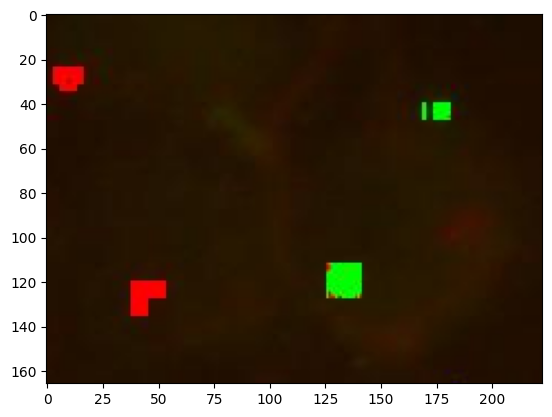

In [ ]:
plt.imshow(image2472_sondas[0:166, 1138:1361])

### Máscara a partir de SAM

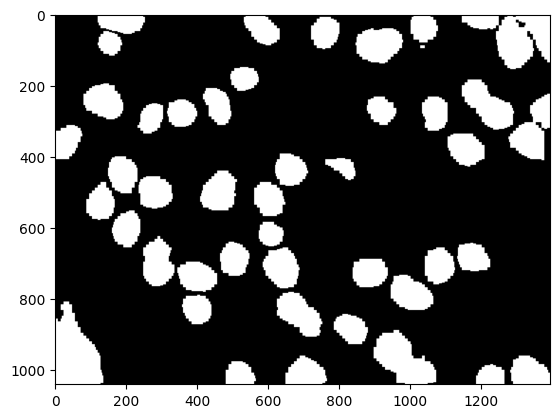

In [ ]:
for x in range(0, cels2472_sam.shape[0]):
  for y in range(0, cels2472_sam.shape[1]):
    if cels2472_sam[x][y] != 0:
      cels2472_sam[x][y] = 1
plt.imshow(cels2472_sam.astype(float), cmap = 'gray')

Propiedades de las regiones:
Región 1: Área = 6048, BoundingBox = (0, 120, 56, 253)
Región 2: Área = 6160, BoundingBox = (0, 531, 88, 632)
Región 3: Área = 4896, BoundingBox = (0, 1000, 80, 1077)
Región 4: Área = 21552, BoundingBox = (0, 1144, 155, 1392)


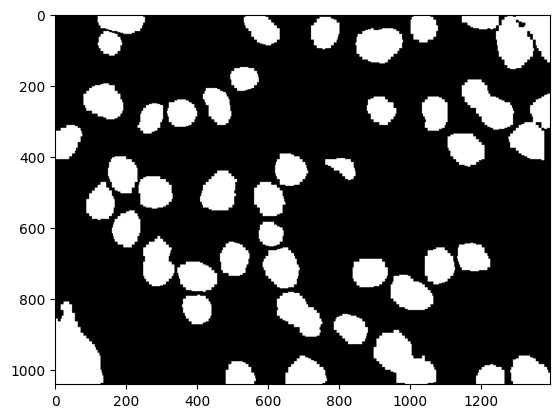

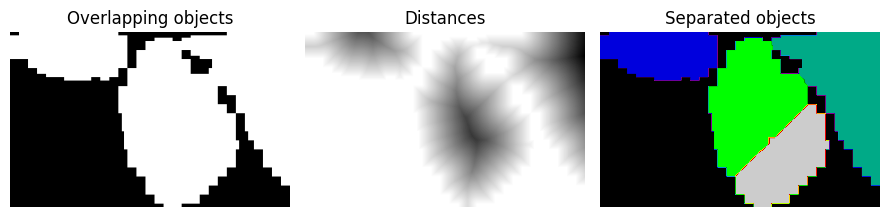

Región 5: Área = 5768, BoundingBox = (8, 720, 99, 800)
Región 6: Área = 10248, BoundingBox = (40, 845, 139, 979)


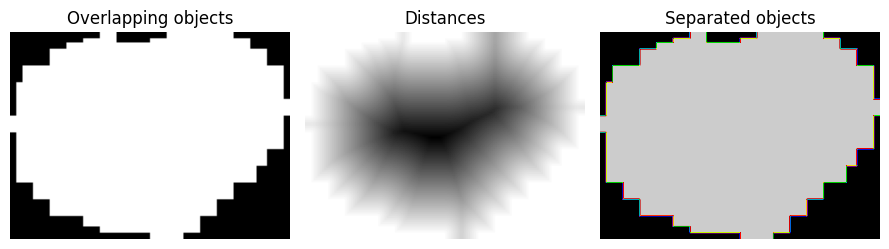

Región 7: Área = 3464, BoundingBox = (48, 120, 117, 189)
Región 9: Área = 4256, BoundingBox = (149, 493, 216, 573)
Región 10: Área = 11768, BoundingBox = (184, 1144, 325, 1291)


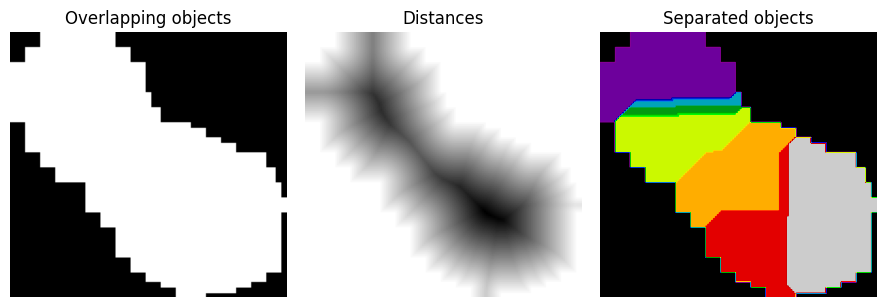

Región 11: Área = 8440, BoundingBox = (195, 80, 296, 192)
Región 12: Área = 5912, BoundingBox = (208, 416, 312, 496)
Región 13: Área = 11952, BoundingBox = (224, 1275, 411, 1392)


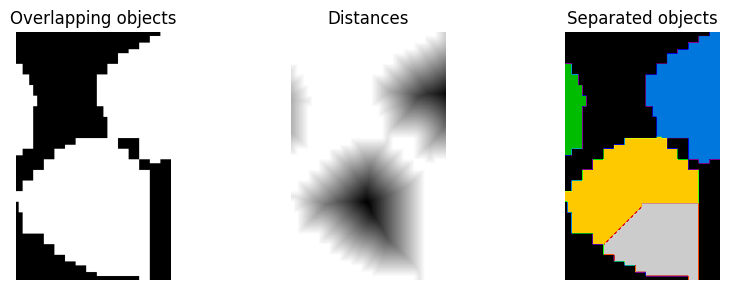

Región 14: Área = 4848, BoundingBox = (232, 877, 312, 960)
Región 15: Área = 5800, BoundingBox = (232, 1032, 328, 1104)
Región 16: Área = 5176, BoundingBox = (240, 315, 317, 400)
Región 17: Área = 4544, BoundingBox = (251, 232, 336, 304)
Región 18: Área = 5696, BoundingBox = (312, 0, 408, 77)
Región 19: Área = 7464, BoundingBox = (336, 1104, 429, 1208)
Región 20: Área = 6512, BoundingBox = (392, 619, 483, 712)
Región 21: Área = 6896, BoundingBox = (400, 149, 504, 232)
Región 22: Área = 3168, BoundingBox = (405, 760, 467, 845)
Región 23: Área = 8776, BoundingBox = (440, 408, 552, 512)
Región 24: Área = 7144, BoundingBox = (456, 235, 547, 331)
Región 25: Área = 6224, BoundingBox = (472, 88, 579, 168)
Región 26: Área = 6552, BoundingBox = (472, 560, 568, 648)
Región 27: Área = 6312, BoundingBox = (552, 160, 656, 240)
Región 28: Área = 3856, BoundingBox = (584, 573, 653, 643)
Región 29: Área = 9168, BoundingBox = (624, 248, 765, 336)


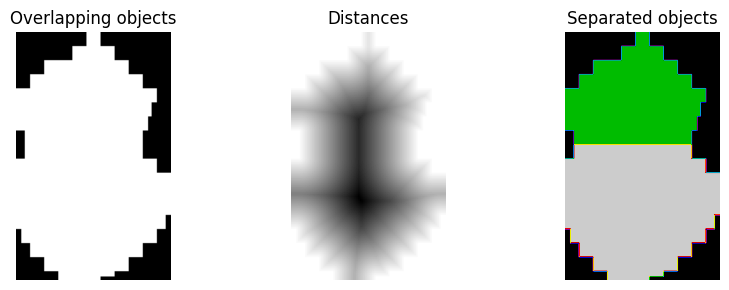

Región 30: Área = 6232, BoundingBox = (640, 464, 736, 547)
Región 31: Área = 5952, BoundingBox = (643, 1131, 723, 1224)
Región 32: Área = 8768, BoundingBox = (656, 584, 771, 688)
Región 33: Área = 6920, BoundingBox = (656, 1040, 760, 1125)
Región 34: Área = 6768, BoundingBox = (688, 837, 768, 936)
Región 35: Área = 7384, BoundingBox = (696, 344, 781, 456)
Región 36: Área = 8832, BoundingBox = (733, 944, 832, 1064)
Región 37: Área = 10128, BoundingBox = (781, 624, 907, 752)


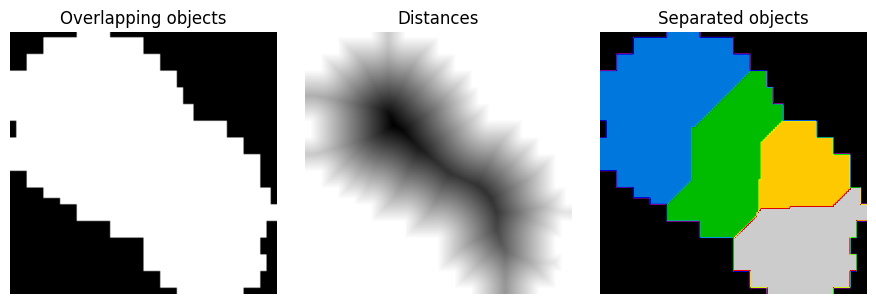

Región 38: Área = 5488, BoundingBox = (789, 357, 872, 440)
Región 39: Área = 21136, BoundingBox = (808, 0, 1040, 136)


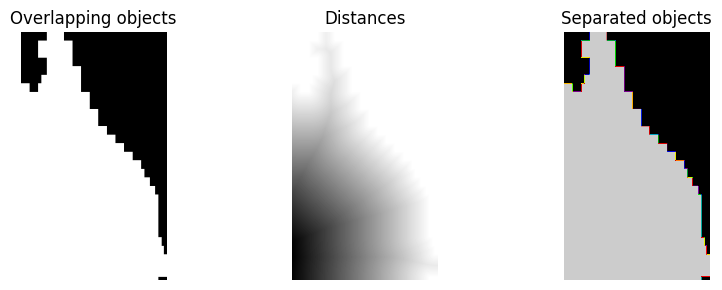

Región 40: Área = 5952, BoundingBox = (843, 784, 928, 880)
Región 41: Área = 15872, BoundingBox = (888, 896, 1040, 1072)


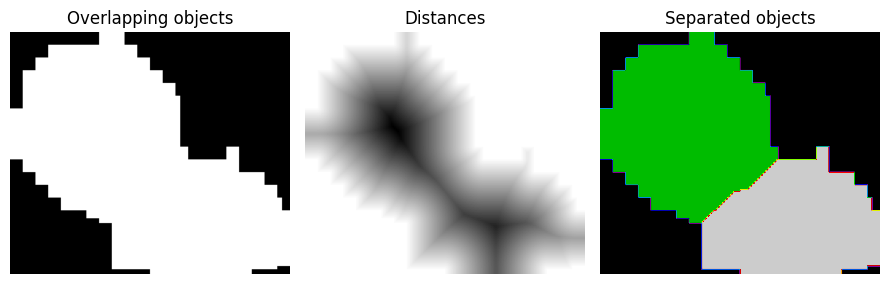

Región 42: Área = 6896, BoundingBox = (960, 648, 1040, 765)
Región 43: Área = 7160, BoundingBox = (960, 1280, 1040, 1392)
Región 44: Área = 4456, BoundingBox = (976, 480, 1040, 565)
Región 45: Área = 3728, BoundingBox = (984, 1184, 1040, 1264)


In [ ]:
boxes = []
boxes_big = []
labels_ar = []
min_area = 3000
label_image = label(cels2472_sam)
regions = regionprops(label_image)
bw_filtered = np.zeros_like(cels2472_sam)
for region in regions:
    if min_area <= region.area:
        bw_filtered[label_image == region.label] = 1
masc_cels2472_sam = np.zeros([bw_filtered.shape[0],bw_filtered.shape[1], 3])
plt.imshow(bw_filtered, cmap = 'gray')
props = regionprops(label_image)
print("Propiedades de las regiones:")
for i, prop in enumerate(props):
    if prop.area > 3000:
      print(f"Región {i + 1}: Área = {prop.area}, BoundingBox = {prop.bbox}")
      if prop.area > 9000:
        boxes_big.append(image2472_sondas[prop.bbox[0]:prop.bbox[2], prop.bbox[1]:prop.bbox[3]])
        reg = bw_filtered[prop.bbox[0]:prop.bbox[2], prop.bbox[1]:prop.bbox[3]]
        distance = ndi.distance_transform_edt(reg)
        coords = peak_local_max(distance.astype(int), footprint=np.ones((50, 50)), labels=reg.astype(int))
        mask = np.zeros(distance.shape, dtype=bool)
        mask[tuple(coords.T)] = True
        markers, _ = ndi.label(mask)
        labels = watershed(-distance, markers, mask=reg)

        fig, axes = plt.subplots(ncols=3, figsize=(9, 3), sharex=True, sharey=True)
        ax = axes.ravel()



        ax[0].imshow(reg, cmap=plt.cm.gray)
        ax[0].set_title('Overlapping objects')
        ax[1].imshow(-distance, cmap=plt.cm.gray)
        ax[1].set_title('Distances')
        ax[2].imshow(labels, cmap=plt.cm.nipy_spectral)
        ax[2].set_title('Separated objects')

        for a in ax:
            a.set_axis_off()

        fig.tight_layout()
        plt.show()
        labels_ar.append(labels)

        for x in range(prop.bbox[0], prop.bbox[2]):
          for y in range(prop.bbox[1], prop.bbox[3]):
            if labels[x-prop.bbox[0]][y-prop.bbox[1]] != 0:
              if labels[x-prop.bbox[0]][y-prop.bbox[1]] == 1:
                masc_cels2472_sam[x][y][0] = 0
                masc_cels2472_sam[x][y][1] = 153
                masc_cels2472_sam[x][y][2] = 0
              elif labels[x-prop.bbox[0]][y-prop.bbox[1]] == 2:
                masc_cels2472_sam[x][y][0] = 153
                masc_cels2472_sam[x][y][1] = 0
                masc_cels2472_sam[x][y][2] = 153
              else:
                masc_cels2472_sam[x][y][0] = 255
                masc_cels2472_sam[x][y][1] = 255
                masc_cels2472_sam[x][y][2] = 0
      else:

        boxes.append([prop.bbox[0], prop.bbox[2], prop.bbox[1], prop.bbox[3]])
# La célula mayor de 10000 creo que es un error causado por un artefacto

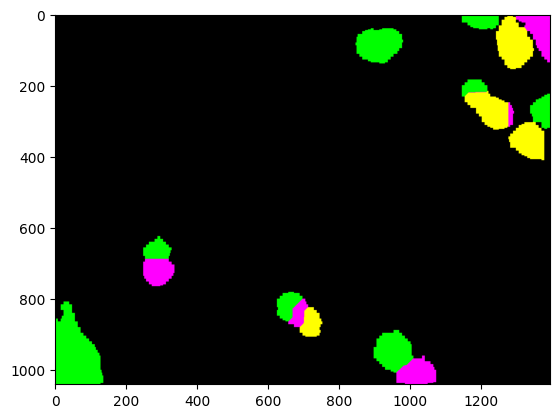

In [ ]:
plt.imshow(masc_cels2472_sam)

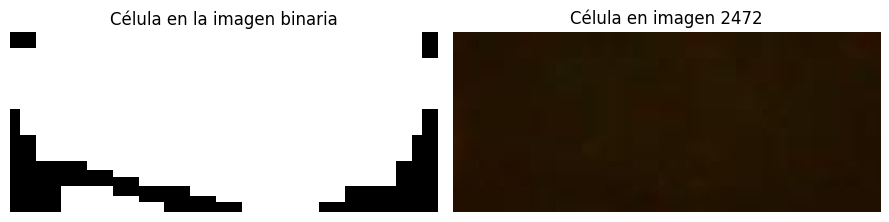

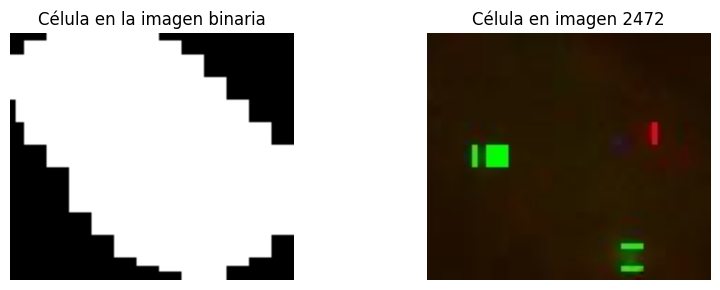

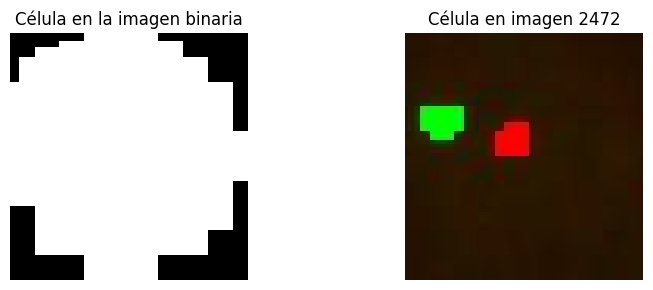

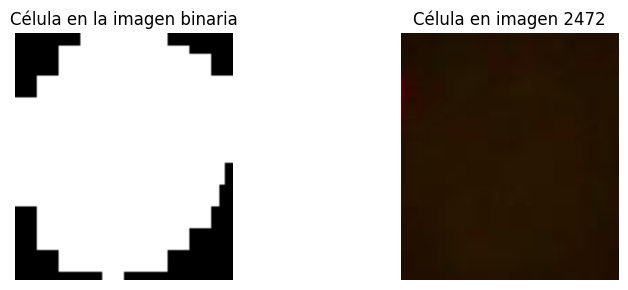

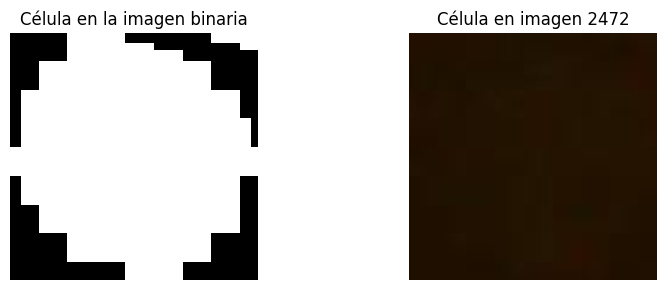

...

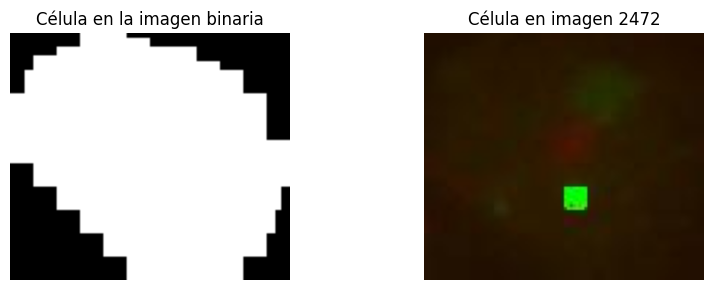

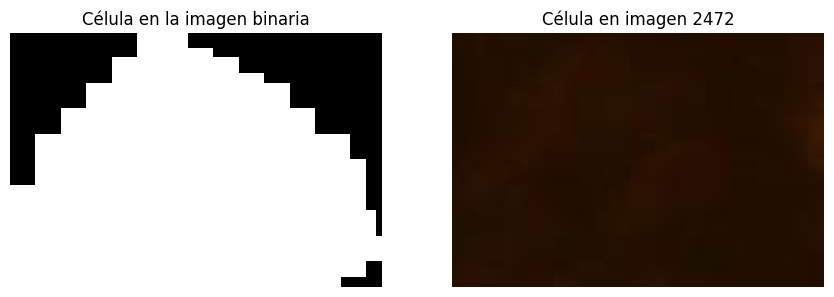

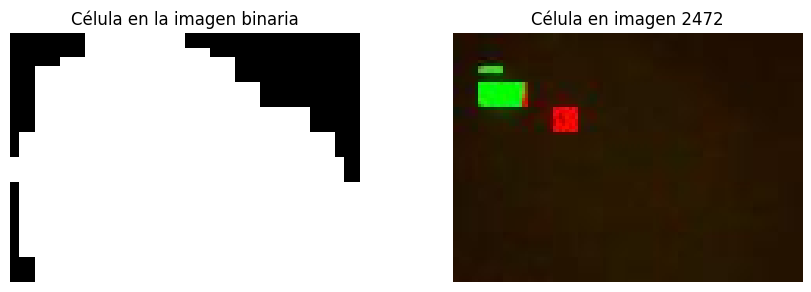

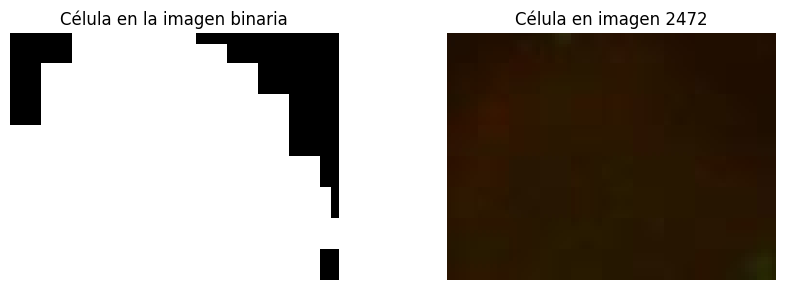

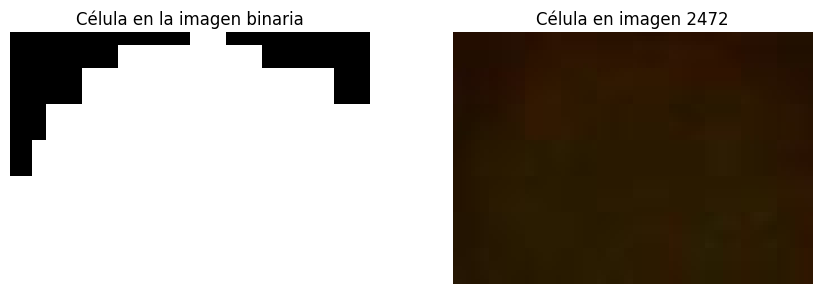

In [ ]:
for box in boxes:
  fig, axes = plt.subplots(ncols=2, figsize=(9, 3), sharex=True, sharey=True)
  ax = axes.ravel()
  for x in range(box[0], box[1]):
    for y in range(box[2], box[3]):
      if bw_filtered[x][y] == 1:
        masc_cels2472_sam[x][y][0] = 255
        masc_cels2472_sam[x][y][1] = 0
        masc_cels2472_sam[x][y][2] = 255


  ax[0].imshow(bw_filtered[box[0]:box[1], box[2]:box[3]], cmap=plt.cm.gray)
  ax[0].set_title('Célula en la imagen binaria')
  ax[1].imshow(image2472_sondas[box[0]:box[1], box[2]:box[3]])
  ax[1].set_title('Célula en imagen 2472')

  for a in ax:
    a.set_axis_off()

  fig.tight_layout()
  plt.show()

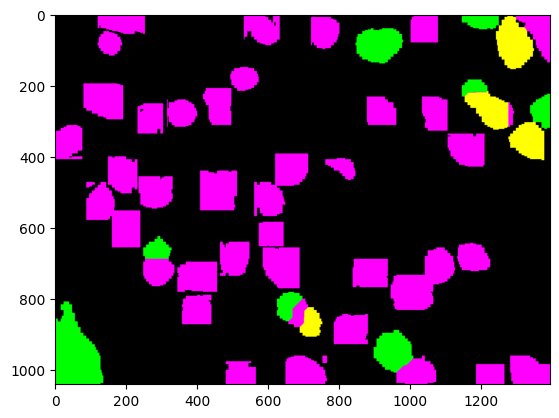

In [ ]:
plt.imshow(masc_cels2472_sam)

In [ ]:
image = Image.fromarray(masc_cels2472_sam.astype(np.uint8))
image.save('masc_cels2472_sam.jpg')